In [2]:
!pip install numba==0.53.1 numpy pandas tensorflow nltk matplotlib shap torch sklearn yellowbrick transformers dill

In [3]:
import numpy as np
import pandas as pd
import tensorflow as tf
import nltk
import nltk.corpus
import re
import matplotlib.pyplot as plt
import torch
import shap
import copy
import dill

from sklearn.feature_extraction.text import CountVectorizer
from yellowbrick.text import FreqDistVisualizer
from sklearn.model_selection import train_test_split
from sklearn import neural_network

from transformers import BertTokenizer, BertModel
from sklearn.preprocessing import LabelEncoder

tf.get_logger().setLevel('ERROR')

2023-03-29 08:56:26.652799: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-03-29 08:56:27.428655: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer.so.7'; dlerror: libnvinfer.so.7: cannot open shared object file: No such file or directory
2023-03-29 08:56:27.428730: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer_plugin.so.7'; dlerror: libnvinfer_plugin.so.7: cannot open shared object file: No such file or directory
2023-03-29 08:56:27.428737: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Cannot dlopen some TensorRT libraries. If you would like to use Nv

In [3]:
nltk.download('stopwords')
nltk.download('punkt')
nltk.download('wordnet')

[nltk_data] Downloading package stopwords to
[nltk_data]     /home/bkapteijns/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt to /home/bkapteijns/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package wordnet to
[nltk_data]     /home/bkapteijns/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


True

In [4]:
df = pd.read_csv("Tweets.csv")
df[["airline_sentiment","text"]].head()

,airline_sentiment,text
0,neutral,@VirginAmerica What @dhepburn said.
1,positive,@VirginAmerica plus you've added commercials t...
2,neutral,@VirginAmerica I didn't today... Must mean I n...
3,negative,@VirginAmerica it's really aggressive to blast...
4,negative,@VirginAmerica and it's a really big bad thing...


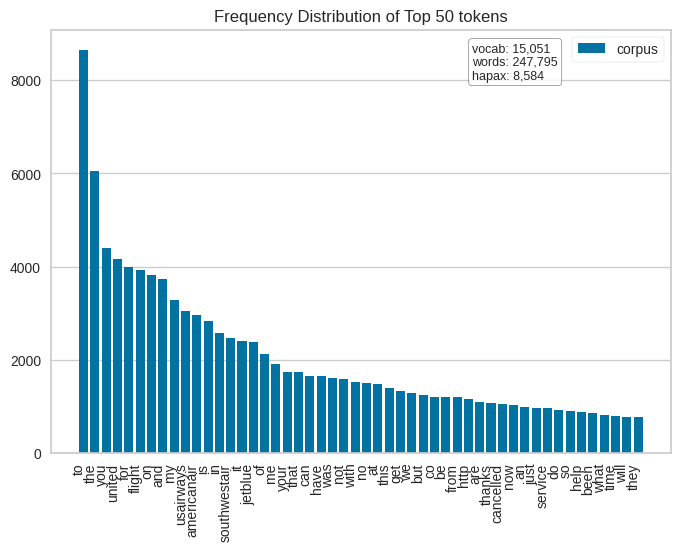

<Axes: title={'center': 'Frequency Distribution of Top 50 tokens'}>

In [5]:
%matplotlib inline
vectorizer = CountVectorizer()
docs       = vectorizer.fit_transform(df["text"])
features   = vectorizer.get_feature_names_out()
visualizer = FreqDistVisualizer(features=features, orient='v')
visualizer.fit(docs)
visualizer.show()

In [6]:
text = df["text"]
labels = df["airline_sentiment"]

print(text.shape, labels.shape)

(14640,) (14640,)


In [7]:
# remove digits, @-mentions, links, stopwords

text = text.str.lower()
text = text.apply(lambda elem: re.sub(r"@[a-zA-Z0-9-]+", "", elem))
text = text.apply(lambda elem: re.sub(r"(https?:\/\/(?:www\.|(?!www))[a-zA-Z0-9][a-zA-Z0-9-]+[a-zA-Z0-9]\.[^\s]{2,}|www\.[a-zA-Z0-9][a-zA-Z0-9-]+[a-zA-Z0-9]\.[^\s]{2,}|https?:\/\/(?:www\.|(?!www))[a-zA-Z0-9]+\.[^\s]{2,}|www\.[a-zA-Z0-9]+\.[^\s]{2,})", "", elem))
text = text.apply(lambda x : nltk.word_tokenize(x))
text = text.apply(lambda x : " ".join([word for word in x if word not in (nltk.corpus.stopwords.words() + ["rt"])]))

text.shape

(14640,)

In [8]:
# import pickle
# with open("text.pkl", "wb") as f:
#   pickle.dump(text, f)
# with open("labels.pkl", "wb") as f:
#   pickle.dump(labels, f)

In [9]:
# with open("text.pkl", "rb") as f:
#   text = pickle.load(f)
# with open("labels.pkl", "rb") as f:
#   labels = pickle.load(f)

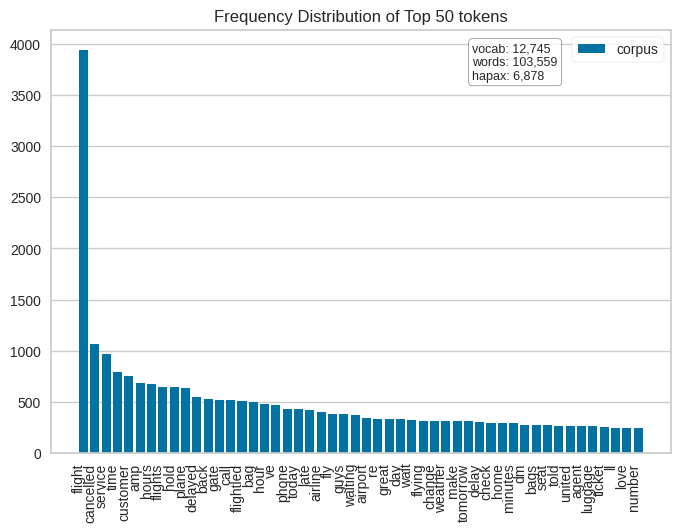

<Axes: title={'center': 'Frequency Distribution of Top 50 tokens'}>

In [10]:
%matplotlib inline
vectorizer = CountVectorizer()
docs       = vectorizer.fit_transform(text)
features   = vectorizer.get_feature_names_out()
visualizer = FreqDistVisualizer(features=features, orient='v')
visualizer.fit(docs)
visualizer.show()

In [11]:
tokenizer = BertTokenizer.from_pretrained("bert-base-uncased")
model = BertModel.from_pretrained("bert-base-uncased")

Some weights of the model checkpoint at bert-base-uncased were not used when initializing BertModel: ['cls.predictions.transform.LayerNorm.weight', 'cls.predictions.transform.dense.bias', 'cls.predictions.transform.LayerNorm.bias', 'cls.predictions.bias', 'cls.predictions.transform.dense.weight', 'cls.seq_relationship.bias', 'cls.seq_relationship.weight', 'cls.predictions.decoder.weight']
- This IS expected if you are initializing BertModel from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing BertModel from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).


In [12]:
lengths = []

X = text
for i in range(len(text)):
  X[i] = tokenizer.tokenize(X[i])
  X[i] = tokenizer.convert_tokens_to_ids(X[i])

for i in range(len(X)):
  lengths.append(len(X[i]))

In [13]:
lengths = np.array(lengths)
X = np.array(X)

print(np.sum((lengths < 64) & (labels == "positive")), np.mean((lengths < 64) & (labels == "positive")))
print(np.sum((lengths < 64) & (labels == "neutral")), np.mean((lengths < 64) & (labels == "neutral")))
print(np.sum((lengths < 64) & (labels == "negative")), np.mean((lengths < 64) & (labels == "negative")))

2363 0.16140710382513662
3099 0.21168032786885246
9178 0.6269125683060109


In [14]:
X_positive = X[(lengths < 64) & (labels == "positive")].tolist()
X_neutral = X[(lengths < 64) & (labels == "neutral")].tolist()
X_negative = X[(lengths < 64) & (labels == "negative")].tolist()
X = X_positive[:2000] + X_negative[:2000]

y_positive = labels[(lengths < 64) & (labels == "positive")].tolist()
y_neutral = labels[(lengths < 64) & (labels == "neutral")].tolist()
y_negative = labels[(lengths < 64) & (labels == "negative")].tolist()
y = y_positive[:2000] + y_negative[:2000]

In [15]:
X_train, X_test, y_train, y_test = train_test_split(np.array(X), np.array(y), train_size=500, shuffle=True)

X_test = X_test[:100]
y_test = y_test[:100]

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.


In [16]:
model.config.max_position_embeddings = 64
max_length = model.config.max_position_embeddings

X_train_padded = []
X_test_padded = []

for i in range(len(X_train)):
  X_train_padded.append(X_train[i] + [0] * (max_length - len(X_train[i])))
for i in range(len(X_test)):
  X_test_padded.append(X_test[i] + [0] * (max_length - len(X_test[i])))

X_train_padded = torch.from_numpy(np.array(X_train_padded))
X_test_padded = torch.from_numpy(np.array(X_test_padded))

In [17]:
bert_train_output = model(X_train_padded)
print(bert_train_output)

BaseModelOutputWithPoolingAndCrossAttentions(last_hidden_state=tensor([[[-3.1756e-02,  7.0094e-02,  2.0021e-01,  ..., -5.7299e-01,
           3.3721e-01, -1.0006e-01],
         [-1.6544e-01,  8.5420e-02,  4.0288e-01,  ..., -5.4248e-01,
          -5.4448e-02,  2.4520e-02],
         [-2.4258e-01,  1.1332e-02,  3.9040e-01,  ..., -6.0761e-01,
          -1.3052e-01,  2.9868e-01],
         ...,
         [-7.8439e-02, -1.0762e-01,  2.5923e-01,  ..., -4.4993e-01,
           5.0929e-01, -1.0226e-01],
         [-8.9763e-02, -8.9943e-02,  2.5376e-01,  ..., -4.2222e-01,
           5.3204e-01, -1.2208e-01],
         [-1.0227e-01, -5.8755e-02,  2.3679e-01,  ..., -4.2263e-01,
           5.2006e-01, -1.5973e-01]],

        [[-3.7792e-02, -1.1624e-01,  1.1418e-01,  ..., -5.7649e-01,
           7.2155e-01, -1.8893e-04],
         [ 1.9530e-02,  2.1635e-01,  8.1179e-01,  ..., -5.3427e-01,
           3.7594e-01, -3.1617e-01],
         [-1.7106e-01,  3.3323e-01,  6.7356e-01,  ..., -7.1506e-01,
           4.

In [18]:
bert_train_output = bert_train_output[1].detach().numpy().copy()
bert_train_output = bert_train_output.reshape(X_train.shape[0], 768)

In [19]:
bert_test_output = model(X_test_padded)
print(bert_test_output)

BaseModelOutputWithPoolingAndCrossAttentions(last_hidden_state=tensor([[[-0.0165, -0.1354,  0.0930,  ..., -0.6476,  0.4540,  0.0440],
         [-0.2163,  0.4420,  0.2339,  ..., -0.5128,  0.2319,  0.1713],
         [-0.2083,  0.2122,  0.2616,  ..., -0.5684,  0.5342,  0.3148],
         ...,
         [-0.0776, -0.2282,  0.1533,  ..., -0.7252,  0.4399, -0.1312],
         [-0.0806, -0.2140,  0.1579,  ..., -0.7277,  0.4611, -0.1161],
         [-0.0497, -0.2027,  0.1313,  ..., -0.7387,  0.4409, -0.1262]],

        [[-0.0232, -0.0912, -0.0652,  ..., -0.5916,  0.2546,  0.0485],
         [ 0.1606,  0.1587,  0.4803,  ..., -0.4620,  0.3986,  0.3801],
         [ 0.1505,  0.1290,  0.2792,  ..., -0.3434,  0.3559, -0.0138],
         ...,
         [-0.0523, -0.1677, -0.0403,  ..., -0.7448,  0.2320, -0.2010],
         [-0.0625, -0.1478, -0.0370,  ..., -0.7434,  0.2347, -0.1893],
         [-0.0532, -0.1119, -0.0439,  ..., -0.7567,  0.2178, -0.2059]],

        [[-0.5647, -0.3943,  0.0351,  ..., -0.8272,  

In [20]:
bert_test_output = bert_test_output[1].detach().numpy().copy()
bert_test_output = bert_test_output.reshape(X_test.shape[0], 768)

In [21]:
le = LabelEncoder()
le.fit(y_train)

LabelEncoder()

In [22]:
clf = neural_network.MLPClassifier()
clf.fit(bert_train_output, le.transform(y_train))

Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.


MLPClassifier()

In [23]:
print("Train accuracy:", np.mean(clf.predict(bert_train_output) == le.transform(y_train)))
print("Test accuracy:", np.mean(clf.predict(bert_test_output) == le.transform(y_test)))

Train accuracy: 0.864
Test accuracy: 0.78


In [24]:
print(np.unique(y_test))

['negative' 'positive']


In [25]:
np.mean(y_test=="negative")

0.53

In [26]:
dill.dump_session("pre_shap.pkl")
#dill.load_session("pre_shap.pkl")

## SHAP

In [27]:
shap.initjs()

In [28]:
to_explain = np.array(X_test_padded)
to_explain.shape

(100, 64)

In [29]:
def prediction_model(X):
  bert_output = model(torch.from_numpy(np.array(X)).to(torch.int64))
  sequence_output = bert_output[1].detach().numpy()
  return clf.predict(sequence_output.reshape(X.shape[0], 768))

In [4]:
dill.load_session("post_shap.pkl")

In [ ]:
permutation_values = []
for i in range(int(len(to_explain)/20)):
    permutation_explainer = shap.explainers.Permutation(prediction_model, np.array(to_explain[20*i:20*(i+1)]))
    for j in range(20*i, 20*(i+1)):
        permutation_values.append(permutation_explainer(np.array([to_explain[j]])))
        print(i,j)
        dill.dump_session("post_shap.pkl")

Permutation explainer: 2it [04:07, 247.84s/it]                                  


0 0


Permutation explainer: 2it [04:05, 245.57s/it]                                  


0 1


Permutation explainer: 2it [03:09, 189.28s/it]                                  


0 2


Permutation explainer: 2it [02:59, 179.44s/it]                                  


0 3


Permutation explainer: 2it [03:12, 192.32s/it]                                  


0 4


Permutation explainer: 2it [02:52, 172.76s/it]                                  


0 5


Permutation explainer: 2it [03:02, 182.23s/it]                                  


0 6


Permutation explainer: 2it [03:04, 185.00s/it]                                  


0 7


Permutation explainer: 2it [03:25, 205.68s/it]                                  


0 8


Permutation explainer: 2it [02:42, 162.19s/it]                                  


0 9


Permutation explainer: 2it [03:26, 206.58s/it]                                  


0 10


Permutation explainer: 2it [02:40, 160.14s/it]                                  


0 11


Permutation explainer: 2it [02:46, 166.97s/it]                                  


0 12


Permutation explainer: 2it [03:22, 202.71s/it]                                  


0 13


Permutation explainer: 2it [04:17, 257.26s/it]                                  


0 14


Permutation explainer: 2it [02:44, 164.48s/it]                                  


0 15


Permutation explainer: 2it [03:13, 193.48s/it]                                  


0 16


Permutation explainer: 2it [02:46, 166.77s/it]                                  


0 17


Permutation explainer: 2it [03:28, 208.35s/it]                                  


0 18


Permutation explainer: 2it [02:42, 162.39s/it]                                  


0 19


Permutation explainer: 2it [02:44, 164.35s/it]                                  


1 20


Permutation explainer: 2it [04:03, 243.91s/it]                                  


1 21


Permutation explainer: 2it [02:56, 176.52s/it]                                  


1 22


Permutation explainer: 2it [02:31, 151.09s/it]                                  


1 23


Permutation explainer: 2it [01:56, 116.44s/it]                                  


1 24


Permutation explainer: 2it [02:29, 149.89s/it]                                  


1 25


Permutation explainer: 2it [02:30, 150.74s/it]                                  


1 26


Permutation explainer: 2it [02:31, 151.81s/it]                                  


1 27


Permutation explainer: 2it [02:00, 120.10s/it]                                  


1 28


Permutation explainer: 2it [01:57, 117.55s/it]                                  


1 29


Permutation explainer: 2it [02:08, 128.13s/it]                                  


1 30


Permutation explainer: 2it [02:05, 125.67s/it]                                  


1 31


Permutation explainer: 2it [03:11, 191.15s/it]                                  


1 32


Permutation explainer: 2it [02:42, 162.18s/it]                                  


1 33


Permutation explainer: 2it [02:03, 123.74s/it]                                  


1 34


Permutation explainer: 2it [01:57, 117.44s/it]                                  


1 35


Permutation explainer: 2it [02:01, 121.41s/it]                                  


1 36


Permutation explainer: 2it [02:32, 152.47s/it]                                  


1 37


Permutation explainer: 2it [02:25, 145.77s/it]                                  


1 38


Permutation explainer: 2it [02:43, 163.86s/it]                                  


1 39


Permutation explainer: 2it [02:20, 140.09s/it]                                  


2 40


Permutation explainer: 2it [01:53, 113.81s/it]                                  


2 41


Permutation explainer: 2it [02:44, 164.68s/it]                                  


2 42


Permutation explainer: 2it [01:55, 115.56s/it]                                  


2 43


Permutation explainer: 2it [02:43, 163.59s/it]                                  


2 44


Permutation explainer: 2it [02:28, 148.13s/it]                                  


2 45


Permutation explainer: 2it [02:47, 167.51s/it]                                  


2 46


Permutation explainer: 2it [01:55, 115.73s/it]                                  


2 47


Permutation explainer: 2it [02:48, 168.50s/it]                                  


2 48


Permutation explainer: 2it [02:16, 136.04s/it]                                  


2 49


Permutation explainer: 2it [03:59, 239.13s/it]                                  


2 50


Permutation explainer: 2it [03:29, 209.58s/it]                                  


2 51


Permutation explainer: 2it [01:57, 117.31s/it]                                  


2 52


Permutation explainer: 2it [01:57, 117.12s/it]                                  


2 53


Permutation explainer: 2it [02:42, 162.72s/it]                                  


2 54


Permutation explainer: 2it [02:14, 134.04s/it]                                  


2 55


Permutation explainer: 2it [01:57, 117.40s/it]                                  


2 56


Permutation explainer: 2it [02:06, 126.44s/it]                                  


2 57


Permutation explainer: 2it [02:09, 129.14s/it]                                  


2 58


Permutation explainer: 2it [02:45, 165.43s/it]                                  


2 59


Permutation explainer: 2it [02:44, 164.44s/it]                                  


3 60


Permutation explainer: 2it [02:30, 150.44s/it]                                  


3 61


Permutation explainer: 2it [03:41, 221.20s/it]                                  


3 62


Permutation explainer: 2it [03:05, 185.90s/it]                                  


3 63


Permutation explainer: 2it [02:33, 153.25s/it]                                  


3 64


Permutation explainer: 2it [02:32, 152.95s/it]                                  


3 65


Permutation explainer: 2it [03:52, 232.37s/it]                                  


3 66


Permutation explainer: 2it [02:28, 148.02s/it]                                  


3 67


Permutation explainer: 2it [02:29, 149.17s/it]                                  


3 68


Permutation explainer: 2it [03:06, 186.41s/it]                                  


3 69


Permutation explainer: 2it [02:37, 157.46s/it]                                  


3 70


Permutation explainer: 2it [03:02, 182.81s/it]                                  


3 71


Permutation explainer: 2it [04:29, 269.04s/it]                                  


3 72


Permutation explainer: 2it [03:27, 207.49s/it]                                  


3 73


Permutation explainer: 2it [03:59, 239.32s/it]                                  


3 74


Permutation explainer: 2it [03:02, 182.23s/it]                                  


3 75


Permutation explainer: 2it [03:16, 196.21s/it]                                  


3 76


Permutation explainer: 2it [02:57, 177.71s/it]                                  


3 77


Permutation explainer: 2it [02:51, 171.93s/it]                                  


3 78


Permutation explainer: 2it [03:02, 182.86s/it]                                  


3 79


Permutation explainer: 2it [03:21, 201.60s/it]                                  


4 80


Permutation explainer: 2it [02:58, 178.11s/it]                                  


4 81


Permutation explainer: 2it [02:35, 155.07s/it]                                  


4 82


Permutation explainer: 2it [02:29, 149.33s/it]                                  


4 83


Permutation explainer: 2it [02:41, 161.13s/it]                                  


4 84


Permutation explainer: 2it [03:07, 187.31s/it]                                  


4 85


In [7]:
permutation_explainer = shap.explainers.Permutation(prediction_model, np.array(to_explain[20*4:20*(4+1)]))
for j in range(20*4, 20*(4+1)):
    permutation_values.append(permutation_explainer(np.array([to_explain[j]])))
    print(4,j)
    dill.dump_session("post_shap.pkl")

Permutation explainer: 2it [03:14, 194.02s/it]                                  


4 80


Permutation explainer: 2it [02:56, 176.89s/it]                                  


4 81


Permutation explainer: 2it [02:31, 151.48s/it]                                  


4 82


Permutation explainer: 2it [02:28, 148.63s/it]                                  


4 83


Permutation explainer: 2it [02:47, 167.75s/it]                                  


4 84


Permutation explainer: 2it [03:04, 184.14s/it]                                  


4 85


Permutation explainer: 2it [02:31, 151.90s/it]                                  


4 86


Permutation explainer: 2it [02:32, 152.70s/it]                                  


4 87


Permutation explainer: 2it [02:36, 156.48s/it]                                  


4 88


Permutation explainer: 2it [04:19, 259.95s/it]                                  


4 89


Permutation explainer: 2it [02:56, 176.19s/it]                                  


4 90


Permutation explainer: 2it [02:32, 152.57s/it]                                  


4 91


Permutation explainer: 2it [02:26, 146.38s/it]                                  


4 92


Permutation explainer: 2it [02:52, 172.74s/it]                                  


4 93


Permutation explainer: 2it [03:00, 180.70s/it]                                  


4 94


Permutation explainer: 2it [03:09, 189.22s/it]                                  


4 95


Permutation explainer: 2it [04:01, 241.20s/it]                                  


4 96


Permutation explainer: 2it [03:46, 226.44s/it]                                  


4 97


Permutation explainer: 2it [02:50, 170.49s/it]                                  


4 98


Permutation explainer: 2it [02:18, 138.72s/it]                                  


4 99


In [8]:
perm_vals = {"values": [], "base_values": [], "data": []}
for pv in permutation_values:
    perm_vals["values"].append(pv.values[0])
    perm_vals["base_values"].append(pv.base_values[0])
    perm_vals["data"].append(pv.data[0])
print(perm_vals)

{'values': [array([-1.11111111e-01,  2.50000000e-02,  2.77777778e-03,  2.22222222e-02,
       -2.22222222e-02,  8.33333333e-03,  1.11111111e-02, -3.88888889e-02,
       -3.61111111e-02,  0.00000000e+00, -1.66666667e-02, -2.77777778e-03,
       -2.77777778e-03, -2.50000000e-02, -1.94444444e-02,  1.38888889e-02,
       -8.33333333e-03, -1.11111111e-02, -3.88888889e-02, -1.11111111e-02,
       -2.22222222e-02,  3.08395285e-18, -1.66666667e-02,  0.00000000e+00,
        0.00000000e+00,  0.00000000e+00,  0.00000000e+00,  0.00000000e+00,
        0.00000000e+00,  0.00000000e+00,  0.00000000e+00,  0.00000000e+00,
        0.00000000e+00,  0.00000000e+00,  0.00000000e+00,  0.00000000e+00,
        0.00000000e+00,  0.00000000e+00,  0.00000000e+00,  0.00000000e+00,
        0.00000000e+00,  0.00000000e+00,  0.00000000e+00,  0.00000000e+00,
        0.00000000e+00,  0.00000000e+00,  0.00000000e+00,  0.00000000e+00,
        0.00000000e+00,  0.00000000e+00,  0.00000000e+00,  0.00000000e+00,
        0.000

Sentence: found flight 2 . 5 hr ##s . offered $ 200 flight vo ##ucher 12 hr ##s , lose seat neglect , ? ; Prediction: [0] ; True value: negative


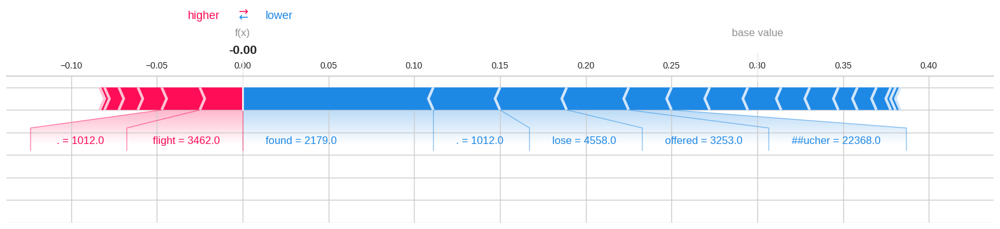

Sentence: encourage re - interview sole flight attendant ua ##l 61 ##66 bu ##f or ##d . b ##lat ##antly stable . uncomfortable . ; Prediction: [0] ; True value: negative


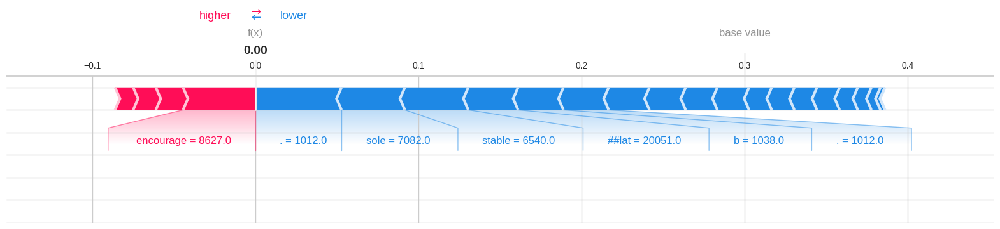

Sentence: issue express sf ##o . positive note : mainline p . s . enjoyable . ; Prediction: [0] ; True value: negative


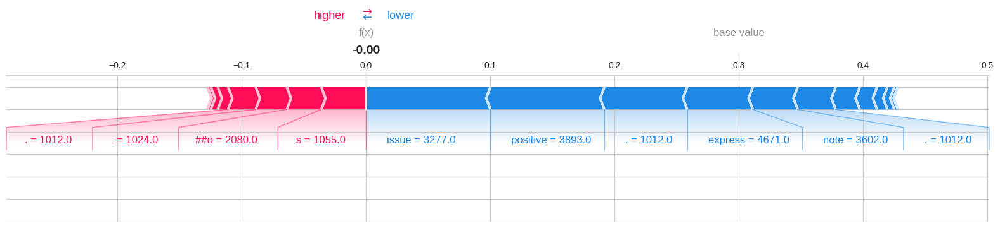

Sentence: pushing hours time worth . ref ##light booking problems option unfortunately . ; Prediction: [0] ; True value: negative


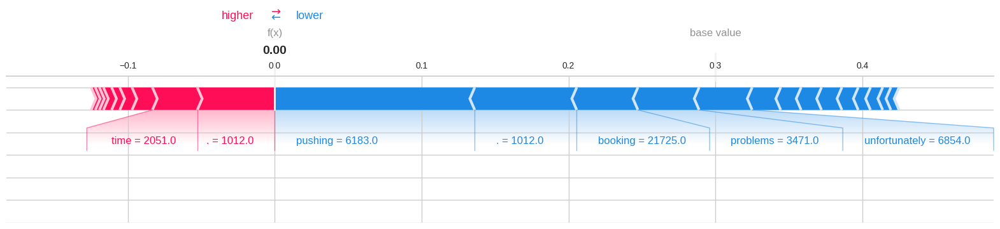

Sentence: assume 300 united ? ' s worse plane crew n ' t fly ! ! ; Prediction: [0] ; True value: negative


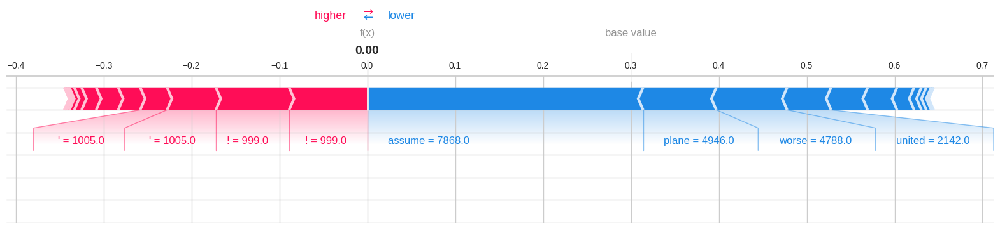

Sentence: great job losing bags direct flight . n ' t manage . ; Prediction: [0] ; True value: negative


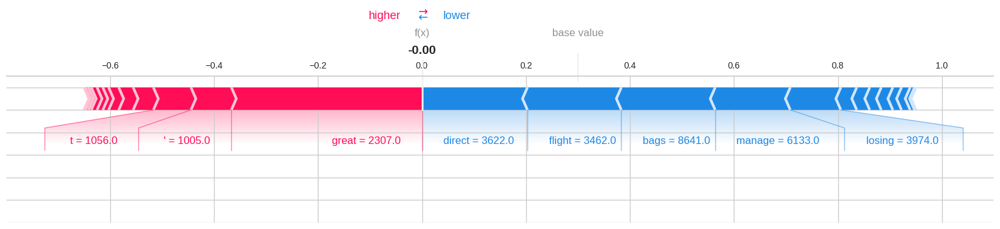

Sentence: v ##x ##39 ##9 j ##fk - dirty plane - standards . ; Prediction: [1] ; True value: negative


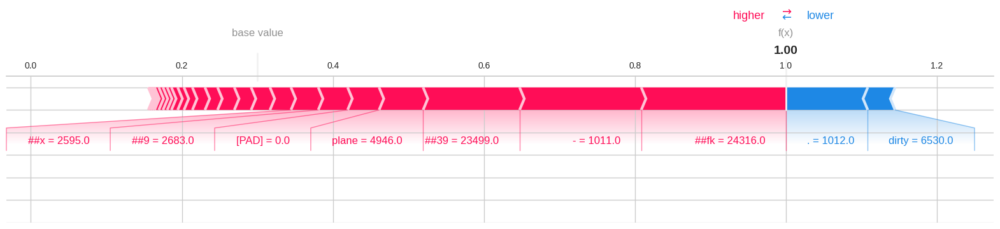

Sentence: late flight , future flights , train staff handle emergency situations , ground staff customer service ; Prediction: [0] ; True value: negative


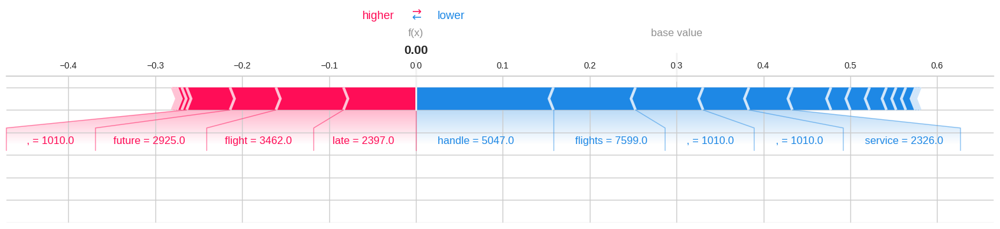

Sentence: loyal ' m driving # nyc # , fly virgin , cut # phil ##ly flights ; ) ; Prediction: [1] ; True value: positive


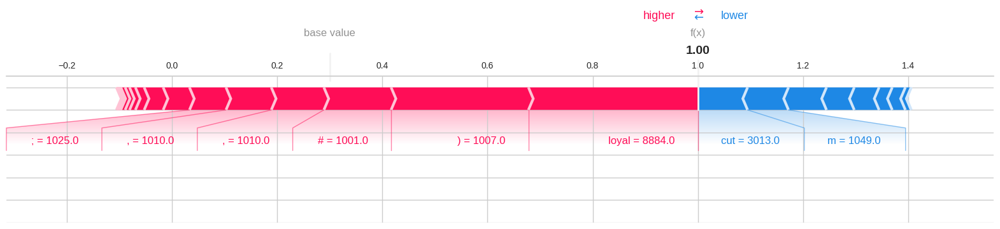

Sentence: 4 great flights delays ! ! ; Prediction: [1] ; True value: positive


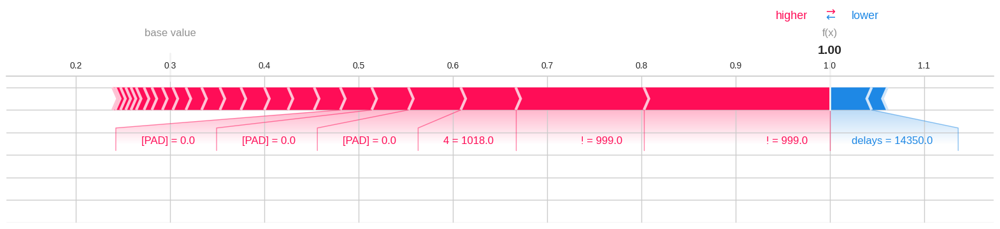

Sentence: left computer plane . weeks late flight ##r found . # great ##ser ##vic ##e . # happy # customer ; Prediction: [0] ; True value: positive


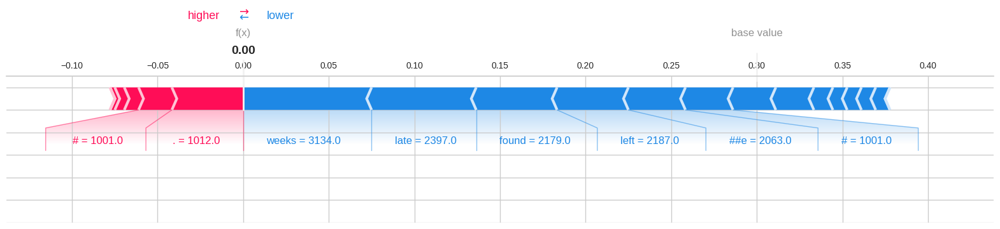

Sentence: change flight times phone disconnected time . ; Prediction: [0] ; True value: negative


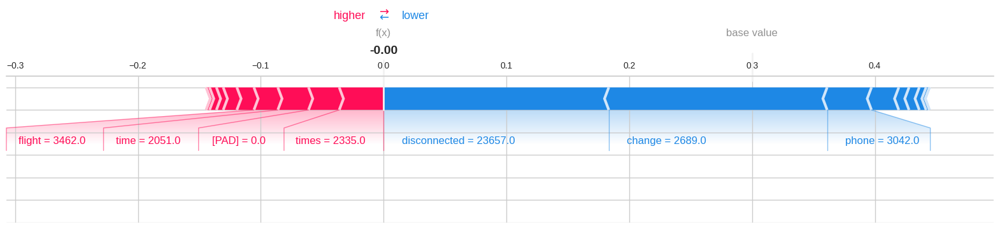

Sentence: great start vacation time departure ! forward global class suite ! ; Prediction: [1] ; True value: positive


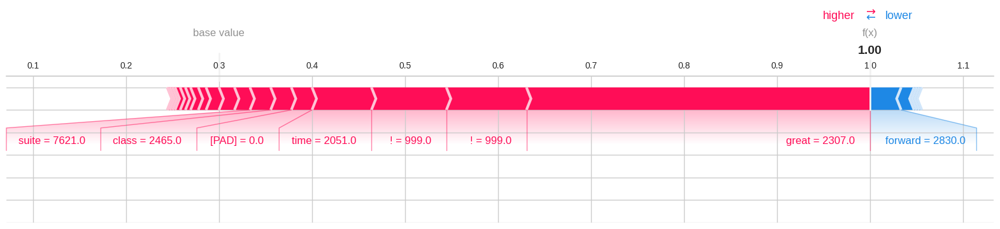

Sentence: failed un ##con ##tro ##lla ##bly today ' s repair . ' m liv ##id absolute disregard operations . ; Prediction: [0] ; True value: negative


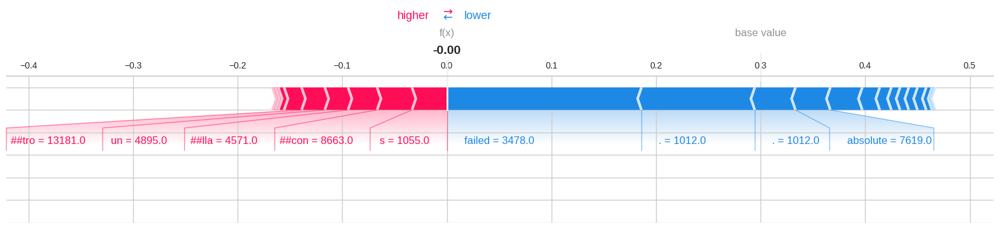

Sentence: lost luggage 4 days ago flight v ##x 112 lax ia ##d & amp ; ' m calling day , response . please give back stuff ; Prediction: [0] ; True value: negative


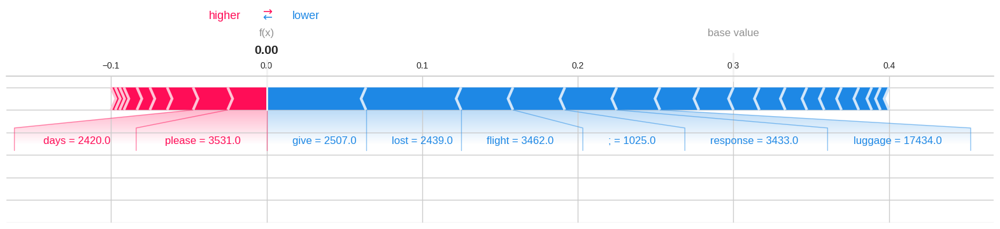

Sentence: flying guys . customer service piss poor . ; Prediction: [0] ; True value: negative


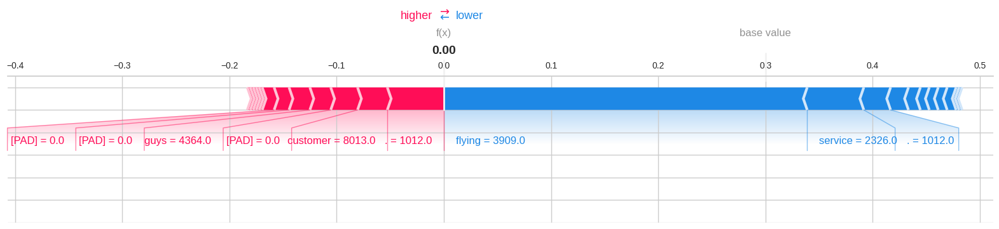

Sentence: stuck tar ##mac 2 hours . . . miss ride ! # help ##im ##st ##uck # united ; Prediction: [0] ; True value: negative


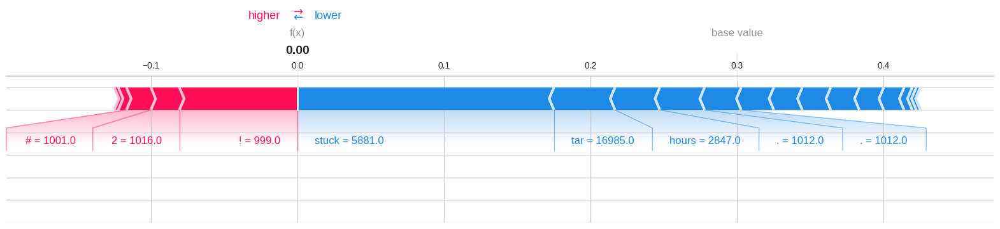

Sentence: ' s ' m wearing # true ##bl ##ue ##color ##s ! ; Prediction: [1] ; True value: positive


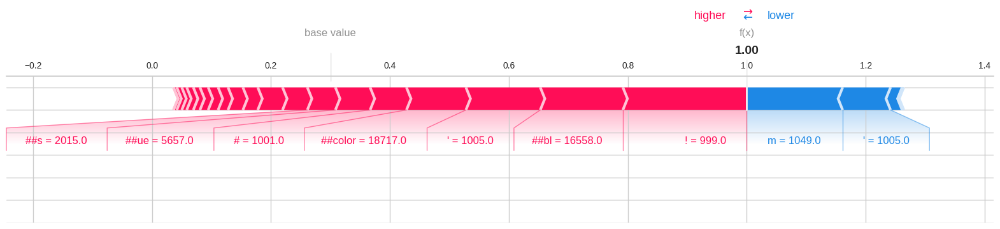

Sentence: ' m # making ##lov ##eo ##uto ##f ##not ##hing ##atal ##l # brand ##lov ##ea ##ffa ##ir # lax ; Prediction: [1] ; True value: positive


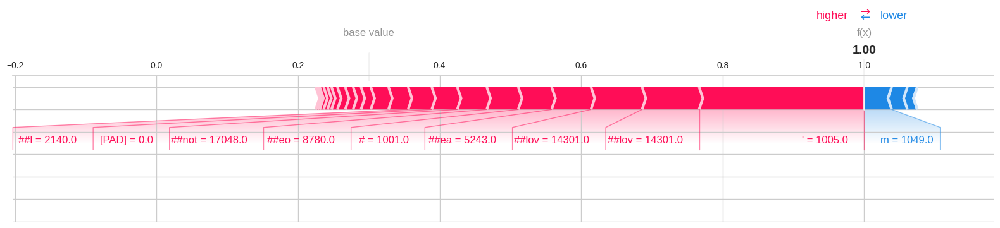

Sentence: ha ##ha worries guys ! + 1 spelling correctly ; Prediction: [0] ; True value: positive


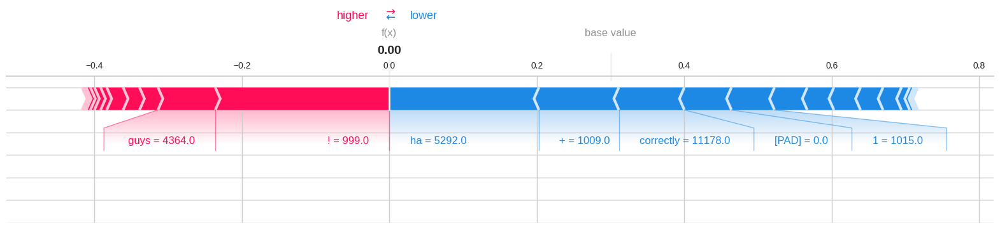

Sentence: lost sunglasses flight ok ##c ia ##h morning ( 8 ##am takeoff ) . . retrieve ? ; Prediction: [0] ; True value: negative


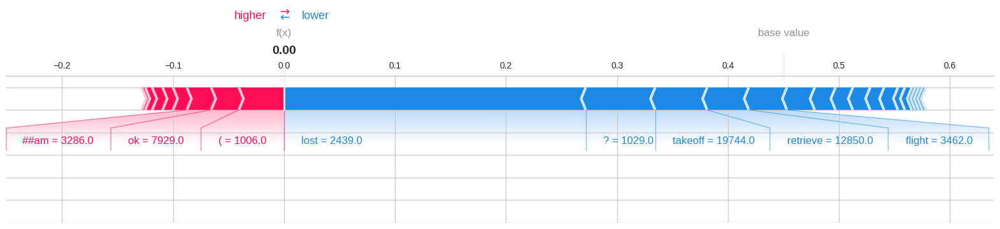

Sentence: lost bag process broken . agent promised ' d call & amp ; hold bag found . ' re waking 3a ##m w / delivery . # fail ; Prediction: [0] ; True value: negative


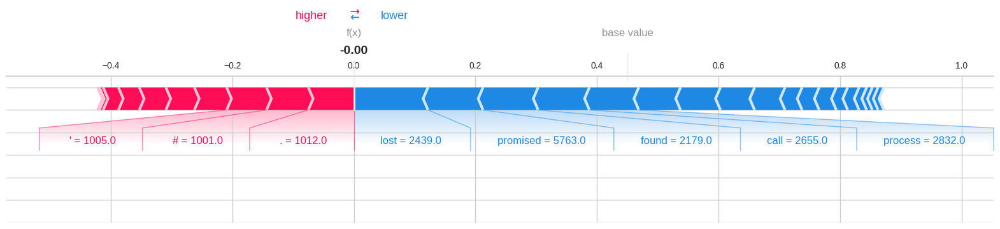

Sentence: flight window . kind ticked . pick aisle seats hate window seats . # annoyed # epic ##fa ##il ; Prediction: [0] ; True value: negative


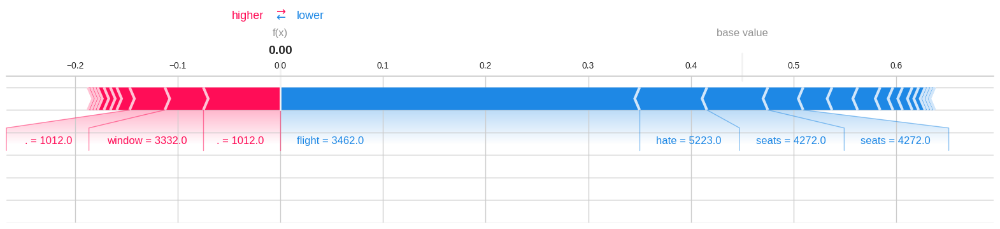

Sentence: mile ##age policy awful . , paid slightly united miles . ' s difference . ; Prediction: [0] ; True value: negative


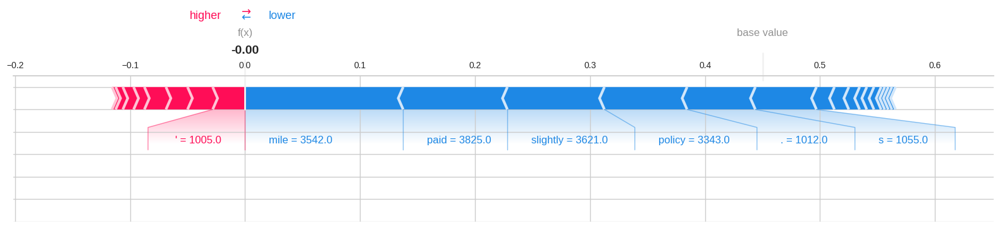

Sentence: , : ) ; Prediction: [1] ; True value: positive


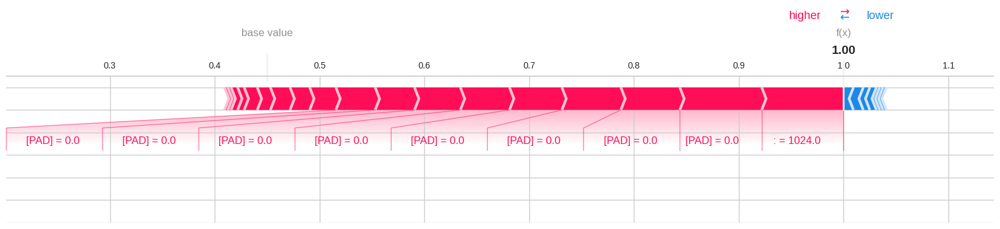

Sentence: ' ll stick flying free southwest ; works wonderful company mom ##s fly free . ; Prediction: [0] ; True value: positive


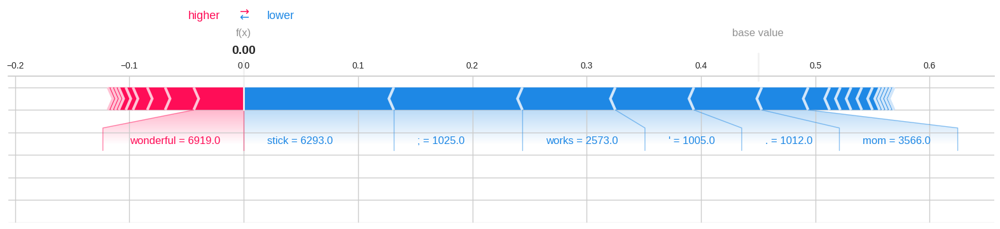

Sentence: eventually explained weather conditions extreme luggage planes . . n ' t days ! ; Prediction: [0] ; True value: negative


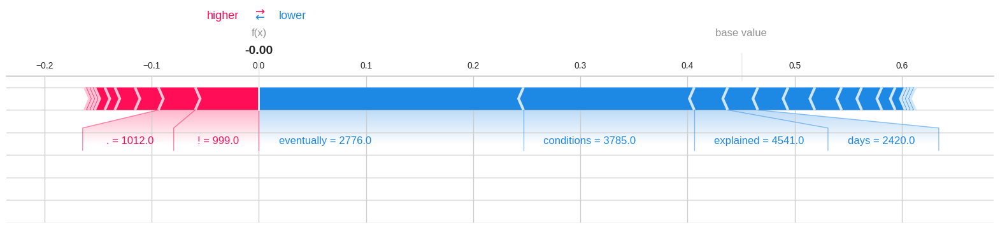

Sentence: # or ##th ##od ##oc on - call in - flight ! glad service ! ; Prediction: [1] ; True value: positive


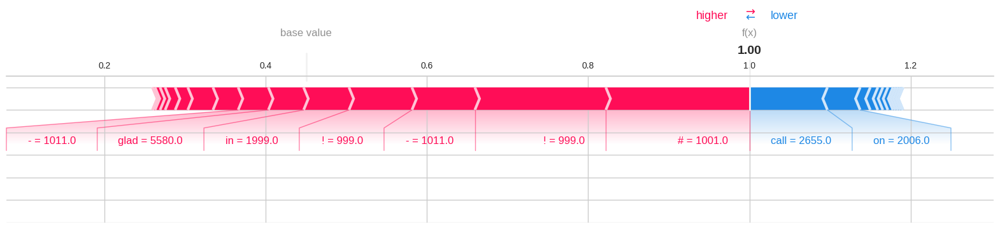

Sentence: . . cheers ; Prediction: [1] ; True value: positive


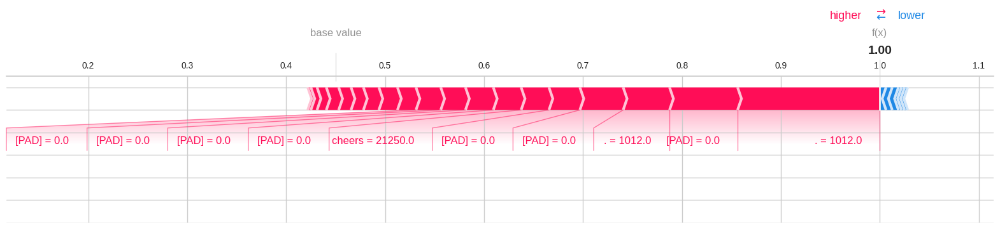

Sentence: . responding ; Prediction: [1] ; True value: positive


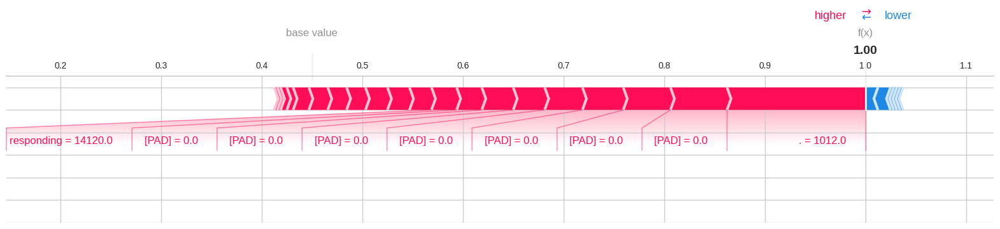

Sentence: stop . . : fleet ' s flee ##k . ; Prediction: [1] ; True value: positive


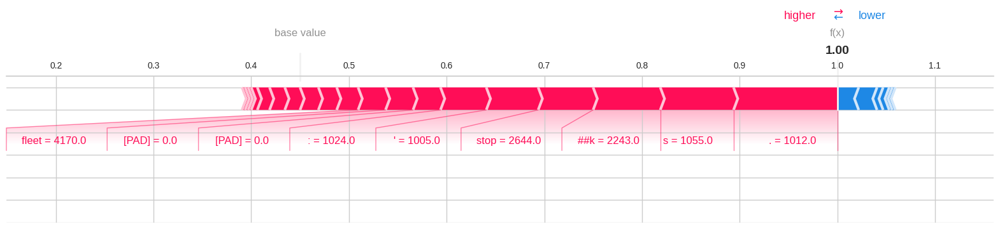

Sentence: d ##m . lack customer service ridiculous . ; Prediction: [1] ; True value: negative


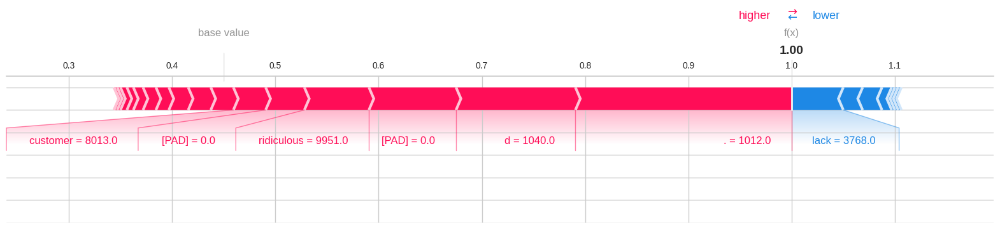

Sentence: - today staff @ ms ##p customer service level . father passed away night & amp ; helped home today ! ; Prediction: [0] ; True value: positive


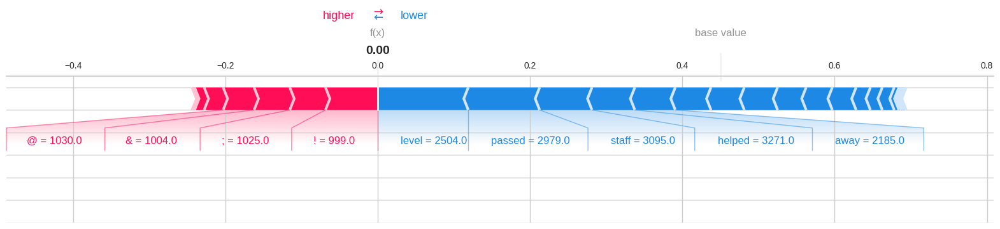

Sentence: course he ##pl ! kidding ? ' s reason ' ve hold past 5 hours ! ; Prediction: [0] ; True value: negative


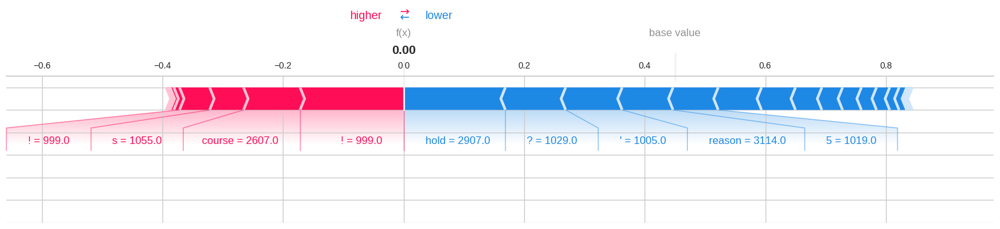

Sentence: hope lose govt contract ; Prediction: [0] ; True value: negative


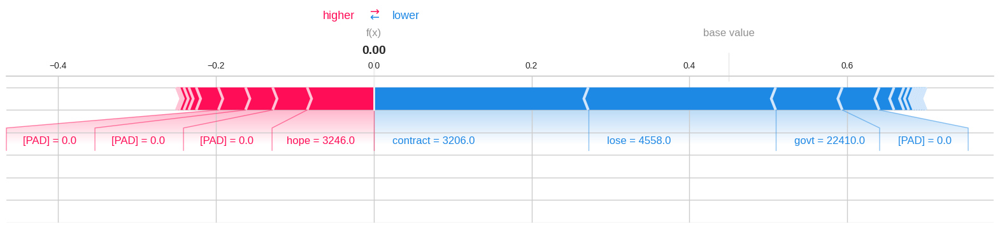

Sentence: ! nice evening . ; Prediction: [1] ; True value: positive


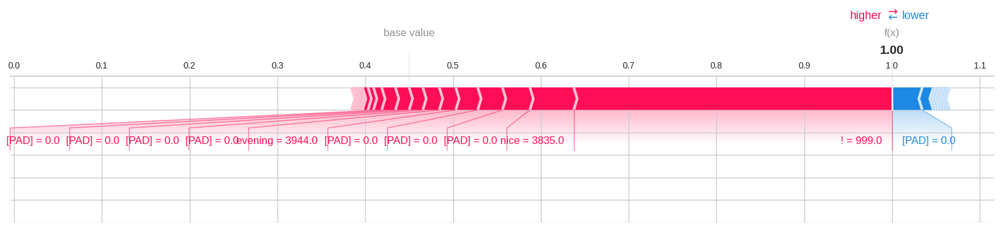

Sentence: , guys ; Prediction: [1] ; True value: positive


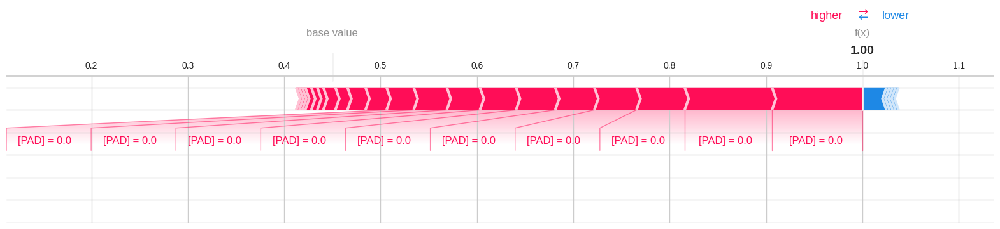

Sentence: ' s missed flight . flight held 5 minutes made . watched pull away gate ; Prediction: [0] ; True value: negative


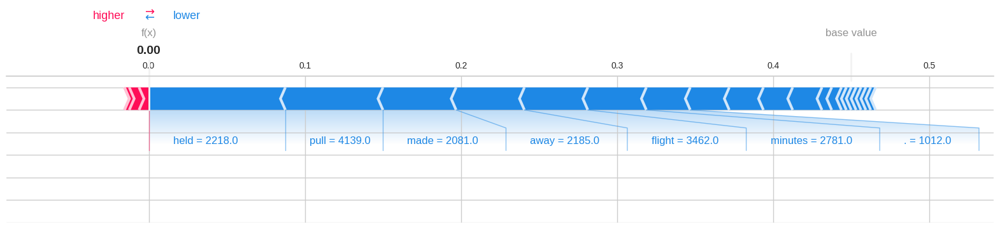

Sentence: flying nyc airline , airlines ' ve flown ' re # 1 [UNK] ; Prediction: [0] ; True value: positive


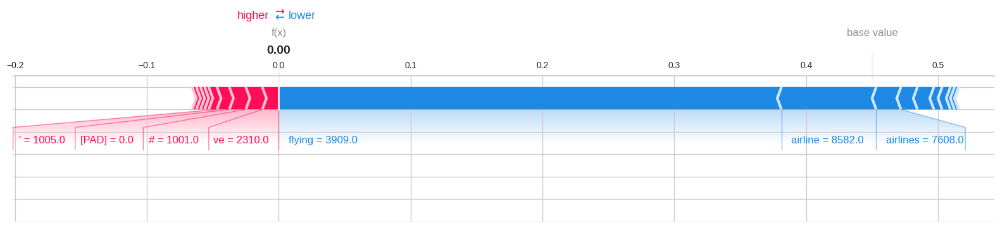

Sentence: ! ! ! # bring ##back ##the ##lu ##v ##tor ##du # miami # direct ##flight ##s ; Prediction: [1] ; True value: positive


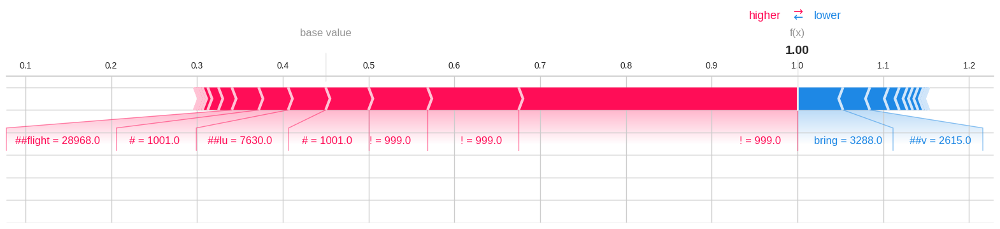

Sentence: hear things . flying weekends , flights crews awesome . . [UNK] ; Prediction: [0] ; True value: positive


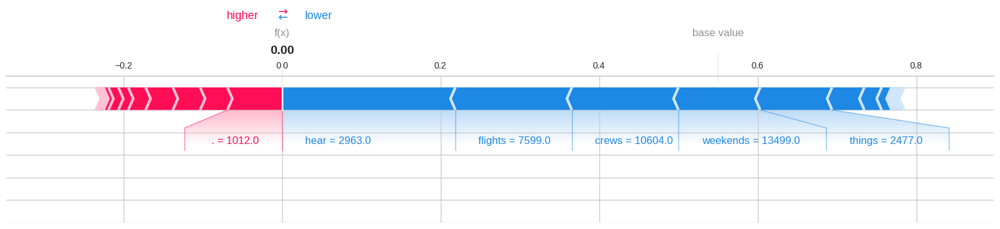

Sentence: [PAD] ; Prediction: [1] ; True value: positive


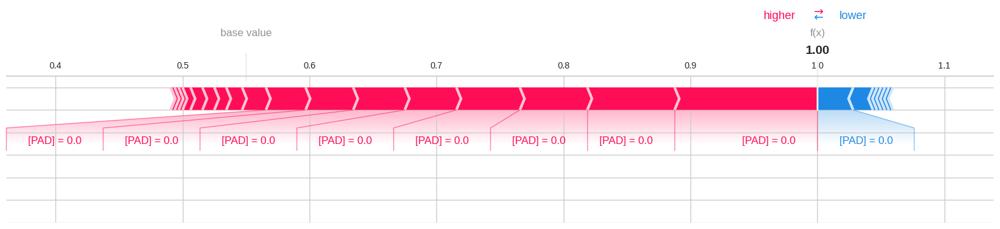

Sentence: call customer service person talked , amazing rep fixed 5 min ##s ! : ) # persistence ; Prediction: [0] ; True value: positive


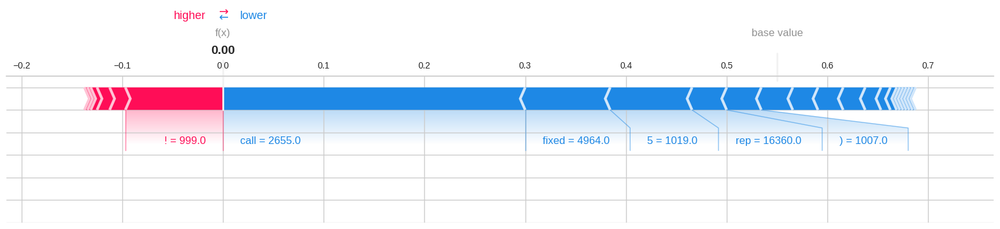

Sentence: great working . ; Prediction: [1] ; True value: positive


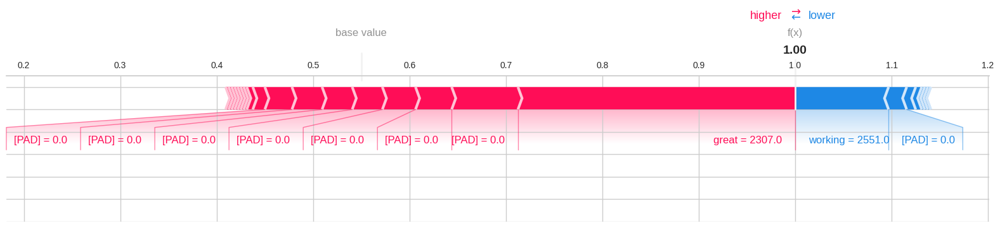

Sentence: ' m afraid . . . fly service week ' m unhappy . . spend money unhappy ; Prediction: [0] ; True value: negative


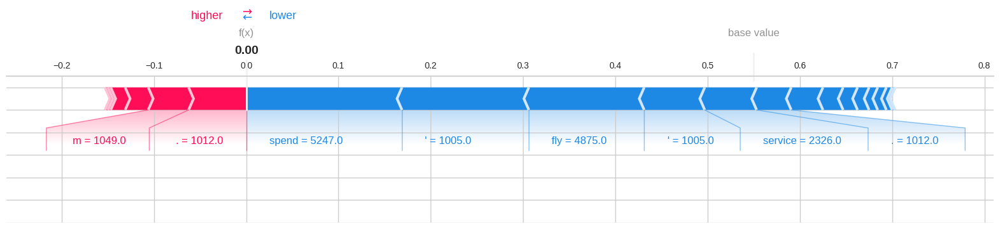

Sentence: assistance . due inc ##omp ##ete ##nce res ##ched ##ule connection . fly . ; Prediction: [0] ; True value: negative


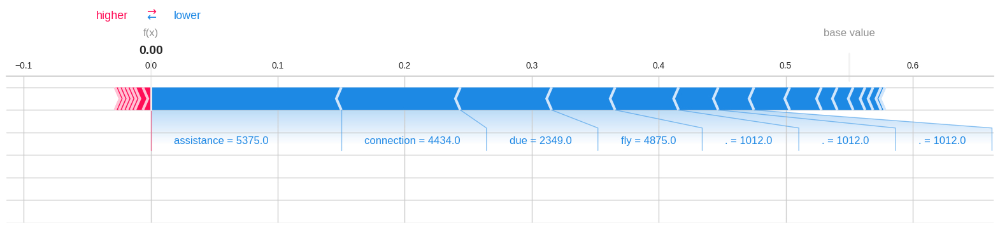

Sentence: go ##sh ? ! made day , week , year ! ! ! appreciate ! ! ! ; Prediction: [1] ; True value: positive


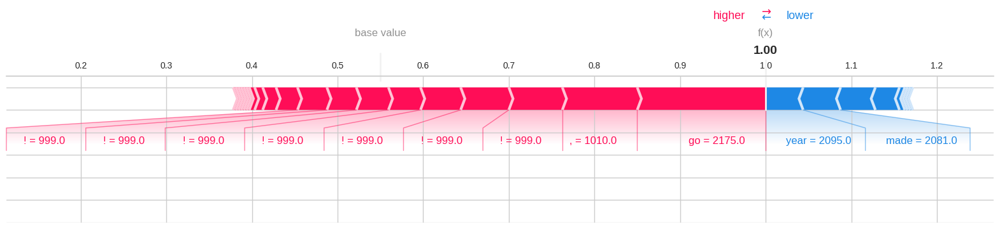

Sentence: ! ; Prediction: [1] ; True value: positive


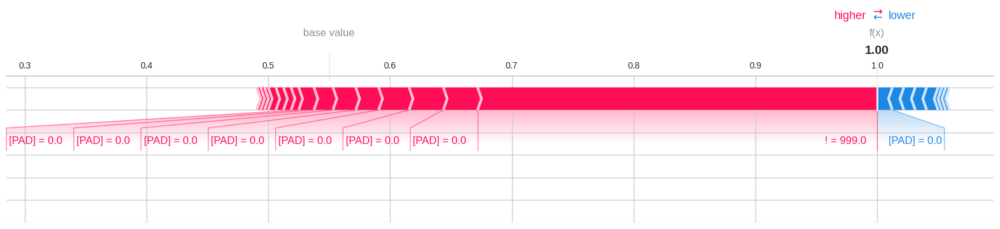

Sentence: , fucked flight . : festivities full swing united fair ##way club , overlooking 17th hole . . ; Prediction: [1] ; True value: negative


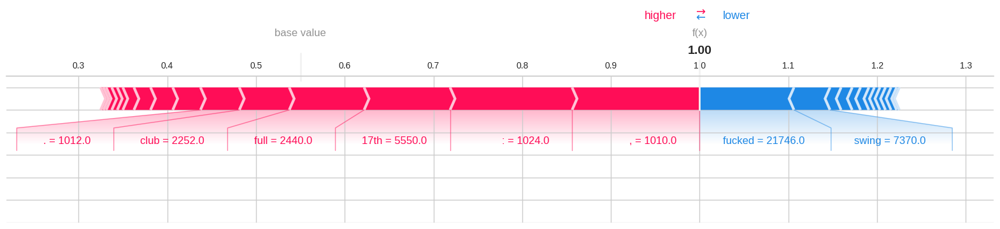

Sentence: hold hours talk cancelled flight ##ed flight tomorrow morning . suggest ? ; Prediction: [0] ; True value: negative


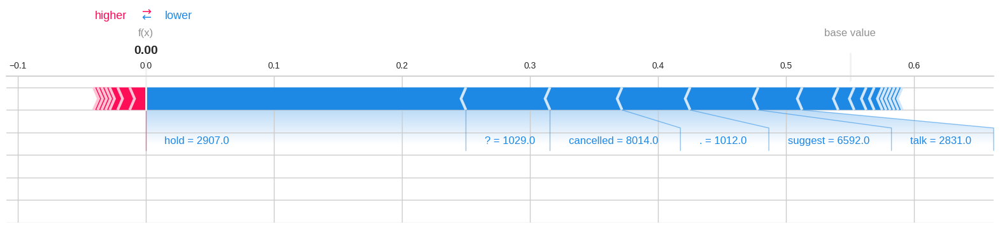

Sentence: flight l ##ga cancelled flight ##ed . ' re stuck dallas . called res ##ched ##ule , told flight today . . . ( 1 / 2 ) ; Prediction: [0] ; True value: negative


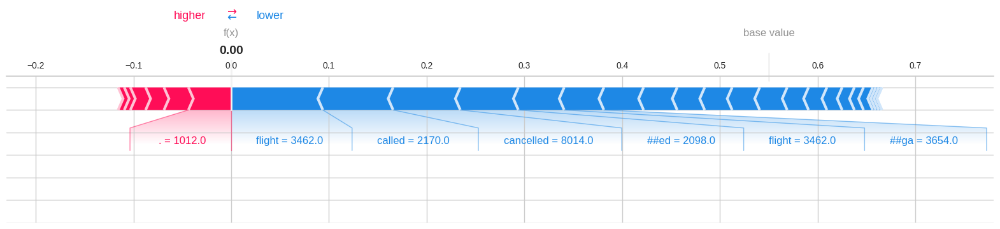

Sentence: me ##x nr ##t ( dates tb ##d ) ' m 200 300 usd difference quota ##tions september compared me ##x bk ##k ; Prediction: [0] ; True value: negative


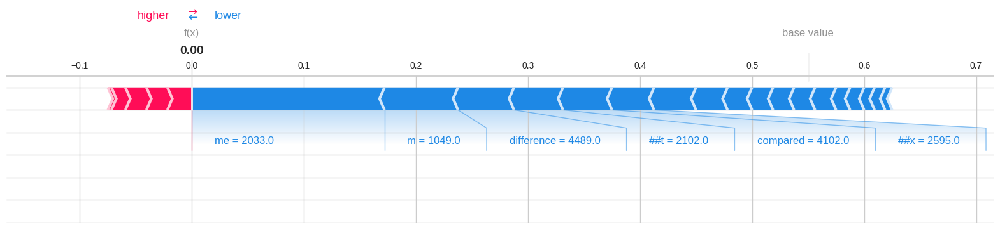

Sentence: airline world ; Prediction: [1] ; True value: positive


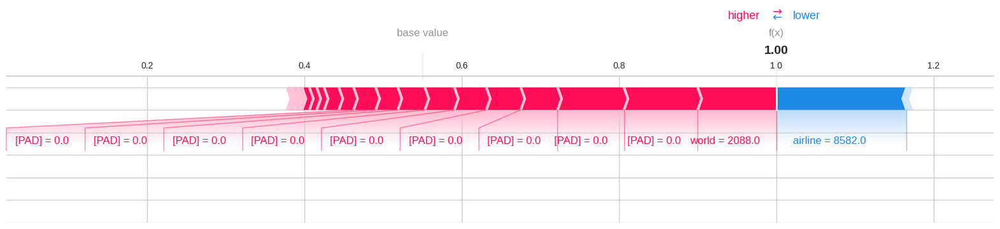

Sentence: . # fly ##fi ; Prediction: [1] ; True value: positive


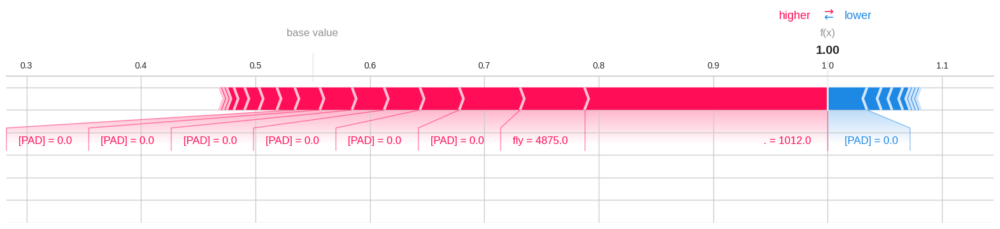

Sentence: booked flight home 7 months ago requested seats fiancee i . 2 middle seats . unacceptable . ; Prediction: [0] ; True value: negative


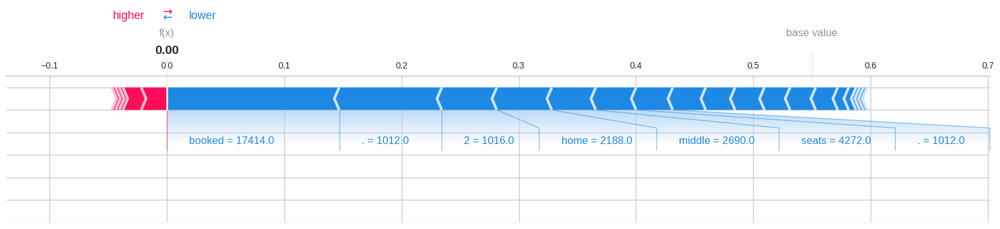

Sentence: beauty [UNK] dc - 10 united airlines [UNK] hope beauty [UNK] ; Prediction: [1] ; True value: positive


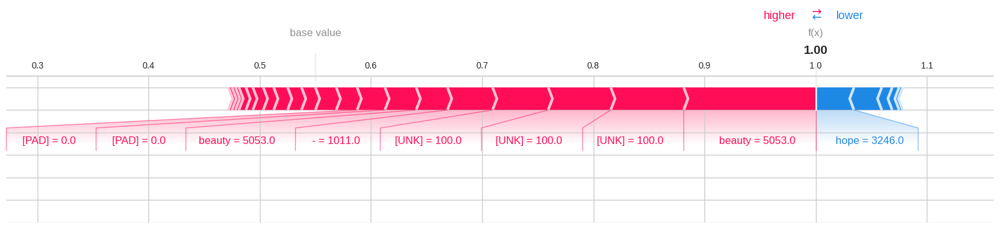

Sentence: ! : ) ; Prediction: [1] ; True value: positive


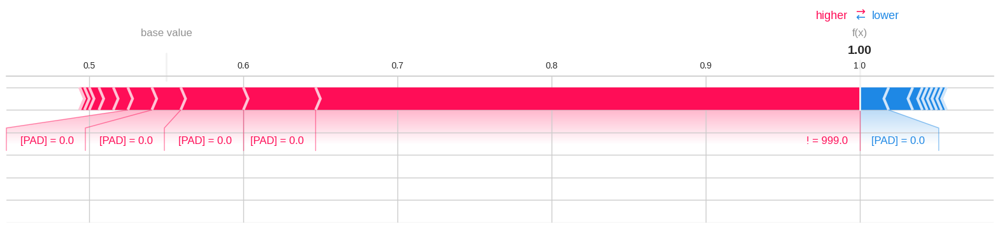

Sentence: ! ! ! follow ; ) [UNK] ; Prediction: [1] ; True value: positive


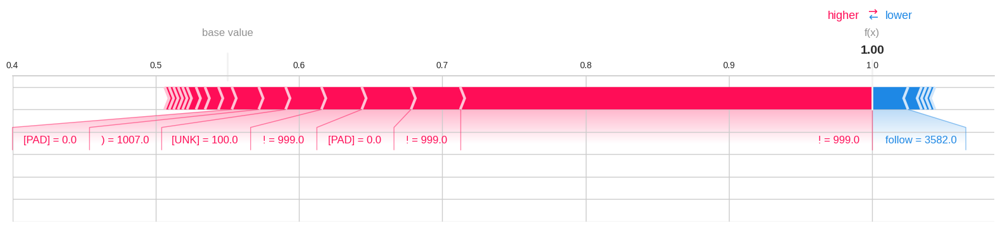

Sentence: helping ! class act , . . . air ! ; Prediction: [1] ; True value: positive


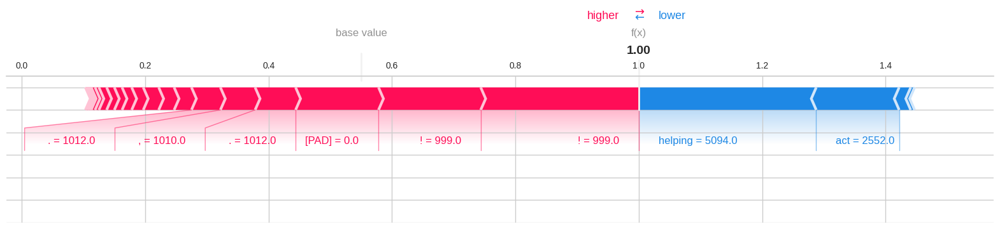

Sentence: livery ; culture 16 , 000 + crew ##me ##mber ##s em ##body daily # thanks ##dav ##e ; Prediction: [0] ; True value: positive


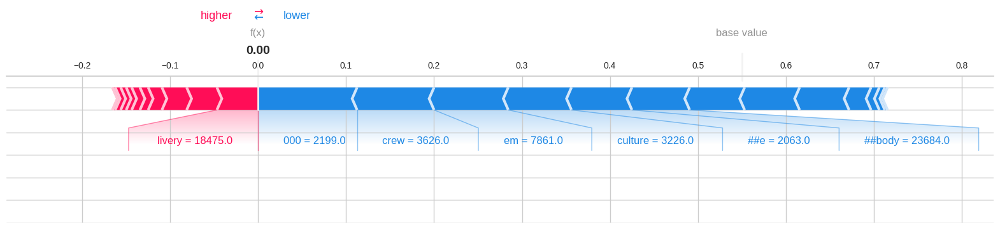

Sentence: flight 43 ##3 lets clown ##s giving 1st class $ 500 ; Prediction: [0] ; True value: negative


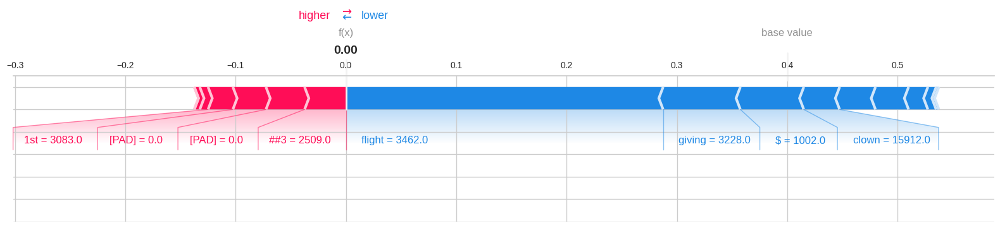

Sentence: 2 hr delay vacation buzz ##kill ; Prediction: [1] ; True value: negative


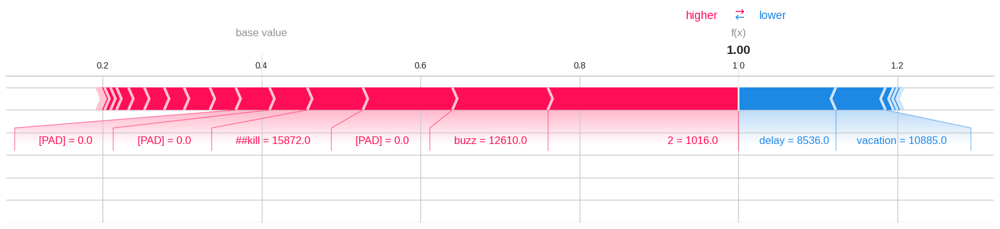

Sentence: : means complaints today ( week , month ) n ' t respond b / c ' s ; Prediction: [0] ; True value: negative


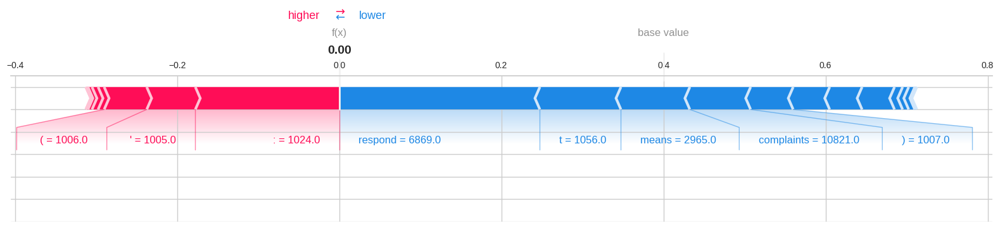

Sentence: talking . nonstop flights . s ##na sf ##o sf ##o e ##wr . ; Prediction: [1] ; True value: negative


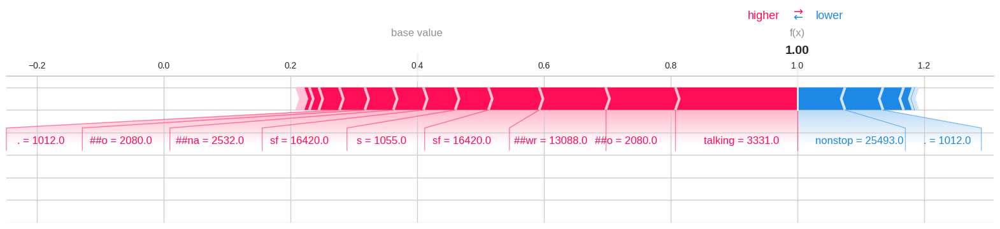

Sentence: weekend dealing company . ; Prediction: [1] ; True value: negative


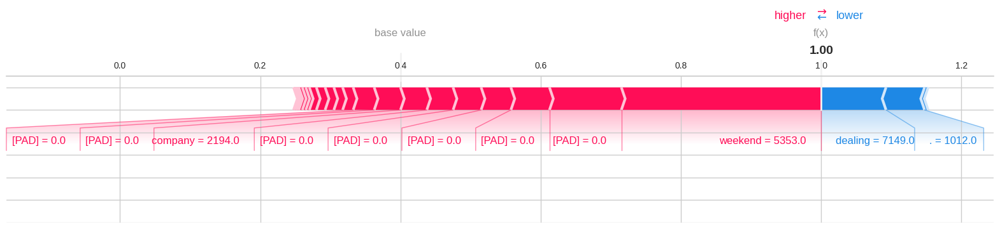

Sentence: flying united ! worst experience ; Prediction: [0] ; True value: negative


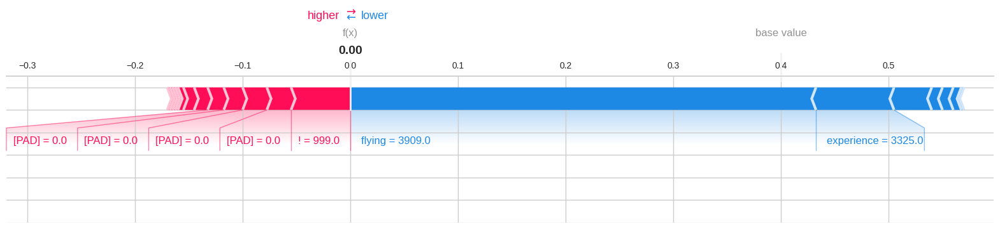

Sentence: flight landed 13 hours ago , 2 flights cm ##h - ia ##d night bag . . driven cm ##h ; Prediction: [0] ; True value: negative


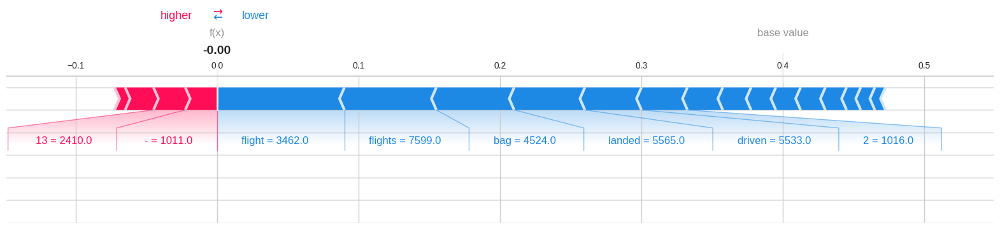

Sentence: played , ^ lo . ; Prediction: [1] ; True value: positive


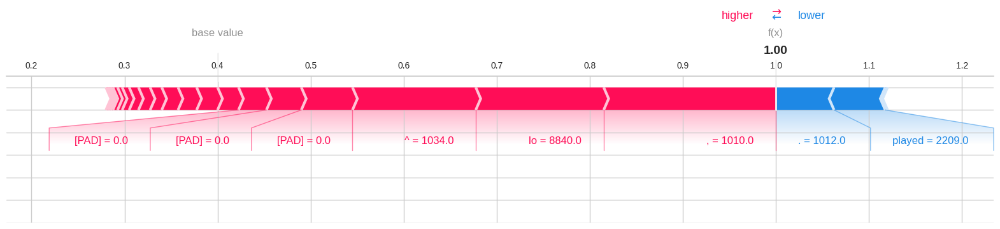

Sentence: wheelchair ##s ; Prediction: [0] ; True value: negative


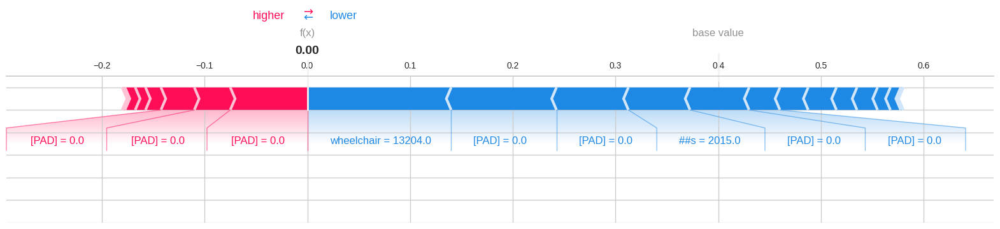

Sentence: access # destination ##dra ##gon ##s tonight [UNK] crying / dying rn # rip ##me ; Prediction: [1] ; True value: positive


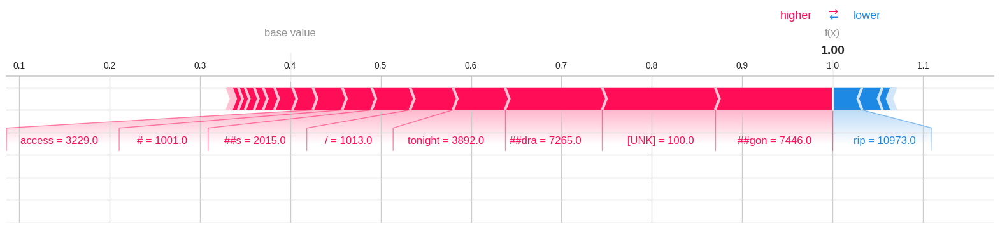

Sentence: ready ; Prediction: [1] ; True value: positive


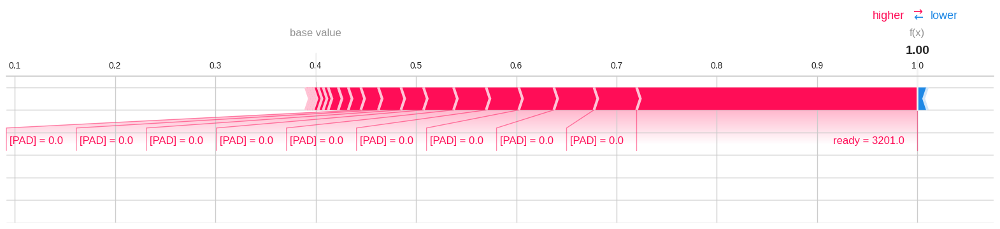

Sentence: engineer designed 78 ##7 frame extend half foot plane seat 27 ##a forced ; Prediction: [0] ; True value: negative


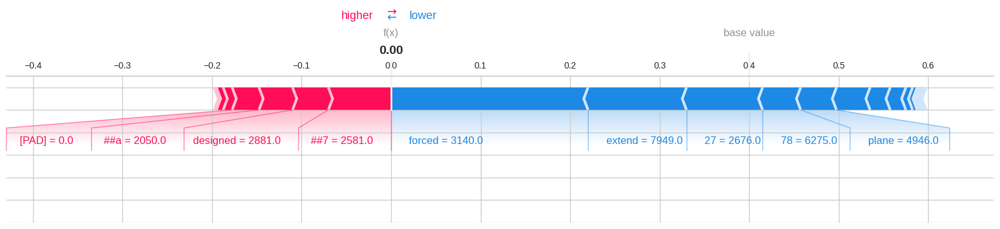

Sentence: wanted compliment ur phone agent jean ##ette ref ##light booking problems rd ##u sf ##o connecting flight e ##wr cancelled flight ##led . ; Prediction: [0] ; True value: positive


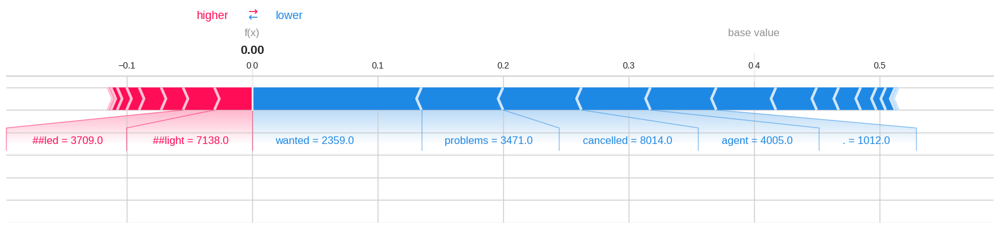

Sentence: landed lax , hour . late flight bag check business travel friendly # no ##more ##vir ##gin ; Prediction: [0] ; True value: negative


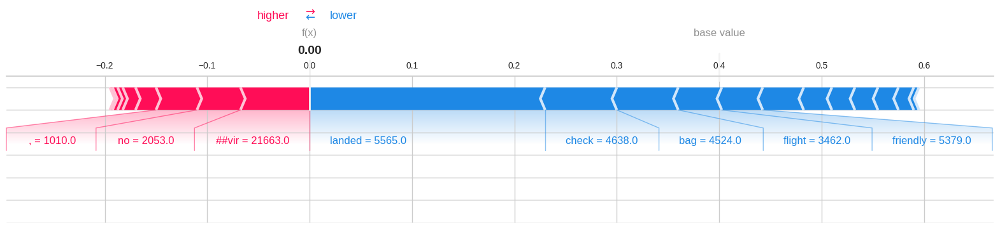

Sentence: un ##hel ##pf ##ul team ? . ' m bangkok , bag chicago . pay accommodation bag arrives ? ? ; Prediction: [0] ; True value: negative


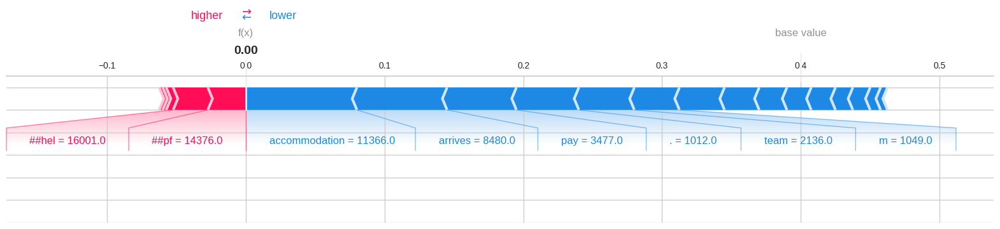

Sentence: provide update ua 79 ##1 . flight stranded united information crew plane . ; Prediction: [0] ; True value: negative


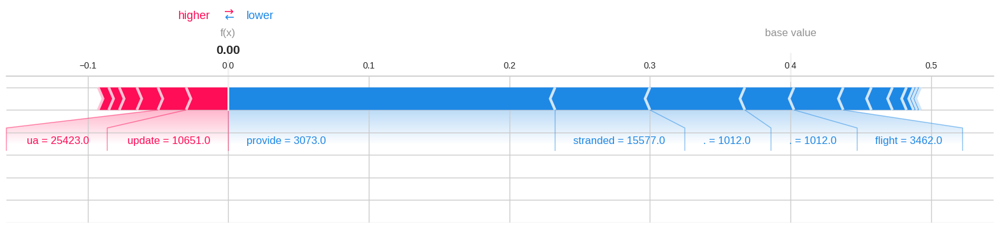

Sentence: making flight lax j ##fk nightmare forcing check carry bag gate . ( 1 ) ; Prediction: [0] ; True value: negative


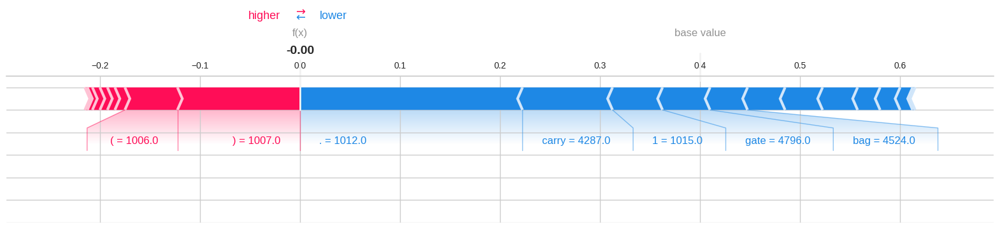

Sentence: hit status year , ’ flown times year book ’ time ! ; Prediction: [1] ; True value: positive


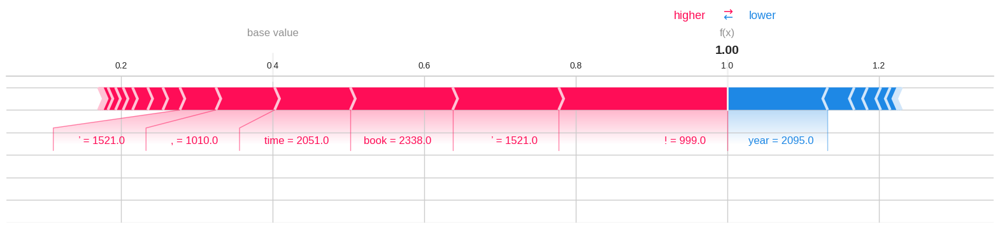

Sentence: ! ' s he ##ctic actions n ' t represent company ; Prediction: [1] ; True value: positive


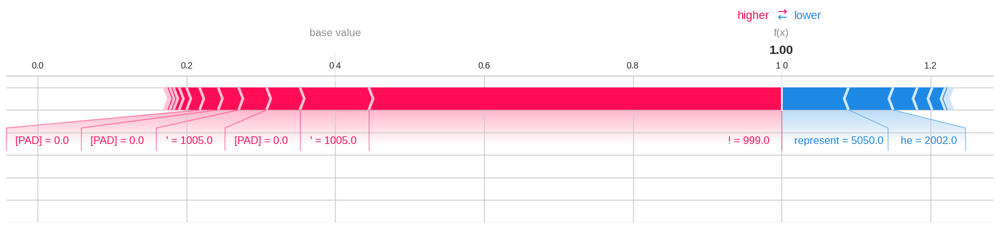

Sentence: 60 ##3 & amp ; 270 ##5 d ##f ##w ps ##p ! ; Prediction: [0] ; True value: positive


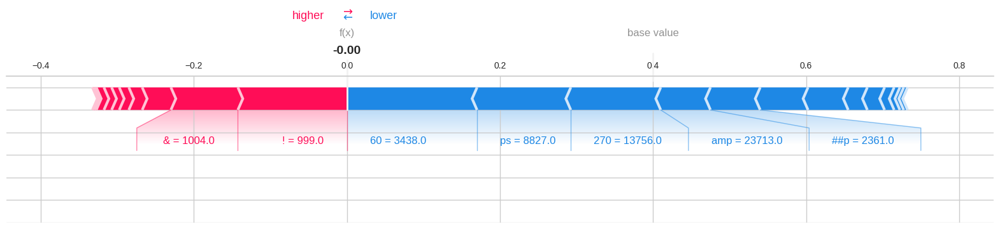

Sentence: hey flight ia ##h po ##s leave late flight , back ia ##h early ? po ##s earlier ; Prediction: [1] ; True value: negative


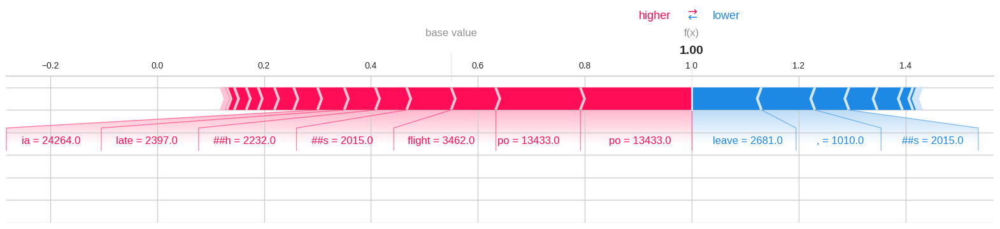

Sentence: awesome flights . sweetheart screwed , managed scramble sw plane today . ! ! ! ; Prediction: [1] ; True value: positive


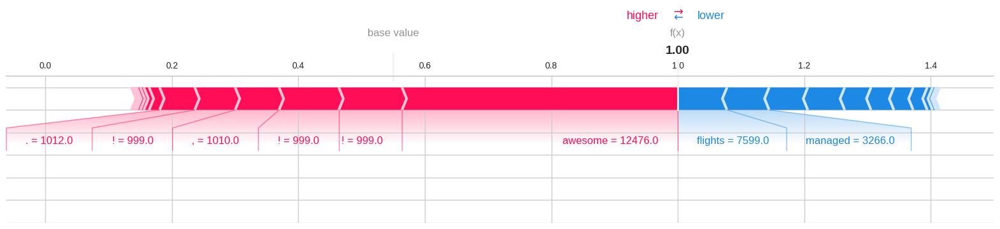

Sentence: ! confirmation number d ##med . appreciate ! ; Prediction: [1] ; True value: positive


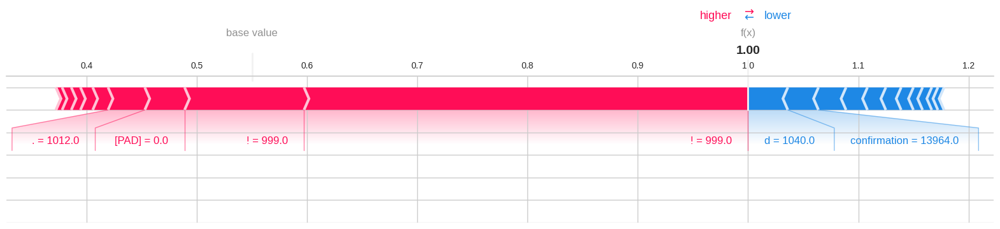

Sentence: . ; Prediction: [1] ; True value: negative


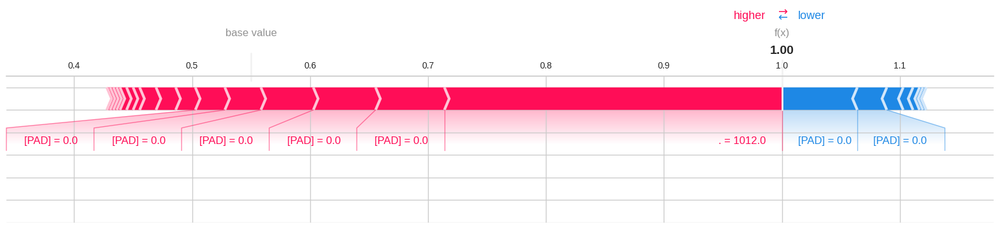

Sentence: link , finally arrived brussels , 9 schedule . . . ; Prediction: [0] ; True value: negative


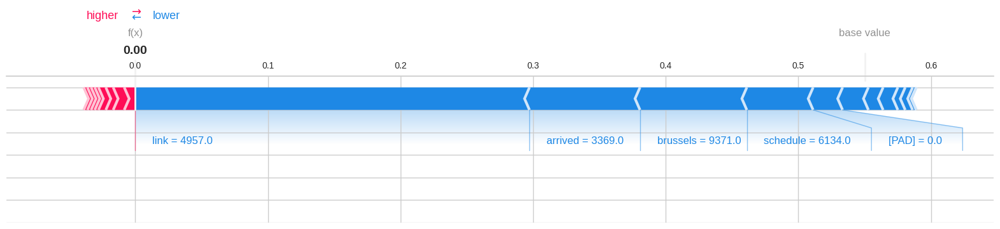

Sentence: bump group 3 n ' t forced check bag wait 30 + minutes l ##ga . ; Prediction: [0] ; True value: negative


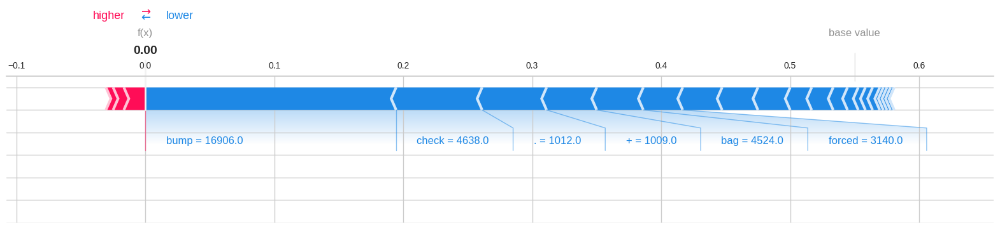

Sentence: beautiful ride . : ) ; Prediction: [1] ; True value: positive


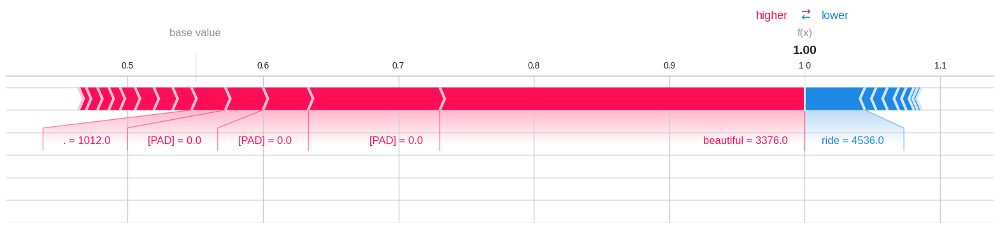

Sentence: lost bag . flying united # joke ; Prediction: [0] ; True value: negative


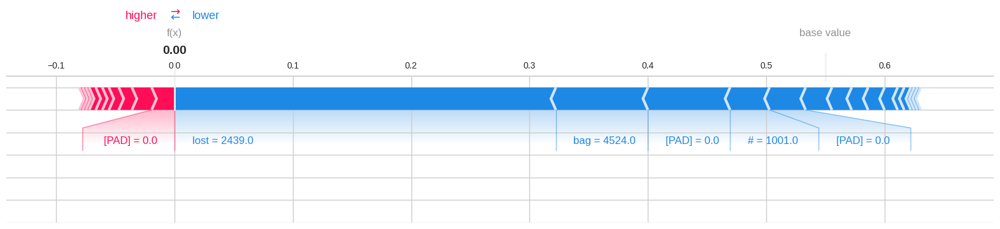

Sentence: flights today , ' s hope kit treatment ! ! ; Prediction: [1] ; True value: negative


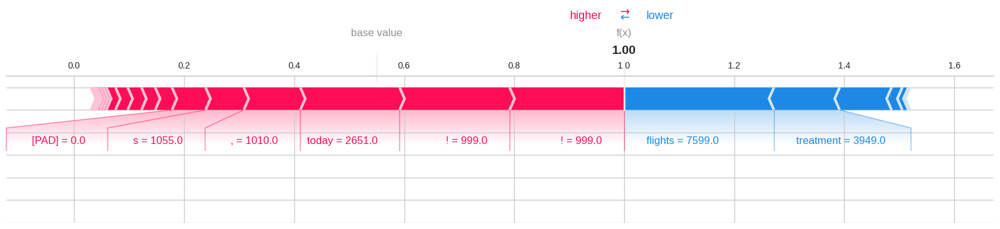

Sentence: 4 flights 48 ##hr ##s & amp ; ' ve flight attendant 3 flights . freak ##y coincidence ! side ' s great . : ) ; Prediction: [0] ; True value: positive


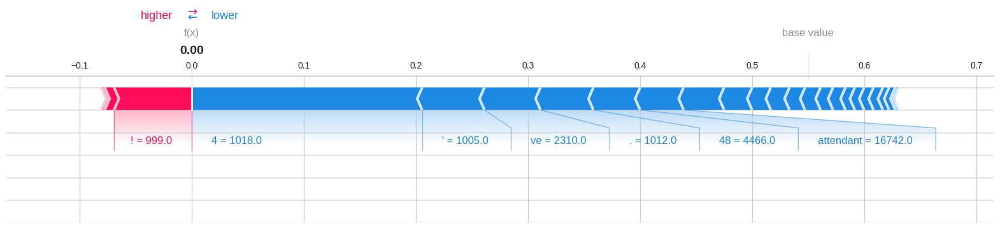

Sentence: awesome ' ll book christmas va ##cat ##inn december ways dev ##al ##ue mile ##age . ; Prediction: [1] ; True value: positive


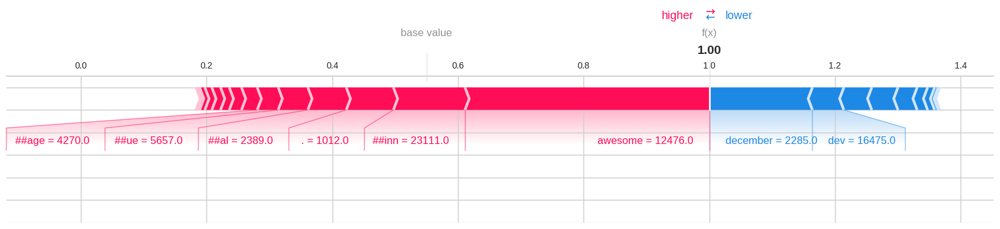

Sentence: chance re ##book ? ? flight cancelled flight ##led ; Prediction: [0] ; True value: negative


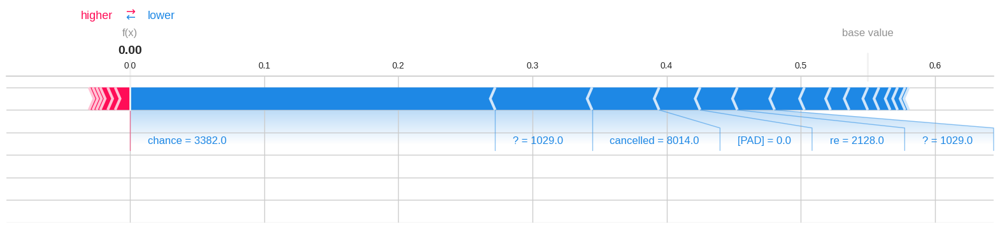

Sentence: ' re welcome [UNK] ; Prediction: [1] ; True value: positive


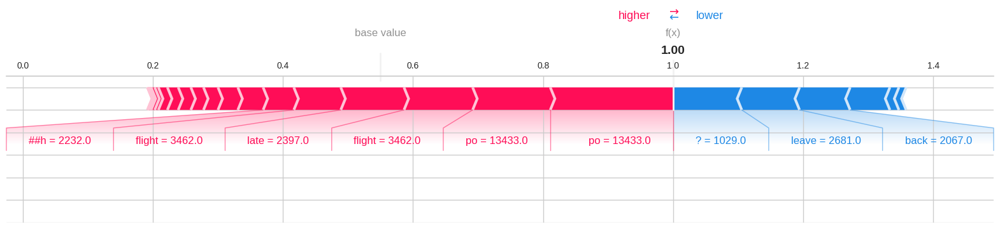

Sentence: “ : form photo burst luggage . correct ? ^ j ##h ” blame customer ; Prediction: [1] ; True value: negative


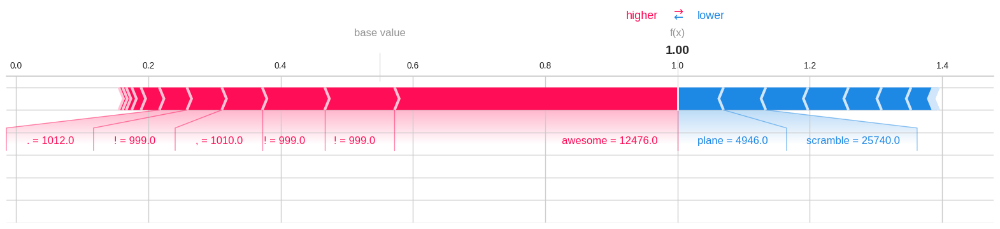

Sentence: delayed san pedro , belize . scheduled fly 3 ##pm belize city houston . wait ? ; Prediction: [0] ; True value: negative


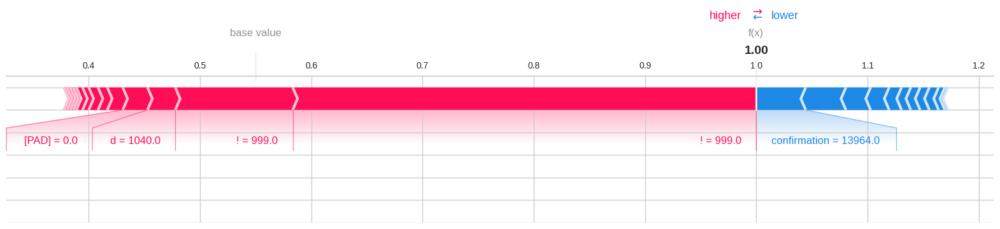

Sentence: line full worried customers guy desk sorry problems late flight ##r n ' t time . ; Prediction: [0] ; True value: negative


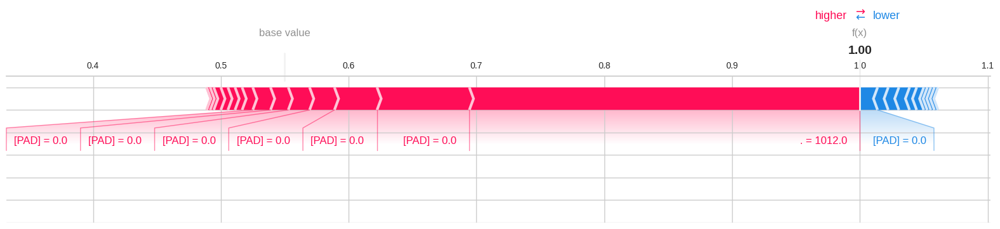

Sentence: job phil ##ly employee running check , today . ( tabitha ? ) helped emergency & amp ; vacation saved ! ! ! ; Prediction: [0] ; True value: positive


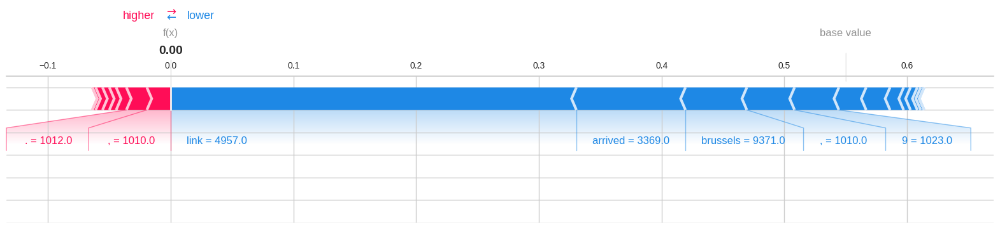

Sentence: changed mile ##age ##pl ##us acc ##t site hour . _ usa hold 20 ##mins , 5 days & amp ; change ; Prediction: [0] ; True value: negative


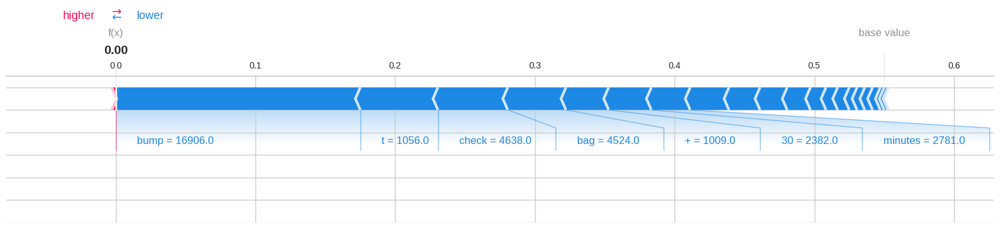

Sentence: dealing frustrated pass ##ene ##gers . hope great day : ) amazing airline : ) ; Prediction: [1] ; True value: positive


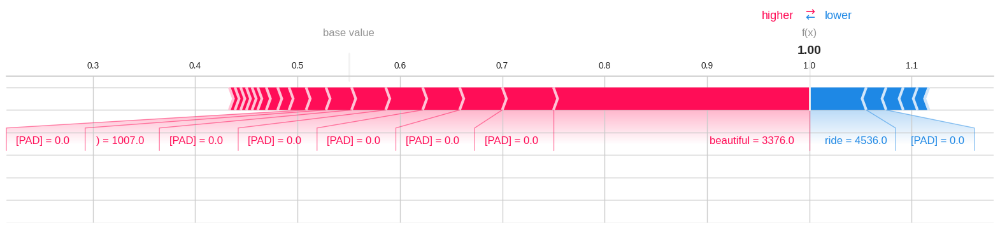

Sentence: ! ; Prediction: [1] ; True value: positive


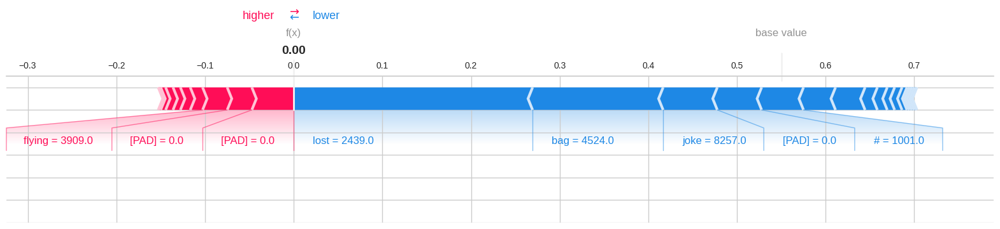

In [9]:
for i in range(len(to_explain)):
  print("Sentence:", " ".join(tokenizer.convert_ids_to_tokens(to_explain[i])).replace(" [PAD]", "") ,"; Prediction:", prediction_model(np.array([to_explain[i]])), "; True value:", y_test[i])
  shap.plots.force(perm_vals["base_values"][i], perm_vals["values"][i], perm_vals["data"][i], feature_names=tokenizer.convert_ids_to_tokens(perm_vals["data"][i]), matplotlib=True)

In [10]:
heatmaps = np.array(copy.copy(perm_vals["values"]))
heatmaps += perm_vals["base_values"][0]/64
for i in range(len(heatmaps)):
  print(np.sum(heatmaps[i]))

-4.163336342344337e-17
-4.163336342344337e-17
-1.6653345369377348e-16
5.551115123125783e-17
5.551115123125783e-17
2.220446049250313e-16
1.0
-1.1102230246251565e-16
1.0
1.0
-4.163336342344337e-17
1.1102230246251565e-16
1.0
0.0
-2.7755575615628914e-17
1.0408340855860843e-16
6.245004513516506e-17
1.0
1.0
1.6653345369377348e-16
-0.14999999999999994
-0.15000000000000002
-0.14999999999999997
-0.15000000000000005
0.8499999999999999
-0.14999999999999997
-0.15
0.8500000000000001
0.8500000000000001
0.8499999999999999
0.85
0.8500000000000001
-0.15000000000000002
-0.14999999999999997
-0.14999999999999994
0.8500000000000001
0.85
-0.15000000000000008
-0.14999999999999986
0.8499999999999999
-0.2500000000000001
0.7499999999999999
-0.25
0.75
-0.25
-0.25
0.7500000000000001
0.7499999999999999
0.7500000000000002
-0.25
-0.25000000000000017
-0.2500000000000001
0.75
0.7499999999999999
-0.25000000000000006
0.75
0.75
0.75
0.7500000000000002
-0.2500000000000001
-0.10000000000000006
0.8999999999999999
-0.0999999

In [11]:
def explanation_converter(explanations):
  new_explanations = []
  for i in range(len(explanations)):
    if (np.sum(explanations[i]) > 0):
      new_explanations.append(explanations[i] + (1 - np.sum(explanations[i]))/64)
    else:
      new_explanations.append(-explanations[i] + (1 + np.sum(explanations[i]))/64)
  return new_explanations
standardized_explanations = explanation_converter(perm_vals["values"])

In [12]:
for x in standardized_explanations:
  print(np.sum(x))
print(standardized_explanations)

1.0
1.0
0.9999999999999998
1.0
0.9999999999999999
0.9999999999999998
1.0
0.9999999999999999
1.0
1.0
1.0
0.9999999999999998
1.0
1.0
0.9999999999999999
1.0
0.9999999999999999
1.0
1.0000000000000002
0.9999999999999998
1.0
1.0000000000000002
1.0
1.0
1.0
1.0
1.0000000000000002
1.0
1.0
1.0
1.0
0.9999999999999999
1.0
1.0000000000000002
1.0000000000000002
0.9999999999999999
0.9999999999999999
1.0
1.0
0.9999999999999999
0.9999999999999998
1.0
1.0
1.0
1.0
1.0
1.0
0.9999999999999999
1.0000000000000002
0.9999999999999999
0.9999999999999999
0.9999999999999999
1.0
1.0
1.0
1.0
1.0
1.0
1.0000000000000002
1.0
1.0000000000000002
1.0
0.9999999999999998
1.0
1.0
1.0
0.9999999999999998
1.0
0.9999999999999999
1.0
0.9999999999999999
0.9999999999999999
0.9999999999999999
1.0
0.9999999999999999
1.0
0.9999999999999999
1.0
0.9999999999999998
0.9999999999999999
1.0
1.0
0.9999999999999998
0.9999999999999999
1.0
1.0
1.0
1.0
1.0
1.0
0.9999999999999999
1.0
1.0000000000000002
1.0
0.9999999999999999
1.0
0.99999999999999

In [14]:
sentences = []
sentence_explanations = []
sentence_heatmap = []
for i in range(len(to_explain)):
    sentence = []
    exp = []
    hm = []
    j = 0
    while j < len(to_explain[i]):
        if (tokenizer.convert_ids_to_tokens([to_explain[i][j]])[0].startswith("##")):
            sentence[-1] += tokenizer.convert_ids_to_tokens([to_explain[i][j]])[0][2:]
            exp[-1] += standardized_explanations[i][j]
            hm[-1] += heatmaps[i][j]
        else:
            sentence.append(tokenizer.convert_ids_to_tokens([to_explain[i][j]])[0])
            exp.append(standardized_explanations[i][j])
            hm.append(heatmaps[i][j])
        j += 1
    sentences.append(sentence)
    sentence_explanations.append(exp)
    sentence_heatmap.append(hm)

Prediction: Negative


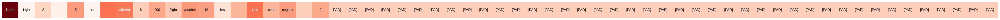

Prediction: Negative


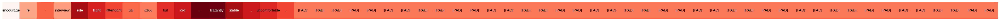

Prediction: Negative


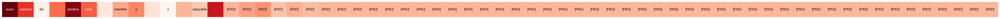

Prediction: Negative


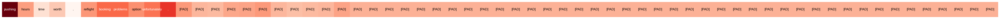

Prediction: Negative


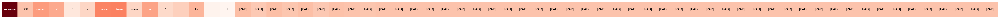

Prediction: Negative


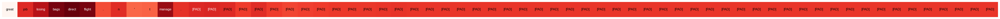

Prediction: Positive


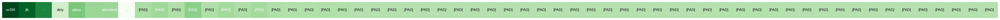

Prediction: Negative


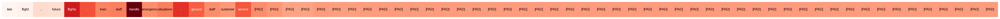

Prediction: Positive


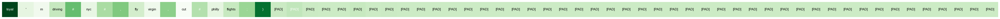

Prediction: Positive


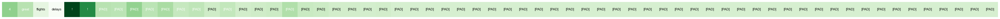

Prediction: Negative


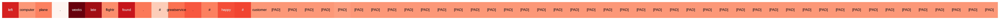

Prediction: Negative


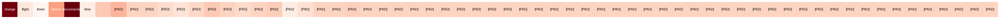

Prediction: Positive


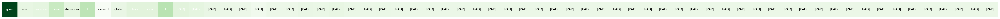

Prediction: Negative


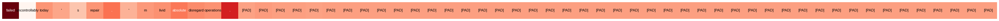

Prediction: Negative


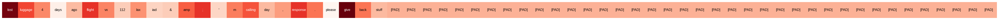

Prediction: Negative


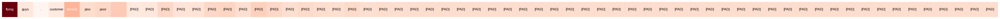

Prediction: Negative


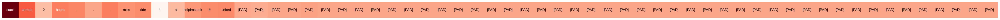

Prediction: Positive


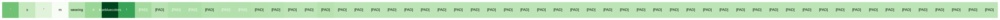

Prediction: Positive


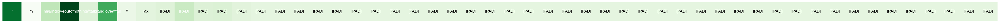

Prediction: Negative


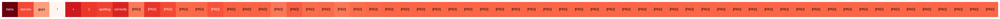

Prediction: Negative


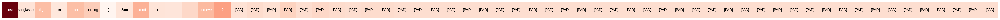

Prediction: Negative


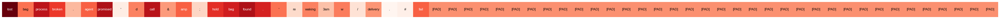

Prediction: Negative


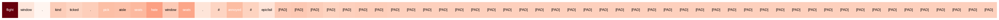

Prediction: Negative


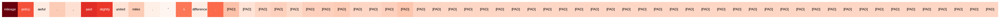

Prediction: Positive


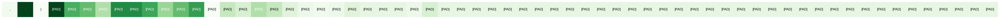

Prediction: Negative


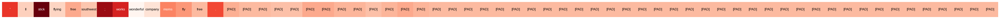

Prediction: Negative


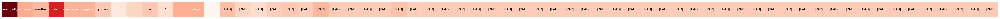

Prediction: Positive


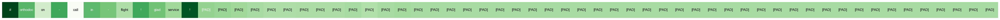

Prediction: Positive


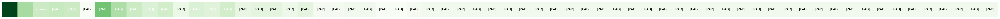

Prediction: Positive


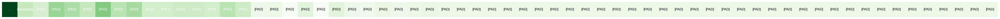

Prediction: Positive


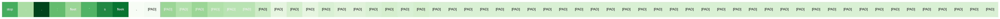

Prediction: Positive


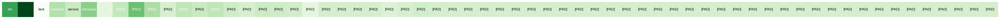

Prediction: Negative


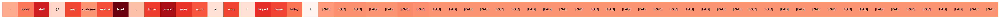

Prediction: Negative


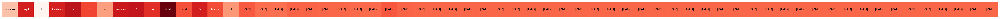

Prediction: Negative


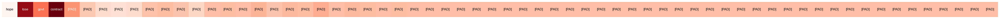

Prediction: Positive


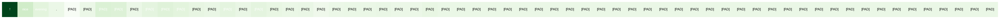

Prediction: Positive


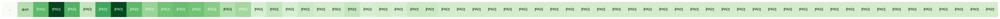

Prediction: Negative


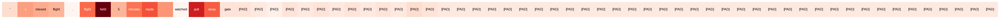

Prediction: Negative


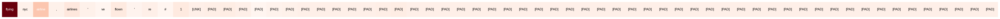

Prediction: Positive


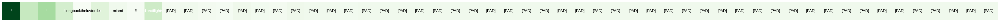

Prediction: Negative


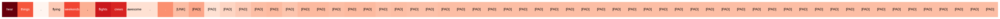

Prediction: Positive


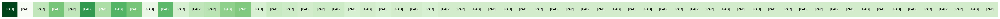

Prediction: Negative


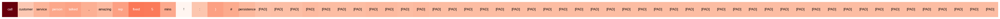

Prediction: Positive


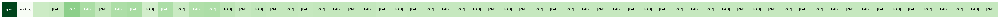

Prediction: Negative


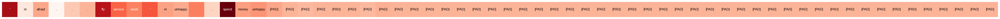

Prediction: Negative


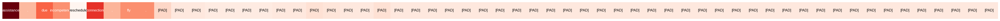

Prediction: Positive


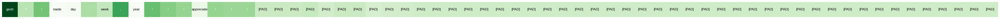

Prediction: Positive


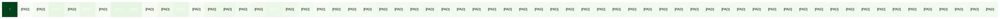

Prediction: Positive


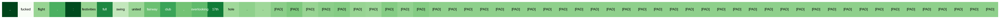

Prediction: Negative


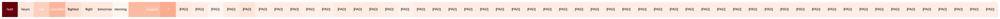

Prediction: Negative


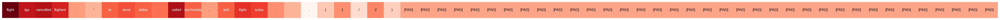

Prediction: Negative


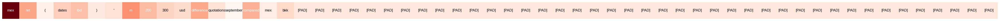

Prediction: Positive


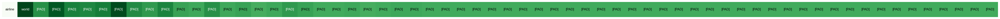

Prediction: Positive


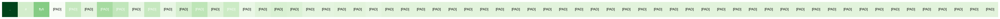

Prediction: Negative


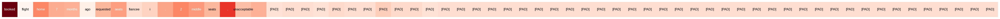

Prediction: Positive


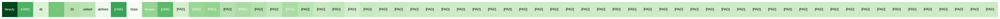

Prediction: Positive


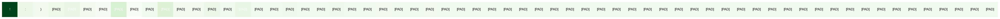

Prediction: Positive


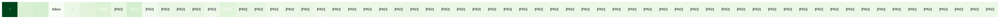

Prediction: Positive


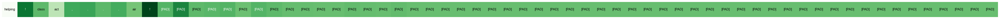

Prediction: Negative


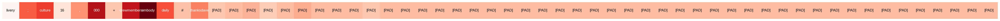

Prediction: Negative


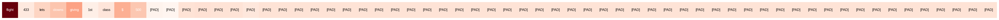

Prediction: Positive


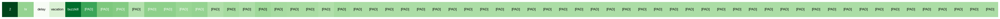

Prediction: Negative


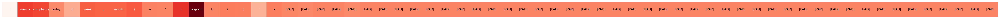

Prediction: Positive


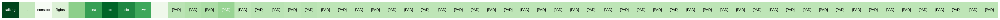

Prediction: Positive


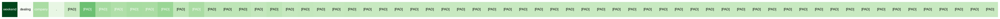

Prediction: Negative


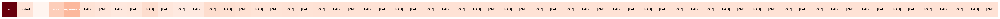

Prediction: Negative


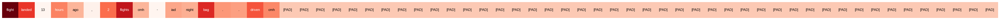

Prediction: Positive


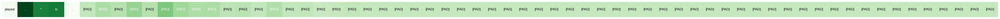

Prediction: Negative


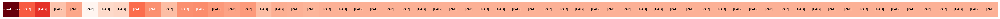

Prediction: Positive


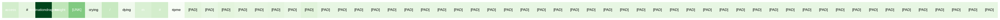

Prediction: Positive


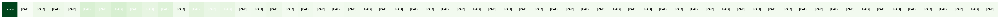

Prediction: Negative


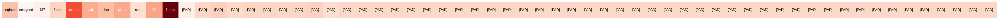

Prediction: Negative


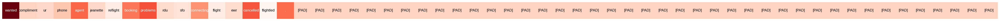

Prediction: Negative


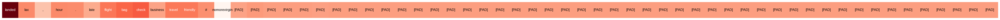

Prediction: Negative


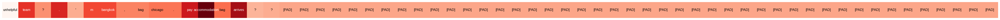

Prediction: Negative


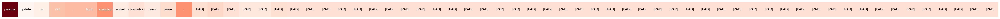

Prediction: Negative


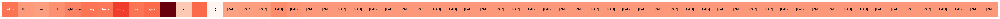

Prediction: Positive


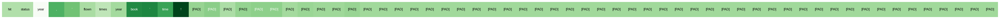

Prediction: Positive


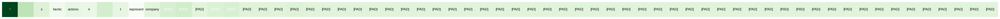

Prediction: Negative


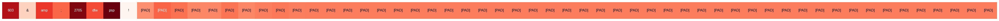

Prediction: Positive


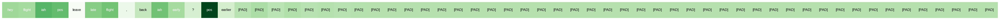

Prediction: Positive


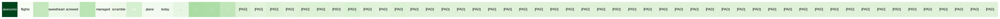

Prediction: Positive


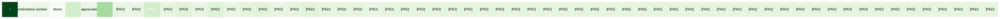

Prediction: Positive


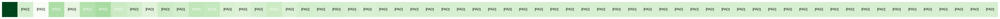

Prediction: Negative


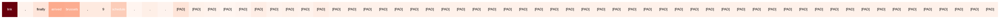

Prediction: Negative


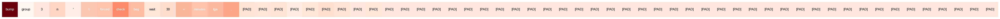

Prediction: Positive


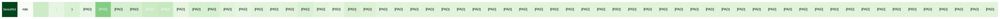

Prediction: Negative


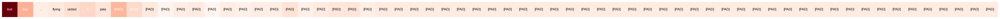

Prediction: Positive


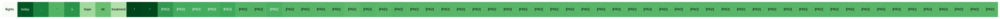

Prediction: Negative


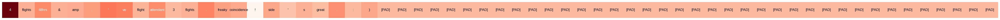

Prediction: Positive


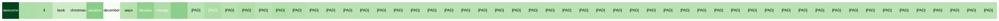

Prediction: Negative


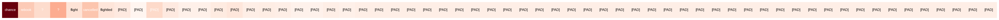

Prediction: Positive


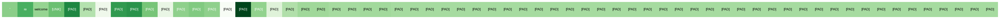

Prediction: Positive


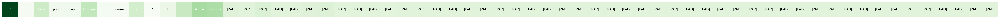

Prediction: Negative


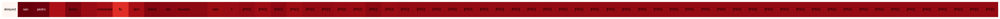

Prediction: Negative


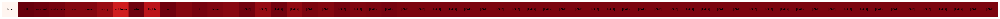

Prediction: Negative


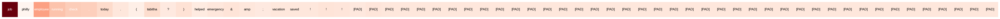

Prediction: Negative


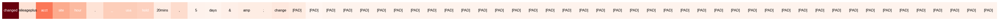

Prediction: Positive


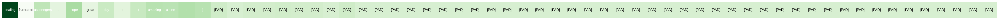

Prediction: Positive


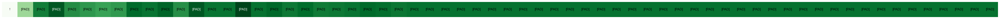

In [15]:
for x in range(len(sentences)):
  fig, ax = plt.subplots(figsize=(len(sentences[x]), 1))
  if prediction_model(np.array([to_explain[x]]))[0] == 0:
    print("Prediction: Negative")
    ax.imshow([-np.array(sentence_heatmap[x])], cmap="Reds", aspect="auto")
    ax.axis("off")
    for i, word in enumerate(sentences[x]):
      color = plt.cm.Blues(sentence_heatmap[x][i])
      ax.text(i, 0, word, ha="center", va="center", fontsize="12", color="white" if sentence_heatmap[x][i] < -0.02 else "black")#color="white" if heatmaps[x][i] > 0.5 else "black", bbox=dict(facecolor=color, edgecolor=color, pad=1))
  else:
    print("Prediction: Positive")
    ax.imshow([sentence_heatmap[x]], cmap="Greens", aspect="auto")
    ax.axis("off")
    for i, word in enumerate(sentences[x]):
      color = plt.cm.Blues(sentence_heatmap[x][i])
      ax.text(i, 0, word, ha="center", va="center", fontsize="12", color="white" if sentence_heatmap[x][i] > 0.02 else "black")#color="white" if heatmaps[x][i] > 0.5 else "black", bbox=dict(facecolor=color, edgecolor=color, pad=1))


  plt.show()

Prediction: Negative


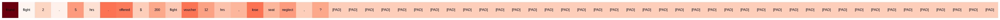

Prediction: Negative


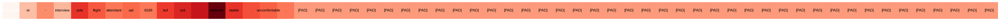

Prediction: Negative


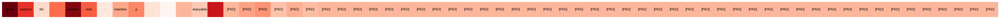

Prediction: Negative


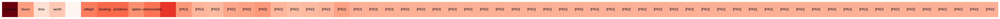

Prediction: Negative


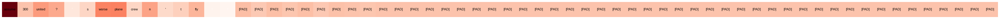

Prediction: Negative


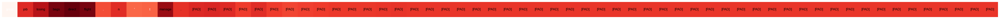

Prediction: Positive


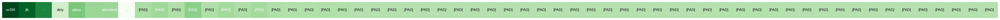

Prediction: Negative


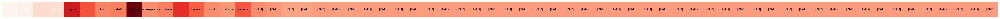

Prediction: Positive


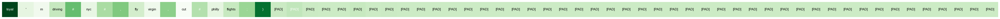

Prediction: Positive


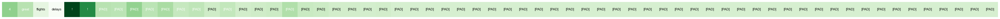

Prediction: Negative


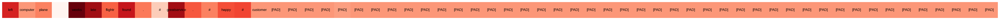

Prediction: Negative


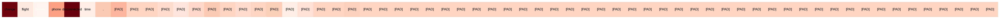

Prediction: Positive


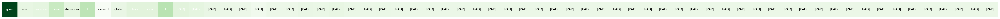

Prediction: Negative


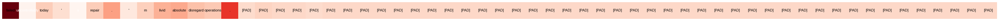

Prediction: Negative


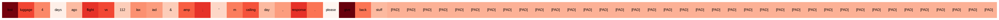

Prediction: Negative


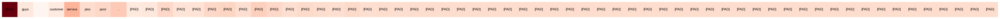

Prediction: Negative


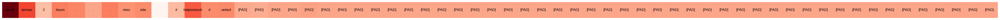

Prediction: Positive


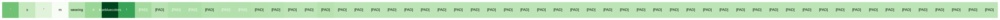

Prediction: Positive


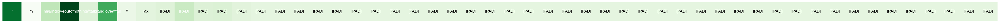

Prediction: Negative


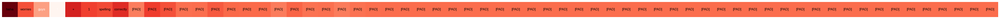

Prediction: Negative


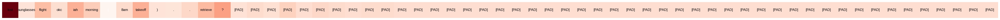

Prediction: Negative


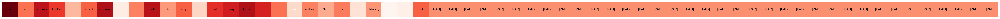

Prediction: Negative


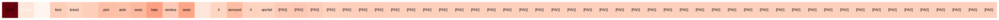

Prediction: Negative


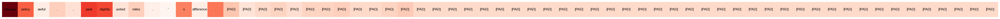

Prediction: Positive


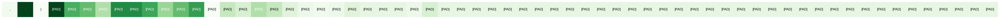

Prediction: Negative


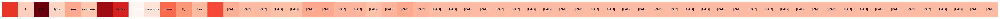

Prediction: Negative


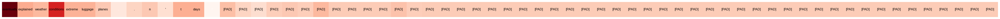

Prediction: Positive


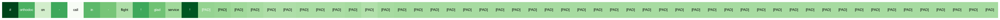

Prediction: Positive


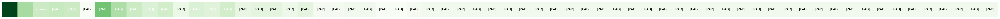

Prediction: Positive


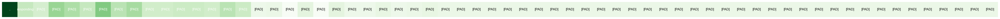

Prediction: Positive


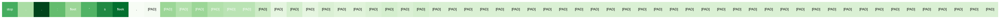

Prediction: Positive


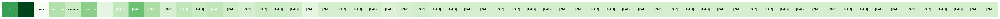

Prediction: Negative


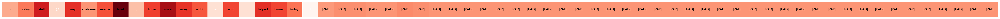

Prediction: Negative


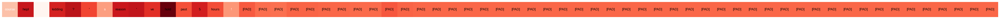

Prediction: Negative


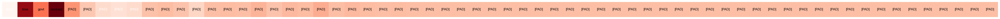

Prediction: Positive


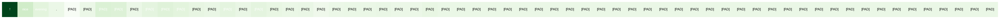

Prediction: Positive


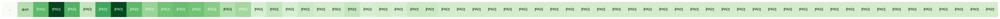

Prediction: Negative


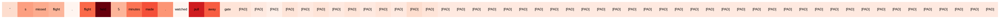

Prediction: Negative


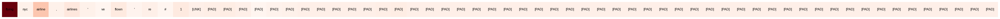

Prediction: Positive


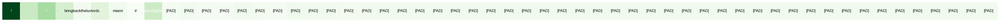

Prediction: Negative


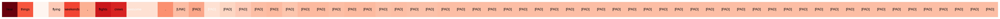

Prediction: Positive


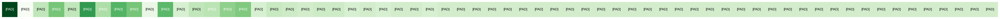

Prediction: Negative


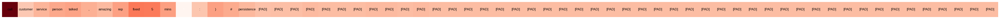

Prediction: Positive


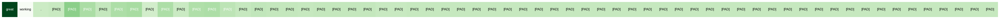

Prediction: Negative


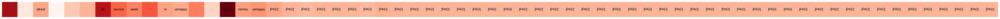

Prediction: Negative


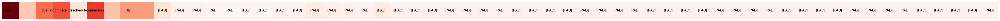

Prediction: Positive


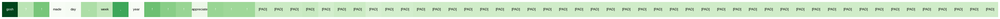

Prediction: Positive


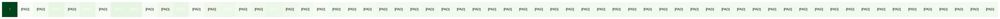

Prediction: Positive


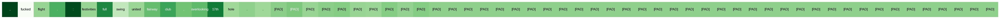

Prediction: Negative


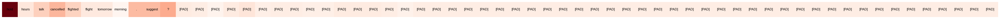

Prediction: Negative


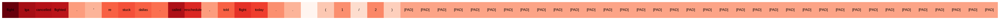

Prediction: Negative


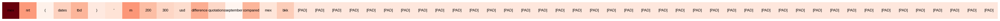

Prediction: Positive


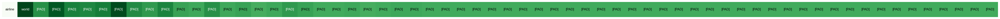

Prediction: Positive


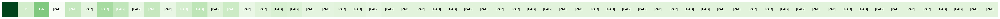

Prediction: Negative


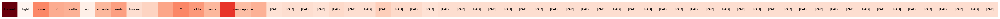

Prediction: Positive


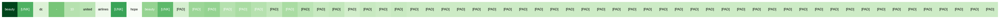

Prediction: Positive


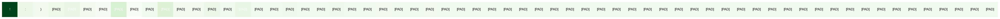

Prediction: Positive


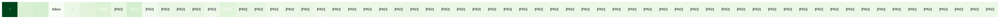

Prediction: Positive


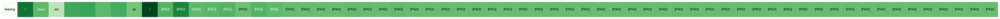

Prediction: Negative


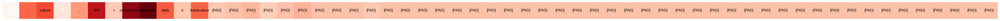

Prediction: Negative


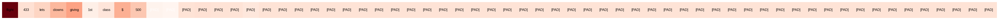

Prediction: Positive


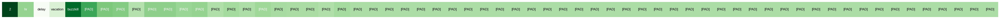

Prediction: Negative


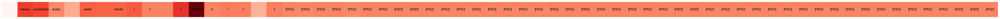

Prediction: Positive


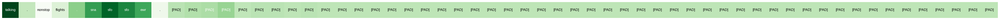

Prediction: Positive


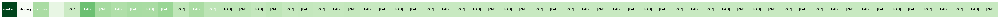

Prediction: Negative


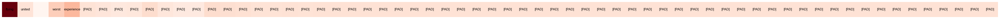

Prediction: Negative


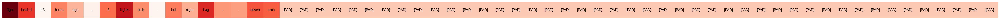

Prediction: Positive


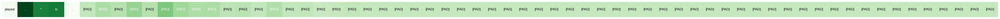

Prediction: Negative


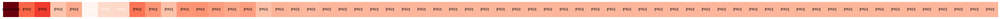

Prediction: Positive


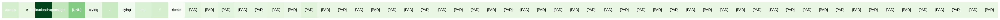

Prediction: Positive


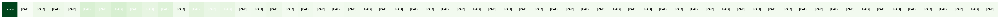

Prediction: Negative


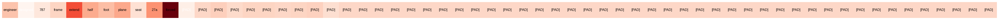

Prediction: Negative


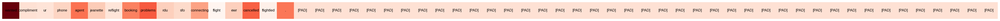

Prediction: Negative


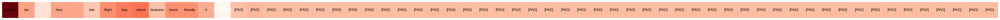

Prediction: Negative


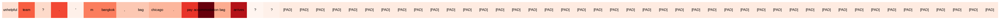

Prediction: Negative


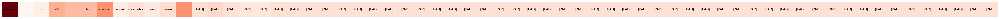

Prediction: Negative


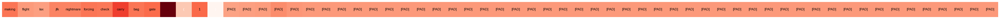

Prediction: Positive


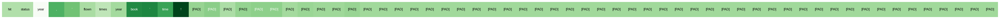

Prediction: Positive


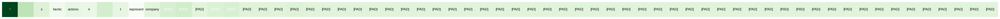

Prediction: Negative


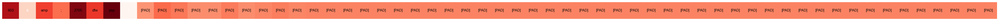

Prediction: Positive


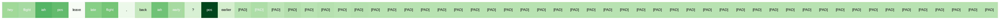

Prediction: Positive


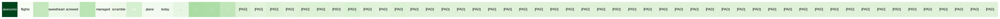

Prediction: Positive


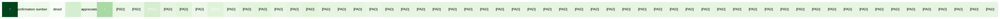

Prediction: Positive


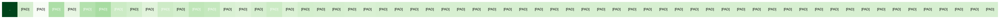

Prediction: Negative


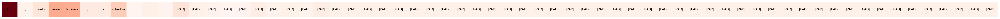

Prediction: Negative


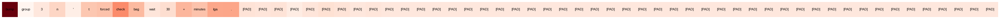

Prediction: Positive


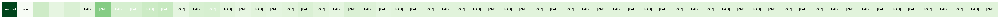

Prediction: Negative


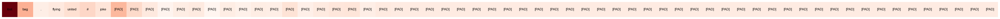

Prediction: Positive


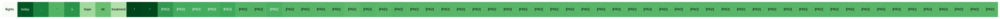

Prediction: Negative


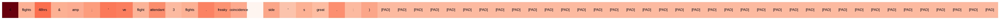

Prediction: Positive


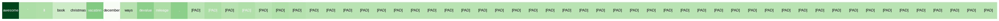

Prediction: Negative


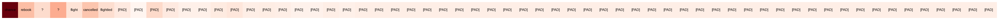

Prediction: Positive


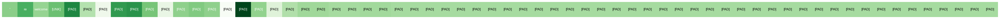

Prediction: Positive


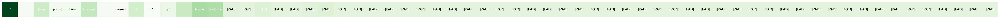

Prediction: Negative


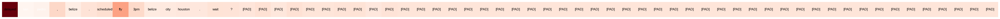

Prediction: Negative


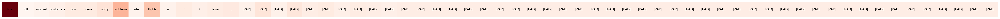

Prediction: Negative


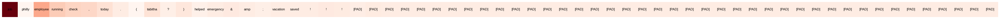

Prediction: Negative


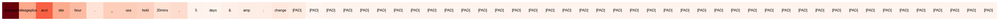

Prediction: Positive


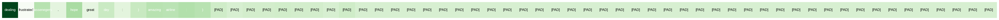

Prediction: Positive


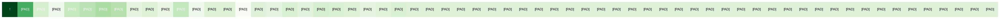

In [16]:
for x in range(len(sentences)):
  fig, ax = plt.subplots(figsize=(len(sentences[x]), 1))
  if prediction_model(np.array([to_explain[x]]))[0] == 0:
    print("Prediction: Negative")
    ax.imshow([sentence_explanations[x]], cmap="Reds", aspect="auto")
    ax.axis("off")
    for i, word in enumerate(sentences[x]):
      color = plt.cm.Blues(sentence_explanations[x][i])
      ax.text(i, 0, word, ha="center", va="center", fontsize="12", color="white" if sentence_explanations[x][i] < -0.02 else "black")#color="white" if heatmaps[x][i] > 0.5 else "black", bbox=dict(facecolor=color, edgecolor=color, pad=1))
  else:
    print("Prediction: Positive")
    ax.imshow([sentence_explanations[x]], cmap="Greens", aspect="auto")
    ax.axis("off")
    for i, word in enumerate(sentences[x]):
      color = plt.cm.Blues(sentence_explanations[x][i])
      ax.text(i, 0, word, ha="center", va="center", fontsize="12", color="white" if sentence_explanations[x][i] > 0.02 else "black")#color="white" if heatmaps[x][i] > 0.5 else "black", bbox=dict(facecolor=color, edgecolor=color, pad=1))


  plt.show()

In [17]:
def ablate(x, i):
  x[i] = 0
  for j in range(i, len(x)-1):
    x[j] = x[j+1]
  x[-1] = 0
  return x
def compute_contrast(X, model, explanation):
  contrast = [0]*len(X)
  for i in range(len(X)):
    old_prediction = model(np.array([X[i]]))
    for j in range(len(X[i])):
      x = ablate(copy.deepcopy(X[i]), j)
      new_prediction = model(np.array([x]))
      if (new_prediction != old_prediction):
        contrast[i] += explanation[i][j]
  return contrast

In [18]:
def compute_distinctiveness(data, train_data, explanation):
  distinctiveness = [0] * len(data)

  frequencies = []
  for x in np.unique(train_data):
    frequencies.append((np.mean(np.array(train_data) == x), x))
  sorted_frequencies = sorted(frequencies)
  word_specialty = {0: 0}
  for i, (f, x) in enumerate(sorted_frequencies):
    word_specialty[x] = 1 - i / len(sorted_frequencies)

  for i in range(len(data)):
    for j in range(len(data[i])):
      try:
        distinctiveness[i] += word_specialty[data[i][j]] * explanation[i][j]
      except:
        distinctiveness[i] += explanation[i][j]

  return distinctiveness

In [19]:
def compute_fidelity(X, explanation, model):
    fidelity = [0] * len(X)
    samples = 5
    for i in range(len(X)):
        change_ratings = [0]*len(X[i])
        x = 0
        while x < len(X[i]):
            change_rating = 0
            for change in range(samples):
                new_X = copy.deepcopy(X[i])
                new_X[x] = new_X[x] + (100 * change / samples)
                if (model(np.array([X[i]])) == model(np.array([new_X]))):
                    change_rating += 1/samples
            change_ratings[x] = change_rating
            if (X[i][x] == 0):
                x = len(X[i])
            x += 1
            
        for j in range(len(X[i])):
            fidelity[i] += change_ratings[j] * explanation[i][j]
    return fidelity

In [20]:
from nltk.corpus import wordnet as wn
def compute_realism(sentences, explanation, positive_words, negative_words, positive):
    """
    data: the word ids in the shape of #elements x #words
    topic: a wordnet synset
    id_to_token: a function from ids to tokens

    returns an array of length #elements
    """
    metrics = [0] * len(sentences)
    for i in range(len(sentences)):
        if (positive[i] == 1):
            for j in range(len(sentences[i])):
                vals = [0]
                for w in positive_words:
                    try:
                        vals.append(w.wup_similarity(wn.synsets(sentences[i][j])[0]))
                    except:
                        pass
                metrics[i] += explanation[i][j] * np.max(vals)
        else:
            for j in range(len(sentences[i])):
                vals = [0]
                for w in negative_words:
                    try:
                        vals.append(w.wup_similarity(wn.synsets(sentences[i][j])[0]))
                    except:
                        pass
                metrics[i] += explanation[i][j] * np.max(vals)
    return metrics

In [84]:
def compute_compactness(explanations):
    """
    Calculate the compactness based on the number of outliers in a list of numeric data points, using the interquartile range (IQR) method.
    """
    results = []
    for data in explanations:
      q1, q3 = np.percentile(data, [0, 100])
      iqr = q3 - q1
      upper_bound = q3 - (0.4 * iqr)
      outliers = len([x for x in data if x > upper_bound])
      if outliers == 0:
        results.append(0)
      else:
        results.append(max(0, 1.25 - (0.25 * outliers)))
    return results

In [22]:
contrast = compute_contrast(to_explain, prediction_model, standardized_explanations)
print(contrast)

[0, 0, 0, 0, 0.3248263888888889, 0.8934027777777777, 0.5114583333333332, 0.42708333333333337, 0.5927083333333334, 0, 0.05260416666666666, 0, 0, 0.1970486111111111, 0, 0, 0, 0.5493055555555555, 0.23802083333333335, 0.5989583333333334, 0.1171875, 0.7453124999999999, 0.03046875, 0.1609375, 0, 0.12656249999999997, 0.4632812500000001, 0, 0, 0.14453124999999997, 0, 0.37734375, 0.32109374999999996, 0.04296875, 0.5265625, 0, -0.017968750000000012, 0, 0.38984375, 0, 0.3851562499999999, 0, 0, 0, 0.4125, 0.15703124999999996, 0, 0, 0.2515625, 0, 0.07890625, 0, -0.15703124999999998, 0, 0.15390624999999997, 0, 0, 0, 0.26484375, -0.03984375, 0, 0.24625, 0, 0, 0.29125, 0.441875, 0, 0.19124999999999998, 0.14937499999999998, 0, 0, 0.34875, 0, 0, 0.034375, 0.241875, 0, 0.5237499999999999, 0.49374999999999986, 0.34, 0.48211805555555554, 0.444704861111111, 0.4113715277777777, 0, 0, 0, 0.2780381944444445, 0.32925347222222223, 0.6288194444444445, 0, 0.5404513888888888, 0, 0, -0.03810763888888882, 0.025520833

In [23]:
distinctiveness = compute_distinctiveness(to_explain, X_train_padded, standardized_explanations)
print(distinctiveness)

[0.19768039119000713, 0.25612401754228736, 0.2260401724344038, 0.20719426140099273, 0.2983100233100238, 0.306084887334888, 0.16588126083318436, 0.1922584760325151, -0.07781074427709062, -0.002398429561891084, 0.11473256978064669, 0.20871538984519825, 0.05303506589564294, 0.3142145381328079, 0.06218088802223415, 0.029336448807602614, 0.10103148720937179, 0.17197427305600427, 0.40155885780885714, 0.22241264344629788, 0.12169387103281312, 0.24392188340505633, 0.16484248924152758, 0.21220498251748235, 0.0011157712479828183, 0.276784393491125, 0.49390255177514875, 0.11407636834319525, 0.015928422538999495, 0.0172774341043572, 0.032344758606777865, -0.018979878294782124, 0.32149845346960826, 0.13963530459924672, 0.6134989409628817, 0.019477037385691245, 0.0007846120225928244, 0.17943997108660553, 0.03531132329209257, -0.0051737325174825155, 0.28342522861753533, 0.0005379236148467248, 0.1696749764658419, -0.006045757127487906, 0.257396869956965, 0.05292327864443249, 0.07744881320602452, 0.000

In [24]:
fidelity = compute_fidelity(to_explain, standardized_explanations, prediction_model)
print(fidelity)

[0.5625, 0.5625, 0.45833333333333337, 0.39392361111111107, 0.38017361111111114, 0.018923611111111162, 0.12756944444444446, 0.3627777777777777, 0.25423611111111105, 0.4189236111111111, 0.5324652777777779, 0.358125, 0.584375, 0.43993055555555555, 0.5953125, 0.18854166666666666, 0.4734027777777777, 0.2173611111111112, 0.6365625, -0.011562499999999986, 0.5154687499999999, 0.17703125000000006, 0.4857812499999999, 0.51796875, 0.15171875, 0.5018750000000001, 0.44421874999999994, 0.6348437500000002, 0.278125, 0.19921874999999994, 0.5054687499999999, 0.22437500000000002, 0.59453125, 0.31203125000000004, 0.17796875, 0.355, 0.04921874999999999, 0.56875, 0.4985937500000001, 0.6984375, 0.3298437500000001, 0.12109375, 0.6612499999999999, -0.02437500000000001, 0.5540625000000001, 0.65234375, 0.6015625, 0.3328124999999999, 0.34890625, 0.6414062500000001, 0.75390625, 0.7187499999999998, -0.03578125, 0.30859375000000006, 0.6640625000000001, 0.2810937499999999, 0.3968749999999999, 0.4437499999999999, 0.0

In [25]:
positive = prediction_model(to_explain)
realism = compute_realism(
    sentences,
    sentence_explanations,
    [wn.synset("good.a.01"), wn.synset("fast.a.01"), wn.synset("happy.a.01")],
    [wn.synset("bad.a.01"), wn.synset("slow.a.01"), wn.synset("angry.a.01"), wn.synset("sad.a.01")],
    positive
)
print(realism)

[0.10630586620169953, 0.07744435541310542, 0.06962380308734474, 0.07703414351851853, 0.16408372973477142, 0.16141473495640163, 0.03356274801587301, 0.05732330747955746, 0.12285090488215486, 0.006454475308641976, 0.09830064033189034, 0.09498704805996473, 0.1116130927328844, 0.1290929527648278, 0.09623921506734007, 0.06375755321067819, 0.09859217171717169, -0.029853658108866445, -0.002485795454545463, 0.06998579545454546, 0.11516183035714285, 0.1957037883991009, 0.14695154671717167, 0.1344034090909091, 0.0, 0.03752773268398269, 0.20343036737567988, -0.008119892260517264, 0.007812500000000003, 0.012812499999999998, 0.04195312500000001, 0.05194059157754011, 0.2021542996933622, 0.06698547979797978, 0.1602627840909091, 0.01393028846153846, 0.003551136363636363, 0.17314560873154625, 0.08508522727272727, 0.0011718749999999993, 0.18452256944444445, 0.0, 0.1366372559731935, 0.04156250000000001, 0.15690498737373737, 0.10521730006105004, -0.032410189636752136, 0.0, 0.06889587842712841, 0.120937499

In [74]:
import numpy as np
standardized_explanations = [np.array([ 0.12204861, -0.0140625 ,  0.00815972, -0.01128472,  0.03315972,
        0.00260417, -0.00017361,  0.04982639,  0.04704861,  0.0109375 ,
        0.02760417,  0.01371528,  0.01371528,  0.0359375 ,  0.03038194,
       -0.00295139,  0.01927083,  0.02204861,  0.04982639,  0.02204861,
        0.03315972,  0.0109375 ,  0.02760417,  0.0109375 ,  0.0109375 ,
        0.0109375 ,  0.0109375 ,  0.0109375 ,  0.0109375 ,  0.0109375 ,
        0.0109375 ,  0.0109375 ,  0.0109375 ,  0.0109375 ,  0.0109375 ,
        0.0109375 ,  0.0109375 ,  0.0109375 ,  0.0109375 ,  0.0109375 ,
        0.0109375 ,  0.0109375 ,  0.0109375 ,  0.0109375 ,  0.0109375 ,
        0.0109375 ,  0.0109375 ,  0.0109375 ,  0.0109375 ,  0.0109375 ,
        0.0109375 ,  0.0109375 ,  0.0109375 ,  0.0109375 ,  0.0109375 ,
        0.0109375 ,  0.0109375 ,  0.0109375 ,  0.0109375 ,  0.0109375 ,
        0.0109375 ,  0.0109375 ,  0.0109375 ,  0.0109375 ]), np.array([-0.03350694, -0.00295139,  0.01649306, -0.00017361,  0.04982639,
        0.0359375 ,  0.02482639,  0.0109375 ,  0.01927083,  0.03038194,
       -0.00572917,  0.02204861,  0.02482639,  0.03038194,  0.02482639,
        0.06371528,  0.03871528,  0.04149306,  0.01371528,  0.04982639,
        0.03871528,  0.03315972,  0.02482639,  0.0109375 ,  0.0109375 ,
        0.0109375 ,  0.0109375 ,  0.0109375 ,  0.0109375 ,  0.0109375 ,
        0.0109375 ,  0.0109375 ,  0.0109375 ,  0.0109375 ,  0.0109375 ,
        0.0109375 ,  0.0109375 ,  0.0109375 ,  0.0109375 ,  0.0109375 ,
        0.0109375 ,  0.0109375 ,  0.0109375 ,  0.0109375 ,  0.0109375 ,
        0.0109375 ,  0.0109375 ,  0.0109375 ,  0.0109375 ,  0.0109375 ,
        0.0109375 ,  0.0109375 ,  0.0109375 ,  0.0109375 ,  0.0109375 ,
        0.0109375 ,  0.0109375 ,  0.0109375 ,  0.0109375 ,  0.0109375 ,
        0.0109375 ,  0.0109375 ,  0.0109375 ,  0.0109375 ]), np.array([ 0.1109375 ,  0.06371528,  0.0109375 , -0.01684028,  0.04149306,
        0.10260417,  0.04704861, -0.0140625 ,  0.01649306,  0.03038194,
       -0.01128472, -0.02517361,  0.0109375 ,  0.00260417,  0.07760417,
        0.0109375 ,  0.01927083,  0.02482639,  0.00538194,  0.01371528,
        0.00815972,  0.0109375 ,  0.0109375 ,  0.0109375 ,  0.0109375 ,
        0.0109375 ,  0.0109375 ,  0.0109375 ,  0.0109375 ,  0.0109375 ,
        0.0109375 ,  0.0109375 ,  0.0109375 ,  0.0109375 ,  0.0109375 ,
        0.0109375 ,  0.0109375 ,  0.0109375 ,  0.0109375 ,  0.0109375 ,
        0.0109375 ,  0.0109375 ,  0.0109375 ,  0.0109375 ,  0.0109375 ,
        0.0109375 ,  0.0109375 ,  0.0109375 ,  0.0109375 ,  0.0109375 ,
        0.0109375 ,  0.0109375 ,  0.0109375 ,  0.0109375 ,  0.0109375 ,
        0.0109375 ,  0.0109375 ,  0.0109375 ,  0.0109375 ,  0.0109375 ,
        0.0109375 ,  0.0109375 ,  0.0109375 ,  0.0109375 ]), np.array([ 0.14704861,  0.02204861, -0.01961806, -0.00295139, -0.04184028,
        0.02482639,  0.01649306,  0.05260417,  0.05260417,  0.03038194,
        0.04704861,  0.08038194,  0.02482639,  0.00815972,  0.00538194,
        0.01649306,  0.01927083,  0.02482639,  0.00815972,  0.00260417,
        0.00538194,  0.00815972,  0.01927083,  0.0109375 ,  0.0109375 ,
        0.0109375 ,  0.0109375 ,  0.0109375 ,  0.0109375 ,  0.0109375 ,
        0.0109375 ,  0.0109375 ,  0.0109375 ,  0.0109375 ,  0.0109375 ,
        0.0109375 ,  0.0109375 ,  0.0109375 ,  0.0109375 ,  0.0109375 ,
        0.0109375 ,  0.0109375 ,  0.0109375 ,  0.0109375 ,  0.0109375 ,
        0.0109375 ,  0.0109375 ,  0.0109375 ,  0.0109375 ,  0.0109375 ,
        0.0109375 ,  0.0109375 ,  0.0109375 ,  0.0109375 ,  0.0109375 ,
        0.0109375 ,  0.0109375 ,  0.0109375 ,  0.0109375 ,  0.0109375 ,
        0.0109375 ,  0.0109375 ,  0.0109375 ,  0.0109375 ]), np.array([ 0.32482639,  0.0109375 ,  0.0609375 ,  0.04427083, -0.04461806,
       -0.0140625 ,  0.09149306,  0.09427083, -0.0140625 ,  0.05260417,
       -0.01961806, -0.00572917,  0.03038194, -0.07239583, -0.07795139,
        0.01927083,  0.00260417,  0.01649306,  0.00815972,  0.01649306,
        0.00538194,  0.01371528,  0.0109375 ,  0.00815972,  0.0109375 ,
        0.0109375 ,  0.0109375 ,  0.0109375 ,  0.0109375 ,  0.0109375 ,
        0.0109375 ,  0.0109375 ,  0.0109375 ,  0.0109375 ,  0.0109375 ,
        0.0109375 ,  0.0109375 ,  0.0109375 ,  0.0109375 ,  0.0109375 ,
        0.0109375 ,  0.0109375 ,  0.0109375 ,  0.0109375 ,  0.0109375 ,
        0.0109375 ,  0.0109375 ,  0.0109375 ,  0.0109375 ,  0.0109375 ,
        0.0109375 ,  0.0109375 ,  0.0109375 ,  0.0109375 ,  0.0109375 ,
        0.0109375 ,  0.0109375 ,  0.0109375 ,  0.0109375 ,  0.0109375 ,
        0.0109375 ,  0.0109375 ,  0.0109375 ,  0.0109375 ]), np.array([-3.55729167e-01,  3.31597222e-02,  1.08159722e-01,  1.91493056e-01,
        2.13715278e-01,  1.91493056e-01, -2.79513889e-02,  2.76041667e-02,
       -6.68402778e-02, -6.12847222e-02,  1.55381944e-01,  1.92708333e-02,
        3.59375000e-02,  4.14930556e-02,  3.31597222e-02, -1.73611111e-04,
        2.76041667e-02, -1.73611111e-04, -1.68402778e-02, -8.50694444e-03,
       -1.73611111e-04,  5.38194444e-03,  5.38194444e-03,  8.15972222e-03,
        1.09375000e-02,  1.37152778e-02,  1.09375000e-02,  1.09375000e-02,
        1.09375000e-02,  1.09375000e-02,  1.09375000e-02,  1.09375000e-02,
        1.09375000e-02,  1.09375000e-02,  1.09375000e-02,  1.09375000e-02,
        1.09375000e-02,  1.09375000e-02,  1.09375000e-02,  1.09375000e-02,
        1.09375000e-02,  1.09375000e-02,  1.09375000e-02,  1.09375000e-02,
        1.09375000e-02,  1.09375000e-02,  1.09375000e-02,  1.09375000e-02,
        1.09375000e-02,  1.09375000e-02,  1.09375000e-02,  1.09375000e-02,
        1.09375000e-02,  1.09375000e-02,  1.09375000e-02,  1.09375000e-02,
        1.09375000e-02,  1.09375000e-02,  1.09375000e-02,  1.09375000e-02,
        1.09375000e-02,  1.09375000e-02,  1.09375000e-02,  1.09375000e-02]), np.array([ 0.02690972,  0.04079861,  0.13246528,  0.04357639,  0.01579861,
        0.19635417,  0.16579861, -0.03142361,  0.06302083,  0.03246528,
        0.0296875 , -0.10364583,  0.01302083,  0.02690972,  0.01024306,
        0.04635417,  0.01024306,  0.02135417,  0.01302083,  0.02135417,
        0.01024306,  0.00746528,  0.00746528,  0.01024306,  0.00746528,
        0.0046875 ,  0.0046875 ,  0.0046875 ,  0.0046875 ,  0.0046875 ,
        0.0046875 ,  0.0046875 ,  0.0046875 ,  0.0046875 ,  0.0046875 ,
        0.0046875 ,  0.0046875 ,  0.0046875 ,  0.0046875 ,  0.0046875 ,
        0.0046875 ,  0.0046875 ,  0.0046875 ,  0.0046875 ,  0.0046875 ,
        0.0046875 ,  0.0046875 ,  0.0046875 ,  0.0046875 ,  0.0046875 ,
        0.0046875 ,  0.0046875 ,  0.0046875 ,  0.0046875 ,  0.0046875 ,
        0.0046875 ,  0.0046875 ,  0.0046875 ,  0.0046875 ,  0.0046875 ,
        0.0046875 ,  0.0046875 ,  0.0046875 ,  0.0046875 ]), np.array([-0.07239583, -0.06684028, -0.0390625 , -0.04184028,  0.10538194,
        0.06371528,  0.03038194,  0.03315972,  0.16927083,  0.02204861,
        0.03315972,  0.08871528,  0.05538194,  0.02204861,  0.01371528,
        0.0609375 ,  0.02204861,  0.01371528,  0.00538194,  0.00538194,
        0.0109375 ,  0.00815972,  0.00815972,  0.0109375 ,  0.0109375 ,
        0.0109375 ,  0.0109375 ,  0.0109375 ,  0.0109375 ,  0.0109375 ,
        0.0109375 ,  0.0109375 ,  0.0109375 ,  0.0109375 ,  0.0109375 ,
        0.0109375 ,  0.0109375 ,  0.0109375 ,  0.0109375 ,  0.0109375 ,
        0.0109375 ,  0.0109375 ,  0.0109375 ,  0.0109375 ,  0.0109375 ,
        0.0109375 ,  0.0109375 ,  0.0109375 ,  0.0109375 ,  0.0109375 ,
        0.0109375 ,  0.0109375 ,  0.0109375 ,  0.0109375 ,  0.0109375 ,
        0.0109375 ,  0.0109375 ,  0.0109375 ,  0.0109375 ,  0.0109375 ,
        0.0109375 ,  0.0109375 ,  0.0109375 ,  0.0109375 ]), np.array([ 0.32690972, -0.04253472, -0.07309028,  0.01579861,  0.13246528,
       -0.04809028,  0.0546875 ,  0.1046875 , -0.00642361, -0.06753472,
        0.09079861, -0.08975694,  0.04079861, -0.0203125 , -0.0203125 ,
        0.01302083,  0.07413194,  0.26579861,  0.00746528,  0.02135417,
        0.00746528,  0.0046875 ,  0.0046875 ,  0.01302083,  0.0046875 ,
        0.00746528,  0.0046875 ,  0.0046875 ,  0.0046875 ,  0.0046875 ,
        0.0046875 ,  0.0046875 ,  0.0046875 ,  0.0046875 ,  0.0046875 ,
        0.0046875 ,  0.0046875 ,  0.0046875 ,  0.0046875 ,  0.0046875 ,
        0.0046875 ,  0.0046875 ,  0.0046875 ,  0.0046875 ,  0.0046875 ,
        0.0046875 ,  0.0046875 ,  0.0046875 ,  0.0046875 ,  0.0046875 ,
        0.0046875 ,  0.0046875 ,  0.0046875 ,  0.0046875 ,  0.0046875 ,
        0.0046875 ,  0.0046875 ,  0.0046875 ,  0.0046875 ,  0.0046875 ,
        0.0046875 ,  0.0046875 ,  0.0046875 ,  0.0046875 ]), np.array([ 0.06302083,  0.03246528, -0.01197917, -0.03975694,  0.20190972,
        0.14079861,  0.03246528,  0.0296875 ,  0.06024306,  0.0296875 ,
        0.04357639,  0.02135417,  0.02690972,  0.01302083,  0.02413194,
        0.01024306,  0.01302083,  0.01579861,  0.03802083,  0.01857639,
        0.01579861,  0.01024306,  0.01024306,  0.00746528,  0.01024306,
        0.0046875 ,  0.0046875 ,  0.0046875 ,  0.0046875 ,  0.0046875 ,
        0.0046875 ,  0.0046875 ,  0.0046875 ,  0.0046875 ,  0.0046875 ,
        0.0046875 ,  0.0046875 ,  0.0046875 ,  0.0046875 ,  0.0046875 ,
        0.0046875 ,  0.0046875 ,  0.0046875 ,  0.0046875 ,  0.0046875 ,
        0.0046875 ,  0.0046875 ,  0.0046875 ,  0.0046875 ,  0.0046875 ,
        0.0046875 ,  0.0046875 ,  0.0046875 ,  0.0046875 ,  0.0046875 ,
        0.0046875 ,  0.0046875 ,  0.0046875 ,  0.0046875 ,  0.0046875 ,
        0.0046875 ,  0.0046875 ,  0.0046875 ,  0.0046875 ]), np.array([ 0.05260417,  0.0109375 ,  0.01927083, -0.03072917,  0.0859375 ,
        0.07204861,  0.0109375 ,  0.01927083,  0.05815972,  0.02204861,
       -0.00850694,  0.01927083,  0.00538194,  0.00260417,  0.04427083,
        0.03315972,  0.01927083,  0.0359375 ,  0.03871528,  0.0109375 ,
        0.0109375 ,  0.0109375 ,  0.0109375 ,  0.0109375 ,  0.00815972,
        0.0109375 ,  0.0109375 ,  0.0109375 ,  0.0109375 ,  0.0109375 ,
        0.0109375 ,  0.0109375 ,  0.0109375 ,  0.0109375 ,  0.0109375 ,
        0.0109375 ,  0.0109375 ,  0.0109375 ,  0.0109375 ,  0.0109375 ,
        0.0109375 ,  0.0109375 ,  0.0109375 ,  0.0109375 ,  0.0109375 ,
        0.0109375 ,  0.0109375 ,  0.0109375 ,  0.0109375 ,  0.0109375 ,
        0.0109375 ,  0.0109375 ,  0.0109375 ,  0.0109375 ,  0.0109375 ,
        0.0109375 ,  0.0109375 ,  0.0109375 ,  0.0109375 ,  0.0109375 ,
        0.0109375 ,  0.0109375 ,  0.0109375 ,  0.0109375 ]), np.array([ 1.88715278e-01, -8.50694444e-03, -2.51736111e-02,  4.70486111e-02,
        1.94270833e-01, -1.40625000e-02,  1.92708333e-02,  3.31597222e-02,
        1.09375000e-02,  1.09375000e-02,  5.38194444e-03, -2.95138889e-03,
        8.15972222e-03,  1.92708333e-02,  1.09375000e-02,  5.38194444e-03,
        1.09375000e-02,  1.64930556e-02, -1.40625000e-02, -1.73611111e-04,
        1.09375000e-02,  1.09375000e-02,  1.37152778e-02,  1.09375000e-02,
        1.09375000e-02,  1.09375000e-02,  1.09375000e-02,  1.09375000e-02,
        1.09375000e-02,  1.09375000e-02,  1.09375000e-02,  1.09375000e-02,
        1.09375000e-02,  1.09375000e-02,  1.09375000e-02,  1.09375000e-02,
        1.09375000e-02,  1.09375000e-02,  1.09375000e-02,  1.09375000e-02,
        1.09375000e-02,  1.09375000e-02,  1.09375000e-02,  1.09375000e-02,
        1.09375000e-02,  1.09375000e-02,  1.09375000e-02,  1.09375000e-02,
        1.09375000e-02,  1.09375000e-02,  1.09375000e-02,  1.09375000e-02,
        1.09375000e-02,  1.09375000e-02,  1.09375000e-02,  1.09375000e-02,
        1.09375000e-02,  1.09375000e-02,  1.09375000e-02,  1.09375000e-02,
        1.09375000e-02,  1.09375000e-02,  1.09375000e-02,  1.09375000e-02]), np.array([ 0.37413194,  0.01302083,  0.02135417,  0.06857639,  0.01857639,
        0.08524306, -0.02864583,  0.01024306,  0.02690972,  0.02690972,
        0.09079861,  0.02690972,  0.02135417,  0.01024306,  0.0046875 ,
        0.00190972, -0.00920139,  0.00190972,  0.00190972,  0.01024306,
        0.00746528,  0.01302083,  0.00746528,  0.0046875 ,  0.00746528,
        0.0046875 ,  0.0046875 ,  0.0046875 ,  0.0046875 ,  0.0046875 ,
        0.0046875 ,  0.0046875 ,  0.0046875 ,  0.0046875 ,  0.0046875 ,
        0.0046875 ,  0.0046875 ,  0.0046875 ,  0.0046875 ,  0.0046875 ,
        0.0046875 ,  0.0046875 ,  0.0046875 ,  0.0046875 ,  0.0046875 ,
        0.0046875 ,  0.0046875 ,  0.0046875 ,  0.0046875 ,  0.0046875 ,
        0.0046875 ,  0.0046875 ,  0.0046875 ,  0.0046875 ,  0.0046875 ,
        0.0046875 ,  0.0046875 ,  0.0046875 ,  0.0046875 ,  0.0046875 ,
        0.0046875 ,  0.0046875 ,  0.0046875 ,  0.0046875 ]), np.array([ 0.19704861, -0.01128472, -0.02239583, -0.01128472, -0.01684028,
        0.04149306,  0.01927083,  0.00538194, -0.02239583,  0.01927083,
        0.04982639, -0.00572917,  0.01649306,  0.01927083,  0.01927083,
        0.04427083,  0.02760417,  0.02204861,  0.11927083,  0.00815972,
        0.01371528,  0.0109375 ,  0.0109375 ,  0.00815972,  0.0109375 ,
        0.0109375 ,  0.0109375 ,  0.0109375 ,  0.0109375 ,  0.0109375 ,
        0.0109375 ,  0.0109375 ,  0.0109375 ,  0.0109375 ,  0.0109375 ,
        0.0109375 ,  0.0109375 ,  0.0109375 ,  0.0109375 ,  0.0109375 ,
        0.0109375 ,  0.0109375 ,  0.0109375 ,  0.0109375 ,  0.0109375 ,
        0.0109375 ,  0.0109375 ,  0.0109375 ,  0.0109375 ,  0.0109375 ,
        0.0109375 ,  0.0109375 ,  0.0109375 ,  0.0109375 ,  0.0109375 ,
        0.0109375 ,  0.0109375 ,  0.0109375 ,  0.0109375 ,  0.0109375 ,
        0.0109375 ,  0.0109375 ,  0.0109375 ,  0.0109375 ]), np.array([ 0.07204861,  0.03871528,  0.02204861, -0.01128472,  0.00815972,
        0.04427083,  0.02204861,  0.01649306,  0.00260417,  0.01927083,
       -0.00572917,  0.02204861,  0.00260417,  0.03315972,  0.04427083,
       -0.00017361,  0.02482639,  0.0359375 ,  0.00815972,  0.01649306,
        0.04427083,  0.02760417, -0.0140625 ,  0.07482639,  0.02760417,
        0.00815972,  0.0109375 ,  0.0109375 ,  0.0109375 ,  0.0109375 ,
        0.0109375 ,  0.0109375 ,  0.0109375 ,  0.0109375 ,  0.0109375 ,
        0.0109375 ,  0.0109375 ,  0.0109375 ,  0.0109375 ,  0.0109375 ,
        0.0109375 ,  0.0109375 ,  0.0109375 ,  0.0109375 ,  0.0109375 ,
        0.0109375 ,  0.0109375 ,  0.0109375 ,  0.0109375 ,  0.0109375 ,
        0.0109375 ,  0.0109375 ,  0.0109375 ,  0.0109375 ,  0.0109375 ,
        0.0109375 ,  0.0109375 ,  0.0109375 ,  0.0109375 ,  0.0109375 ,
        0.0109375 ,  0.0109375 ,  0.0109375 ,  0.0109375 ]), np.array([ 3.49826389e-01, -8.50694444e-03, -4.18402778e-02, -1.68402778e-02,
        6.37152778e-02,  1.09375000e-02,  1.92708333e-02,  3.59375000e-02,
       -1.40625000e-02, -8.50694444e-03,  1.92708333e-02, -2.95138889e-03,
       -1.73611111e-04,  1.92708333e-02,  2.20486111e-02,  8.15972222e-03,
        2.76041667e-02,  1.92708333e-02,  8.15972222e-03,  1.37152778e-02,
        1.09375000e-02,  8.15972222e-03,  1.37152778e-02,  8.15972222e-03,
        1.09375000e-02,  8.15972222e-03,  1.09375000e-02,  1.09375000e-02,
        1.09375000e-02,  1.09375000e-02,  1.09375000e-02,  1.09375000e-02,
        1.09375000e-02,  1.09375000e-02,  1.09375000e-02,  1.09375000e-02,
        1.09375000e-02,  1.09375000e-02,  1.09375000e-02,  1.09375000e-02,
        1.09375000e-02,  1.09375000e-02,  1.09375000e-02,  1.09375000e-02,
        1.09375000e-02,  1.09375000e-02,  1.09375000e-02,  1.09375000e-02,
        1.09375000e-02,  1.09375000e-02,  1.09375000e-02,  1.09375000e-02,
        1.09375000e-02,  1.09375000e-02,  1.09375000e-02,  1.09375000e-02,
        1.09375000e-02,  1.09375000e-02,  1.09375000e-02,  1.09375000e-02,
        1.09375000e-02,  1.09375000e-02,  1.09375000e-02,  1.09375000e-02]), np.array([ 0.1859375 ,  0.05260417,  0.03038194, -0.00850694,  0.04149306,
        0.0359375 ,  0.0109375 ,  0.04149306,  0.02482639,  0.03038194,
       -0.06961806, -0.00572917,  0.02760417,  0.01371528,  0.01649306,
        0.0109375 ,  0.03038194,  0.03315972,  0.00815972,  0.00538194,
        0.0109375 ,  0.0109375 ,  0.01371528,  0.0109375 ,  0.0109375 ,
        0.0109375 ,  0.0109375 ,  0.0109375 ,  0.0109375 ,  0.0109375 ,
        0.0109375 ,  0.0109375 ,  0.0109375 ,  0.0109375 ,  0.0109375 ,
        0.0109375 ,  0.0109375 ,  0.0109375 ,  0.0109375 ,  0.0109375 ,
        0.0109375 ,  0.0109375 ,  0.0109375 ,  0.0109375 ,  0.0109375 ,
        0.0109375 ,  0.0109375 ,  0.0109375 ,  0.0109375 ,  0.0109375 ,
        0.0109375 ,  0.0109375 ,  0.0109375 ,  0.0109375 ,  0.0109375 ,
        0.0109375 ,  0.0109375 ,  0.0109375 ,  0.0109375 ,  0.0109375 ,
        0.0109375 ,  0.0109375 ,  0.0109375 ,  0.0109375 ]), np.array([ 0.1296875 , -0.01475694, -0.07586806, -0.15642361,  0.01024306,
        0.06579861,  0.04635417,  0.14357639,  0.06302083,  0.1046875 ,
        0.05190972,  0.21302083,  0.04635417,  0.01302083,  0.0296875 ,
        0.0296875 ,  0.01857639,  0.02135417,  0.02135417,  0.01579861,
        0.01302083,  0.0046875 ,  0.00190972,  0.01579861,  0.0046875 ,
        0.0046875 ,  0.0046875 ,  0.0046875 ,  0.0046875 ,  0.0046875 ,
        0.0046875 ,  0.0046875 ,  0.0046875 ,  0.0046875 ,  0.0046875 ,
        0.0046875 ,  0.0046875 ,  0.0046875 ,  0.0046875 ,  0.0046875 ,
        0.0046875 ,  0.0046875 ,  0.0046875 ,  0.0046875 ,  0.0046875 ,
        0.0046875 ,  0.0046875 ,  0.0046875 ,  0.0046875 ,  0.0046875 ,
        0.0046875 ,  0.0046875 ,  0.0046875 ,  0.0046875 ,  0.0046875 ,
        0.0046875 ,  0.0046875 ,  0.0046875 ,  0.0046875 ,  0.0046875 ,
        0.0046875 ,  0.0046875 ,  0.0046875 ,  0.0046875 ]), np.array([ 0.23802083, -0.03420139,  0.05190972,  0.00746528,  0.08524306,
        0.04913194,  0.03246528,  0.01024306,  0.04635417,  0.01024306,
        0.0046875 ,  0.03802083,  0.01579861,  0.01579861,  0.07690972,
        0.06024306,  0.0296875 , -0.01753472, -0.00920139,  0.00746528,
        0.01302083,  0.04079861,  0.01579861,  0.01857639,  0.01024306,
        0.0046875 ,  0.0046875 ,  0.0046875 ,  0.0046875 ,  0.0046875 ,
        0.0046875 ,  0.0046875 ,  0.0046875 ,  0.0046875 ,  0.0046875 ,
        0.0046875 ,  0.0046875 ,  0.0046875 ,  0.0046875 ,  0.0046875 ,
        0.0046875 ,  0.0046875 ,  0.0046875 ,  0.0046875 ,  0.0046875 ,
        0.0046875 ,  0.0046875 ,  0.0046875 ,  0.0046875 ,  0.0046875 ,
        0.0046875 ,  0.0046875 ,  0.0046875 ,  0.0046875 ,  0.0046875 ,
        0.0046875 ,  0.0046875 ,  0.0046875 ,  0.0046875 ,  0.0046875 ,
        0.0046875 ,  0.0046875 ,  0.0046875 ,  0.0046875 ]), np.array([ 0.21371528,  0.04149306,  0.04704861, -0.06684028, -0.22517361,
        0.11927083,  0.06927083,  0.05538194,  0.09982639, -0.0140625 ,
        0.07482639,  0.04704861,  0.00538194,  0.00815972,  0.0359375 ,
        0.01649306,  0.01371528,  0.01371528, -0.01128472,  0.02204861,
        0.00260417,  0.00538194, -0.01128472,  0.00260417,  0.00815972,
        0.0109375 ,  0.0109375 ,  0.0109375 ,  0.0109375 ,  0.0109375 ,
        0.0109375 ,  0.0109375 ,  0.0109375 ,  0.0109375 ,  0.0109375 ,
        0.0109375 ,  0.0109375 ,  0.0109375 ,  0.0109375 ,  0.0109375 ,
        0.0109375 ,  0.0109375 ,  0.0109375 ,  0.0109375 ,  0.0109375 ,
        0.0109375 ,  0.0109375 ,  0.0109375 ,  0.0109375 ,  0.0109375 ,
        0.0109375 ,  0.0109375 ,  0.0109375 ,  0.0109375 ,  0.0109375 ,
        0.0109375 ,  0.0109375 ,  0.0109375 ,  0.0109375 ,  0.0109375 ,
        0.0109375 ,  0.0109375 ,  0.0109375 ,  0.0109375 ]), np.array([ 0.28046875, -0.00078125,  0.04296875, -0.01640625,  0.02421875,
        0.03359375,  0.02109375,  0.02734375, -0.03203125,  0.02421875,
       -0.01328125,  0.05546875, -0.00078125, -0.00390625,  0.01484375,
        0.04609375,  0.07109375,  0.00234375,  0.01171875,  0.00546875,
        0.02109375,  0.00859375,  0.01484375,  0.01171875,  0.00859375,
        0.01171875,  0.01171875,  0.00859375,  0.00859375,  0.00859375,
        0.00859375,  0.00859375,  0.00859375,  0.00859375,  0.00859375,
        0.00859375,  0.00859375,  0.00859375,  0.00859375,  0.00859375,
        0.00859375,  0.00859375,  0.00859375,  0.00859375,  0.00859375,
        0.00859375,  0.00859375,  0.00859375,  0.00859375,  0.00859375,
        0.00859375,  0.00859375,  0.00859375,  0.00859375,  0.00859375,
        0.00859375,  0.00859375,  0.00859375,  0.00859375,  0.00859375,
        0.00859375,  0.00859375,  0.00859375,  0.00859375]), np.array([ 0.13046875,  0.02734375,  0.08984375,  0.05859375, -0.01640625,
        0.03671875,  0.09921875, -0.05703125,  0.01796875,  0.09296875,
        0.00234375,  0.03671875, -0.03515625,  0.06484375,  0.07734375,
        0.09921875,  0.07421875,  0.02734375, -0.03828125,  0.01796875,
       -0.02578125,  0.01796875,  0.02109375, -0.04453125,  0.00546875,
       -0.06640625, -0.06015625,  0.03671875,  0.00859375,  0.00859375,
        0.00859375,  0.00859375,  0.00859375,  0.00859375,  0.00859375,
        0.00859375,  0.00859375,  0.00859375,  0.00859375,  0.00859375,
        0.00859375,  0.00859375,  0.00859375,  0.00859375,  0.00859375,
        0.00859375,  0.00859375,  0.00859375,  0.00859375,  0.00859375,
        0.00859375,  0.00859375,  0.00859375,  0.00859375,  0.00859375,
        0.00859375,  0.00859375,  0.00859375,  0.00859375,  0.00859375,
        0.00859375,  0.00859375,  0.00859375,  0.00859375]), np.array([ 0.35859375, -0.02890625, -0.06640625,  0.01484375,  0.00234375,
        0.01171875,  0.03359375,  0.03046875,  0.04296875,  0.07421875,
        0.01796875,  0.06796875, -0.02578125,  0.00234375,  0.03671875,
        0.00546875, -0.00390625,  0.00234375,  0.00546875,  0.01796875,
        0.02109375,  0.01484375,  0.00546875,  0.00859375,  0.01171875,
        0.01171875,  0.00859375,  0.00859375,  0.00859375,  0.00859375,
        0.00859375,  0.00859375,  0.00859375,  0.00859375,  0.00859375,
        0.00859375,  0.00859375,  0.00859375,  0.00859375,  0.00859375,
        0.00859375,  0.00859375,  0.00859375,  0.00859375,  0.00859375,
        0.00859375,  0.00859375,  0.00859375,  0.00859375,  0.00859375,
        0.00859375,  0.00859375,  0.00859375,  0.00859375,  0.00859375,
        0.00859375,  0.00859375,  0.00859375,  0.00859375,  0.00859375,
        0.00859375,  0.00859375,  0.00859375,  0.00859375]), np.array([ 0.14609375,  0.02421875,  0.08046875, -0.01015625,  0.01484375,
        0.00234375,  0.09921875,  0.09296875, -0.00078125,  0.01484375,
       -0.01328125, -0.01953125,  0.06171875, -0.01015625,  0.06796875,
        0.02109375, -0.00078125,  0.00859375,  0.01171875,  0.00546875,
        0.01171875,  0.01171875,  0.01484375,  0.00859375,  0.00859375,
        0.01171875,  0.01796875,  0.00859375,  0.00859375,  0.00859375,
        0.00859375,  0.00859375,  0.00859375,  0.00859375,  0.00859375,
        0.00859375,  0.00859375,  0.00859375,  0.00859375,  0.00859375,
        0.00859375,  0.00859375,  0.00859375,  0.00859375,  0.00859375,
        0.00859375,  0.00859375,  0.00859375,  0.00859375,  0.00859375,
        0.00859375,  0.00859375,  0.00859375,  0.00859375,  0.00859375,
        0.00859375,  0.00859375,  0.00859375,  0.00859375,  0.00859375,
        0.00859375,  0.00859375,  0.00859375,  0.00859375]), np.array([ 0.00078125,  0.08515625, -0.00234375,  0.08515625,  0.05078125,
        0.04453125,  0.02578125,  0.06328125,  0.06328125,  0.05390625,
        0.03203125,  0.04453125,  0.05703125, -0.00234375,  0.01953125,
        0.01328125,  0.02578125,  0.01953125,  0.01015625,  0.00390625,
        0.00078125,  0.00390625,  0.01015625,  0.00703125,  0.00703125,
        0.00703125,  0.00390625,  0.01328125,  0.00703125,  0.00703125,
        0.00703125,  0.00703125,  0.00703125,  0.00703125,  0.00703125,
        0.00703125,  0.00703125,  0.00703125,  0.00703125,  0.00703125,
        0.00703125,  0.00703125,  0.00703125,  0.00703125,  0.00703125,
        0.00703125,  0.00703125,  0.00703125,  0.00703125,  0.00703125,
        0.00703125,  0.00703125,  0.00703125,  0.00703125,  0.00703125,
        0.00703125,  0.00703125,  0.00703125,  0.00703125,  0.00703125,
        0.00703125,  0.00703125,  0.00703125,  0.00703125]), np.array([ 0.07734375, -0.00390625,  0.13984375, -0.00703125,  0.01796875,
        0.00234375,  0.12109375,  0.08984375, -0.03515625, -0.01640625,
        0.04921875,  0.00234375,  0.02734375,  0.00859375,  0.06796875,
        0.01484375,  0.00859375,  0.00859375,  0.00546875,  0.00546875,
        0.01796875,  0.01796875,  0.01171875,  0.01171875,  0.00546875,
        0.01171875,  0.01796875,  0.01171875,  0.00859375,  0.00859375,
        0.00859375,  0.00859375,  0.00859375,  0.00859375,  0.00859375,
        0.00859375,  0.00859375,  0.00859375,  0.00859375,  0.00859375,
        0.00859375,  0.00859375,  0.00859375,  0.00859375,  0.00859375,
        0.00859375,  0.00859375,  0.00859375,  0.00859375,  0.00859375,
        0.00859375,  0.00859375,  0.00859375,  0.00859375,  0.00859375,
        0.00859375,  0.00859375,  0.00859375,  0.00859375,  0.00859375,
        0.00859375,  0.00859375,  0.00859375,  0.00859375]), np.array([ 0.25546875,  0.03984375,  0.02734375,  0.16796875,  0.03359375,
        0.03359375,  0.01171875, -0.02578125, -0.00078125,  0.01171875,
       -0.01328125,  0.03671875,  0.03671875, -0.05078125,  0.02109375,
       -0.00078125, -0.01015625,  0.00546875,  0.01171875,  0.00546875,
        0.02734375,  0.00859375,  0.00859375,  0.00859375,  0.00859375,
        0.01796875,  0.00546875,  0.00859375,  0.00859375,  0.00859375,
        0.00859375,  0.00859375,  0.00859375,  0.00859375,  0.00859375,
        0.00859375,  0.00859375,  0.00859375,  0.00859375,  0.00859375,
        0.00859375,  0.00859375,  0.00859375,  0.00859375,  0.00859375,
        0.00859375,  0.00859375,  0.00859375,  0.00859375,  0.00859375,
        0.00859375,  0.00859375,  0.00859375,  0.00859375,  0.00859375,
        0.00859375,  0.00859375,  0.00859375,  0.00859375,  0.00859375,
        0.00859375,  0.00859375,  0.00859375,  0.00859375]), np.array([ 0.18515625,  0.03828125,  0.03828125, -0.00546875,  0.00390625,
       -0.03359375,  0.08515625, -0.08984375,  0.06328125,  0.04453125,
        0.00078125,  0.08515625,  0.05078125,  0.01328125,  0.16953125,
        0.02265625,  0.01953125,  0.01328125,  0.00703125,  0.00078125,
        0.00078125,  0.00390625,  0.00390625,  0.00390625,  0.00703125,
       -0.00234375,  0.00703125,  0.01015625,  0.00703125,  0.00703125,
        0.00703125,  0.00703125,  0.00703125,  0.00703125,  0.00703125,
        0.00703125,  0.00703125,  0.00703125,  0.00703125,  0.00703125,
        0.00703125,  0.00703125,  0.00703125,  0.00703125,  0.00703125,
        0.00703125,  0.00703125,  0.00703125,  0.00703125,  0.00703125,
        0.00703125,  0.00703125,  0.00703125,  0.00703125,  0.00703125,
        0.00703125,  0.00703125,  0.00703125,  0.00703125,  0.00703125,
        0.00703125,  0.00703125,  0.00703125,  0.00703125]), np.array([0.15078125, 0.05390625, 0.03515625, 0.03828125, 0.03515625,
       0.00078125, 0.07578125, 0.05078125, 0.03515625, 0.02578125,
       0.03203125, 0.01328125, 0.02578125, 0.02265625, 0.03203125,
       0.01640625, 0.01953125, 0.01953125, 0.01015625, 0.01953125,
       0.00390625, 0.00390625, 0.00703125, 0.00703125, 0.00078125,
       0.00078125, 0.00390625, 0.00703125, 0.00703125, 0.00703125,
       0.00703125, 0.00703125, 0.00703125, 0.00703125, 0.00703125,
       0.00703125, 0.00703125, 0.00703125, 0.00703125, 0.00703125,
       0.00703125, 0.00703125, 0.00703125, 0.00703125, 0.00703125,
       0.00703125, 0.00703125, 0.00703125, 0.00703125, 0.00703125,
       0.00703125, 0.00703125, 0.00703125, 0.00703125, 0.00703125,
       0.00703125, 0.00703125, 0.00703125, 0.00703125, 0.00703125,
       0.00703125, 0.00703125, 0.00703125, 0.00703125]), np.array([ 0.14453125,  0.03203125,  0.02265625,  0.05390625,  0.04453125,
        0.03203125,  0.06328125,  0.03828125,  0.04765625,  0.02578125,
        0.02578125,  0.02890625,  0.02890625,  0.02578125,  0.03828125,
        0.02890625,  0.00390625,  0.00703125, -0.00546875,  0.01328125,
       -0.00546875,  0.01328125,  0.00390625,  0.00390625,  0.01015625,
        0.00390625,  0.00703125,  0.01015625,  0.00703125,  0.00703125,
        0.00703125,  0.00703125,  0.00703125,  0.00703125,  0.00703125,
        0.00703125,  0.00703125,  0.00703125,  0.00703125,  0.00703125,
        0.00703125,  0.00703125,  0.00703125,  0.00703125,  0.00703125,
        0.00703125,  0.00703125,  0.00703125,  0.00703125,  0.00703125,
        0.00703125,  0.00703125,  0.00703125,  0.00703125,  0.00703125,
        0.00703125,  0.00703125,  0.00703125,  0.00703125,  0.00703125,
        0.00703125,  0.00703125,  0.00703125,  0.00703125]), np.array([ 0.06328125,  0.02890625,  0.11328125,  0.05390625,  0.03515625,
        0.06015625,  0.08203125,  0.01953125,  0.07578125, -0.01484375,
       -0.01171875,  0.03515625,  0.02578125,  0.03515625,  0.02578125,
        0.02265625,  0.02265625,  0.01328125,  0.00078125,  0.01015625,
        0.00078125,  0.00703125,  0.00390625,  0.00390625,  0.00703125,
        0.01015625,  0.00703125,  0.01015625,  0.00703125,  0.00703125,
        0.00703125,  0.00703125,  0.00703125,  0.00703125,  0.00703125,
        0.00703125,  0.00703125,  0.00703125,  0.00703125,  0.00703125,
        0.00703125,  0.00703125,  0.00703125,  0.00703125,  0.00703125,
        0.00703125,  0.00703125,  0.00703125,  0.00703125,  0.00703125,
        0.00703125,  0.00703125,  0.00703125,  0.00703125,  0.00703125,
        0.00703125,  0.00703125,  0.00703125,  0.00703125,  0.00703125,
        0.00703125,  0.00703125,  0.00703125,  0.00703125]), np.array([ 0.12265625,  0.00703125,  0.21640625, -0.04296875,  0.03828125,
        0.01953125,  0.06953125, -0.01171875,  0.02578125,  0.09140625,
        0.04453125,  0.00390625,  0.02890625,  0.01953125,  0.02890625,
        0.01328125,  0.00390625,  0.01640625,  0.01328125,  0.01015625,
       -0.01171875,  0.00703125,  0.00703125,  0.00703125,  0.00703125,
       -0.00234375,  0.00390625,  0.01015625,  0.00703125,  0.00703125,
        0.00703125,  0.00703125,  0.00703125,  0.00703125,  0.00703125,
        0.00703125,  0.00703125,  0.00703125,  0.00703125,  0.00703125,
        0.00703125,  0.00703125,  0.00703125,  0.00703125,  0.00703125,
        0.00703125,  0.00703125,  0.00703125,  0.00703125,  0.00703125,
        0.00703125,  0.00703125,  0.00703125,  0.00703125,  0.00703125,
        0.00703125,  0.00703125,  0.00703125,  0.00703125,  0.00703125,
        0.00703125,  0.00703125,  0.00703125,  0.00703125]), np.array([-0.00390625,  0.02421875,  0.07734375, -0.03203125,  0.02421875,
        0.03984375,  0.00859375,  0.04609375,  0.12734375, -0.01640625,
        0.05546875,  0.10234375,  0.06171875,  0.04296875, -0.03828125,
        0.05234375, -0.03828125,  0.06484375,  0.05234375,  0.02734375,
       -0.06015625,  0.00546875,  0.01171875,  0.01171875,  0.00859375,
        0.00859375,  0.01484375,  0.01171875,  0.00859375,  0.00859375,
        0.00859375,  0.00859375,  0.00859375,  0.00859375,  0.00859375,
        0.00859375,  0.00859375,  0.00859375,  0.00859375,  0.00859375,
        0.00859375,  0.00859375,  0.00859375,  0.00859375,  0.00859375,
        0.00859375,  0.00859375,  0.00859375,  0.00859375,  0.00859375,
        0.00859375,  0.00859375,  0.00859375,  0.00859375,  0.00859375,
        0.00859375,  0.00859375,  0.00859375,  0.00859375,  0.00859375,
        0.00859375,  0.00859375,  0.00859375,  0.00859375]), np.array([-0.08515625,  0.05234375,  0.04296875, -0.16328125,  0.08046875,
        0.10859375,  0.03984375, -0.04765625,  0.09296875,  0.10234375,
        0.06484375,  0.17734375,  0.03046875,  0.08359375,  0.03359375,
       -0.04140625,  0.02109375,  0.00234375, -0.00078125,  0.01171875,
        0.01171875,  0.00859375,  0.00859375,  0.00546875,  0.00546875,
        0.02421875,  0.01171875,  0.00859375,  0.00859375,  0.00859375,
        0.00859375,  0.00859375,  0.00859375,  0.00859375,  0.00859375,
        0.00859375,  0.00859375,  0.00859375,  0.00859375,  0.00859375,
        0.00859375,  0.00859375,  0.00859375,  0.00859375,  0.00859375,
        0.00859375,  0.00859375,  0.00859375,  0.00859375,  0.00859375,
        0.00859375,  0.00859375,  0.00859375,  0.00859375,  0.00859375,
        0.00859375,  0.00859375,  0.00859375,  0.00859375,  0.00859375,
        0.00859375,  0.00859375,  0.00859375,  0.00859375]), np.array([-0.07578125,  0.24609375,  0.09296875,  0.28046875,  0.05546875,
       -0.00078125, -0.02578125, -0.03515625, -0.02578125,  0.00546875,
        0.01171875,  0.00234375, -0.01953125,  0.00859375,  0.01171875,
        0.00859375,  0.02109375,  0.00234375,  0.01484375,  0.01171875,
        0.02734375,  0.00859375,  0.01484375,  0.01171875,  0.00859375,
        0.01171875,  0.00859375,  0.00859375,  0.00859375,  0.00859375,
        0.00859375,  0.00859375,  0.00859375,  0.00859375,  0.00859375,
        0.00859375,  0.00859375,  0.00859375,  0.00859375,  0.00859375,
        0.00859375,  0.00859375,  0.00859375,  0.00859375,  0.00859375,
        0.00859375,  0.00859375,  0.00859375,  0.00859375,  0.00859375,
        0.00859375,  0.00859375,  0.00859375,  0.00859375,  0.00859375,
        0.00859375,  0.00859375,  0.00859375,  0.00859375,  0.00859375,
        0.00859375,  0.00859375,  0.00859375,  0.00859375]), np.array([ 0.36953125,  0.05703125,  0.02578125,  0.00390625, -0.02734375,
        0.00390625,  0.03828125,  0.03515625,  0.00390625,  0.02265625,
        0.03203125,  0.02578125,  0.01640625,  0.01015625,  0.02265625,
        0.01015625,  0.02265625,  0.01328125,  0.00703125,  0.01015625,
       -0.00546875,  0.00390625,  0.00703125,  0.00703125,  0.01015625,
        0.00390625,  0.00390625,  0.01328125,  0.00703125,  0.00703125,
        0.00703125,  0.00703125,  0.00703125,  0.00703125,  0.00703125,
        0.00703125,  0.00703125,  0.00703125,  0.00703125,  0.00703125,
        0.00703125,  0.00703125,  0.00703125,  0.00703125,  0.00703125,
        0.00703125,  0.00703125,  0.00703125,  0.00703125,  0.00703125,
        0.00703125,  0.00703125,  0.00703125,  0.00703125,  0.00703125,
        0.00703125,  0.00703125,  0.00703125,  0.00703125,  0.00703125,
        0.00703125,  0.00703125,  0.00703125,  0.00703125]), np.array([-0.01796875,  0.01953125,  0.04765625,  0.10078125,  0.05078125,
        0.01328125,  0.05703125,  0.09765625,  0.04765625,  0.02890625,
        0.04140625,  0.04453125,  0.04140625,  0.03515625,  0.01953125,
        0.02578125,  0.00390625,  0.01328125,  0.00390625,  0.01015625,
        0.00703125,  0.00703125,  0.01328125,  0.00390625,  0.00703125,
        0.00390625,  0.01015625,  0.01015625,  0.00703125,  0.00703125,
        0.00703125,  0.00703125,  0.00703125,  0.00703125,  0.00703125,
        0.00703125,  0.00703125,  0.00703125,  0.00703125,  0.00703125,
        0.00703125,  0.00703125,  0.00703125,  0.00703125,  0.00703125,
        0.00703125,  0.00703125,  0.00703125,  0.00703125,  0.00703125,
        0.00703125,  0.00703125,  0.00703125,  0.00703125,  0.00703125,
        0.00703125,  0.00703125,  0.00703125,  0.00703125,  0.00703125,
        0.00703125,  0.00703125,  0.00703125,  0.00703125]), np.array([0.01484375, 0.03359375, 0.03046875, 0.02734375, 0.00234375,
       0.04921875, 0.09609375, 0.02734375, 0.04609375, 0.05546875,
       0.03671875, 0.00234375, 0.07109375, 0.05234375, 0.01171875,
       0.01171875, 0.00859375, 0.00546875, 0.01171875, 0.00859375,
       0.01171875, 0.00859375, 0.01171875, 0.00859375, 0.01171875,
       0.00859375, 0.01484375, 0.01171875, 0.00859375, 0.00859375,
       0.00859375, 0.00859375, 0.00859375, 0.00859375, 0.00859375,
       0.00859375, 0.00859375, 0.00859375, 0.00859375, 0.00859375,
       0.00859375, 0.00859375, 0.00859375, 0.00859375, 0.00859375,
       0.00859375, 0.00859375, 0.00859375, 0.00859375, 0.00859375,
       0.00859375, 0.00859375, 0.00859375, 0.00859375, 0.00859375,
       0.00859375, 0.00859375, 0.00859375, 0.00859375, 0.00859375,
       0.00859375, 0.00859375, 0.00859375, 0.00859375]), np.array([ 0.38984375,  0.00546875,  0.08046875,  0.00546875,  0.02734375,
        0.00546875, -0.00390625,  0.02109375, -0.00078125,  0.00859375,
       -0.00390625,  0.02109375,  0.00859375,  0.01171875,  0.01484375,
        0.00859375, -0.00390625,  0.00234375,  0.00546875,  0.00859375,
        0.00859375,  0.00859375,  0.00859375,  0.00859375,  0.01171875,
        0.01484375,  0.00859375,  0.00859375,  0.00859375,  0.00859375,
        0.00859375,  0.00859375,  0.00859375,  0.00859375,  0.00859375,
        0.00859375,  0.00859375,  0.00859375,  0.00859375,  0.00859375,
        0.00859375,  0.00859375,  0.00859375,  0.00859375,  0.00859375,
        0.00859375,  0.00859375,  0.00859375,  0.00859375,  0.00859375,
        0.00859375,  0.00859375,  0.00859375,  0.00859375,  0.00859375,
        0.00859375,  0.00859375,  0.00859375,  0.00859375,  0.00859375,
        0.00859375,  0.00859375,  0.00859375,  0.00859375]), np.array([ 0.33203125,  0.07578125,  0.11328125,  0.05703125, -0.04609375,
       -0.01484375,  0.02265625,  0.05078125, -0.02421875,  0.01015625,
        0.00703125,  0.04140625,  0.00703125, -0.00546875,  0.01953125,
        0.03828125,  0.01328125,  0.00078125,  0.00703125,  0.00078125,
       -0.00234375,  0.01015625,  0.00390625,  0.00078125,  0.01015625,
        0.00703125,  0.00703125,  0.00390625,  0.00703125,  0.00703125,
        0.00703125,  0.00703125,  0.00703125,  0.00703125,  0.00703125,
        0.00703125,  0.00703125,  0.00703125,  0.00703125,  0.00703125,
        0.00703125,  0.00703125,  0.00703125,  0.00703125,  0.00703125,
        0.00703125,  0.00703125,  0.00703125,  0.00703125,  0.00703125,
        0.00703125,  0.00703125,  0.00703125,  0.00703125,  0.00703125,
        0.00703125,  0.00703125,  0.00703125,  0.00703125,  0.00703125,
        0.00703125,  0.00703125,  0.00703125,  0.00703125]), np.array([ 0.22578125,  0.09765625, -0.06171875, -0.00546875,  0.11015625,
        0.01953125,  0.15390625,  0.14140625, -0.02734375, -0.02734375,
        0.04765625,  0.00703125,  0.02890625, -0.02734375, -0.01484375,
       -0.00546875,  0.00703125,  0.01015625,  0.00078125,  0.01015625,
        0.01015625,  0.00703125,  0.01015625,  0.01015625,  0.00390625,
        0.00703125,  0.00390625,  0.00390625,  0.00703125,  0.00703125,
        0.00703125,  0.00703125,  0.00703125,  0.00703125,  0.00703125,
        0.00703125,  0.00703125,  0.00703125,  0.00703125,  0.00703125,
        0.00703125,  0.00703125,  0.00703125,  0.00703125,  0.00703125,
        0.00703125,  0.00703125,  0.00703125,  0.00703125,  0.00703125,
        0.00703125,  0.00703125,  0.00703125,  0.00703125,  0.00703125,
        0.00703125,  0.00703125,  0.00703125,  0.00703125,  0.00703125,
        0.00703125,  0.00703125,  0.00703125,  0.00703125]), np.array([ 0.12109375, -0.01953125,  0.01796875,  0.04921875,  0.01796875,
        0.07734375,  0.02734375,  0.06171875,  0.04921875, -0.00703125,
        0.05859375,  0.00546875,  0.01796875,  0.02109375,  0.03984375,
        0.04609375,  0.00546875,  0.01484375,  0.01171875,  0.00859375,
        0.01171875,  0.01171875,  0.00546875,  0.00859375,  0.00546875,
        0.00859375,  0.00859375,  0.00546875,  0.00859375,  0.00859375,
        0.00859375,  0.00859375,  0.00859375,  0.00859375,  0.00859375,
        0.00859375,  0.00859375,  0.00859375,  0.00859375,  0.00859375,
        0.00859375,  0.00859375,  0.00859375,  0.00859375,  0.00859375,
        0.00859375,  0.00859375,  0.00859375,  0.00859375,  0.00859375,
        0.00859375,  0.00859375,  0.00859375,  0.00859375,  0.00859375,
        0.00859375,  0.00859375,  0.00859375,  0.00859375,  0.00859375,
        0.00859375,  0.00859375,  0.00859375,  0.00859375]), np.array([ 0.30703125, -0.00859375,  0.01640625,  0.03203125,  0.03828125,
        0.02265625,  0.01015625,  0.04140625,  0.09140625,  0.08828125,
        0.03203125,  0.01015625, -0.08984375, -0.00546875,  0.04140625,
        0.02890625,  0.01328125,  0.00078125,  0.00390625,  0.00390625,
        0.01015625,  0.00703125,  0.00703125,  0.00703125,  0.01015625,
        0.01015625,  0.00703125,  0.01015625,  0.00703125,  0.00703125,
        0.00703125,  0.00703125,  0.00703125,  0.00703125,  0.00703125,
        0.00703125,  0.00703125,  0.00703125,  0.00703125,  0.00703125,
        0.00703125,  0.00703125,  0.00703125,  0.00703125,  0.00703125,
        0.00703125,  0.00703125,  0.00703125,  0.00703125,  0.00703125,
        0.00703125,  0.00703125,  0.00703125,  0.00703125,  0.00703125,
        0.00703125,  0.00703125,  0.00703125,  0.00703125,  0.00703125,
        0.00703125,  0.00703125,  0.00703125,  0.00703125]), np.array([ 0.29609375, -0.08828125, -0.00078125,  0.00546875,  0.07734375,
        0.04296875,  0.01171875,  0.03984375,  0.04609375, -0.01015625,
        0.03984375,  0.00234375,  0.03671875,  0.03984375,  0.02109375,
        0.00859375,  0.01484375,  0.01171875,  0.01171875,  0.00859375,
        0.01171875,  0.01171875,  0.01171875,  0.01171875,  0.00546875,
        0.00546875,  0.00859375,  0.00859375,  0.00859375,  0.00859375,
        0.00859375,  0.00859375,  0.00859375,  0.00859375,  0.00859375,
        0.00859375,  0.00859375,  0.00859375,  0.00859375,  0.00859375,
        0.00859375,  0.00859375,  0.00859375,  0.00859375,  0.00859375,
        0.00859375,  0.00859375,  0.00859375,  0.00859375,  0.00859375,
        0.00859375,  0.00859375,  0.00859375,  0.00859375,  0.00859375,
        0.00859375,  0.00859375,  0.00859375,  0.00859375,  0.00859375,
        0.00859375,  0.00859375,  0.00859375,  0.00859375]), np.array([ 0.14453125, -0.03671875,  0.01640625, -0.05546875, -0.00859375,
        0.00703125,  0.13203125,  0.06328125,  0.04140625,  0.07265625,
        0.01953125,  0.01328125,  0.04453125, -0.01796875,  0.17578125,
        0.02265625,  0.02890625,  0.01640625,  0.00703125,  0.00390625,
        0.00703125,  0.00703125,  0.00703125,  0.00390625,  0.01015625,
        0.00703125,  0.00703125,  0.00703125,  0.00703125,  0.00703125,
        0.00703125,  0.00703125,  0.00703125,  0.00703125,  0.00703125,
        0.00703125,  0.00703125,  0.00703125,  0.00703125,  0.00703125,
        0.00703125,  0.00703125,  0.00703125,  0.00703125,  0.00703125,
        0.00703125,  0.00703125,  0.00703125,  0.00703125,  0.00703125,
        0.00703125,  0.00703125,  0.00703125,  0.00703125,  0.00703125,
        0.00703125,  0.00703125,  0.00703125,  0.00703125,  0.00703125,
        0.00703125,  0.00703125,  0.00703125,  0.00703125]), np.array([0.15703125, 0.03515625, 0.07890625, 0.00390625, 0.01953125,
       0.03203125, 0.03515625, 0.00078125, 0.01640625, 0.00078125,
       0.10078125, 0.03828125, 0.05703125, 0.05703125, 0.01953125,
       0.00703125, 0.00703125, 0.00390625, 0.00390625, 0.00390625,
       0.00390625, 0.00703125, 0.00703125, 0.01328125, 0.01015625,
       0.00703125, 0.00703125, 0.01328125, 0.00703125, 0.00703125,
       0.00703125, 0.00703125, 0.00703125, 0.00703125, 0.00703125,
       0.00703125, 0.00703125, 0.00703125, 0.00703125, 0.00703125,
       0.00703125, 0.00703125, 0.00703125, 0.00703125, 0.00703125,
       0.00703125, 0.00703125, 0.00703125, 0.00703125, 0.00703125,
       0.00703125, 0.00703125, 0.00703125, 0.00703125, 0.00703125,
       0.00703125, 0.00703125, 0.00703125, 0.00703125, 0.00703125,
       0.00703125, 0.00703125, 0.00703125, 0.00703125]), np.array([ 0.15859375,  0.01171875,  0.02421875,  0.06484375, -0.03515625,
       -0.03203125,  0.03359375,  0.01796875,  0.09609375, -0.03515625,
        0.07109375,  0.05546875,  0.04609375, -0.01953125,  0.04609375,
        0.04296875,  0.04296875,  0.01171875,  0.01171875,  0.01171875,
        0.01484375,  0.00546875,  0.01171875,  0.01171875,  0.00234375,
        0.00546875,  0.00546875,  0.00859375,  0.00859375,  0.00859375,
        0.00859375,  0.00859375,  0.00859375,  0.00859375,  0.00859375,
        0.00859375,  0.00859375,  0.00859375,  0.00859375,  0.00859375,
        0.00859375,  0.00859375,  0.00859375,  0.00859375,  0.00859375,
        0.00859375,  0.00859375,  0.00859375,  0.00859375,  0.00859375,
        0.00859375,  0.00859375,  0.00859375,  0.00859375,  0.00859375,
        0.00859375,  0.00859375,  0.00859375,  0.00859375,  0.00859375,
        0.00859375,  0.00859375,  0.00859375,  0.00859375]), np.array([ 0.33671875, -0.00390625,  0.00546875,  0.03359375,  0.01171875,
        0.02734375, -0.00078125,  0.03671875,  0.03671875, -0.00078125,
        0.01484375,  0.02734375, -0.00078125,  0.01484375,  0.02109375,
        0.00859375,  0.01484375,  0.02421875,  0.01484375,  0.00859375,
       -0.00078125,  0.00859375,  0.00546875,  0.00546875,  0.01171875,
        0.00859375,  0.00859375,  0.01171875,  0.00859375,  0.00859375,
        0.00859375,  0.00859375,  0.00859375,  0.00859375,  0.00859375,
        0.00859375,  0.00859375,  0.00859375,  0.00859375,  0.00859375,
        0.00859375,  0.00859375,  0.00859375,  0.00859375,  0.00859375,
        0.00859375,  0.00859375,  0.00859375,  0.00859375,  0.00859375,
        0.00859375,  0.00859375,  0.00859375,  0.00859375,  0.00859375,
        0.00859375,  0.00859375,  0.00859375,  0.00859375,  0.00859375,
        0.00859375,  0.00859375,  0.00859375,  0.00859375]), np.array([ 0.15234375, -0.09765625,  0.00234375,  0.05234375,  0.14609375,
        0.00234375,  0.09296875, -0.03203125, -0.00078125,  0.00234375,
        0.03359375,  0.06484375,  0.02734375,  0.03984375,  0.10546875,
       -0.00390625,  0.00859375, -0.00390625,  0.01171875,  0.02109375,
        0.00234375,  0.01171875,  0.01484375,  0.00234375, -0.00078125,
        0.01484375,  0.00546875,  0.01484375,  0.00859375,  0.00859375,
        0.00859375,  0.00859375,  0.00859375,  0.00859375,  0.00859375,
        0.00859375,  0.00859375,  0.00859375,  0.00859375,  0.00859375,
        0.00859375,  0.00859375,  0.00859375,  0.00859375,  0.00859375,
        0.00859375,  0.00859375,  0.00859375,  0.00859375,  0.00859375,
        0.00859375,  0.00859375,  0.00859375,  0.00859375,  0.00859375,
        0.00859375,  0.00859375,  0.00859375,  0.00859375,  0.00859375,
        0.00859375,  0.00859375,  0.00859375,  0.00859375]), np.array([ 0.25703125,  0.01640625,  0.04140625,  0.06328125,  0.00390625,
        0.03515625,  0.01328125,  0.01328125, -0.00546875,  0.06015625,
        0.06015625,  0.07265625,  0.01015625,  0.00703125, -0.00234375,
        0.01015625,  0.01953125,  0.00390625,  0.00703125,  0.00703125,
        0.00390625,  0.00390625,  0.01015625,  0.01015625,  0.01015625,
        0.00703125,  0.00078125,  0.00703125,  0.00703125,  0.00703125,
        0.00703125,  0.00703125,  0.00703125,  0.00703125,  0.00703125,
        0.00703125,  0.00703125,  0.00703125,  0.00703125,  0.00703125,
        0.00703125,  0.00703125,  0.00703125,  0.00703125,  0.00703125,
        0.00703125,  0.00703125,  0.00703125,  0.00703125,  0.00703125,
        0.00703125,  0.00703125,  0.00703125,  0.00703125,  0.00703125,
        0.00703125,  0.00703125,  0.00703125,  0.00703125,  0.00703125,
        0.00703125,  0.00703125,  0.00703125,  0.00703125]), np.array([ 0.10078125,  0.03515625,  0.04765625,  0.07578125,  0.00703125,
        0.06640625,  0.01015625,  0.00078125,  0.03515625,  0.04140625,
        0.03515625,  0.02890625,  0.07890625,  0.02265625,  0.01015625,
        0.02578125,  0.01015625,  0.03515625,  0.05390625,  0.04765625,
        0.01640625,  0.00078125, -0.03671875, -0.00859375,  0.01640625,
       -0.01796875,  0.01953125, -0.01171875,  0.00703125,  0.00703125,
        0.00703125,  0.00703125,  0.00703125,  0.00703125,  0.00703125,
        0.00703125,  0.00703125,  0.00703125,  0.00703125,  0.00703125,
        0.00703125,  0.00703125,  0.00703125,  0.00703125,  0.00703125,
        0.00703125,  0.00703125,  0.00703125,  0.00703125,  0.00703125,
        0.00703125,  0.00703125,  0.00703125,  0.00703125,  0.00703125,
        0.00703125,  0.00703125,  0.00703125,  0.00703125,  0.00703125,
        0.00703125,  0.00703125,  0.00703125,  0.00703125]), np.array([ 0.17890625,  0.04453125,  0.01953125,  0.05078125, -0.00546875,
        0.02890625,  0.02578125,  0.02578125,  0.00390625,  0.01328125,
        0.07265625,  0.04453125,  0.02578125,  0.01953125,  0.05703125,
        0.03515625, -0.01171875, -0.01171875,  0.05078125,  0.02578125,
       -0.01484375,  0.01640625,  0.01640625,  0.00703125,  0.00703125,
        0.00703125,  0.00703125,  0.00703125,  0.00703125,  0.00703125,
        0.00703125,  0.00703125,  0.00703125,  0.00703125,  0.00703125,
        0.00703125,  0.00703125,  0.00703125,  0.00703125,  0.00703125,
        0.00703125,  0.00703125,  0.00703125,  0.00703125,  0.00703125,
        0.00703125,  0.00703125,  0.00703125,  0.00703125,  0.00703125,
        0.00703125,  0.00703125,  0.00703125,  0.00703125,  0.00703125,
        0.00703125,  0.00703125,  0.00703125,  0.00703125,  0.00703125,
        0.00703125,  0.00703125,  0.00703125,  0.00703125]), np.array([-0.15703125,  0.10859375,  0.03671875,  0.09296875,  0.05234375,
        0.04609375,  0.05546875,  0.10234375,  0.04296875,  0.02734375,
        0.04921875,  0.01796875,  0.01171875,  0.03671875,  0.01171875,
        0.01796875,  0.00546875,  0.01171875,  0.02734375,  0.01796875,
        0.00859375,  0.00859375,  0.01171875,  0.00546875,  0.00859375,
        0.01171875,  0.01171875,  0.00859375,  0.00859375,  0.00859375,
        0.00859375,  0.00859375,  0.00859375,  0.00859375,  0.00859375,
        0.00859375,  0.00859375,  0.00859375,  0.00859375,  0.00859375,
        0.00859375,  0.00859375,  0.00859375,  0.00859375,  0.00859375,
        0.00859375,  0.00859375,  0.00859375,  0.00859375,  0.00859375,
        0.00859375,  0.00859375,  0.00859375,  0.00859375,  0.00859375,
        0.00859375,  0.00859375,  0.00859375,  0.00859375,  0.00859375,
        0.00859375,  0.00859375,  0.00859375,  0.00859375]), np.array([ 0.22109375,  0.02421875,  0.06484375,  0.02421875, -0.02578125,
        0.03671875,  0.00546875,  0.06171875,  0.03984375, -0.00078125,
        0.03671875, -0.00078125,  0.02109375,  0.04296875,  0.01171875,
        0.03046875, -0.00390625,  0.01171875,  0.01796875,  0.01484375,
        0.00546875,  0.00546875,  0.00859375,  0.00859375,  0.00234375,
        0.00859375,  0.00859375,  0.00859375,  0.00859375,  0.00859375,
        0.00859375,  0.00859375,  0.00859375,  0.00859375,  0.00859375,
        0.00859375,  0.00859375,  0.00859375,  0.00859375,  0.00859375,
        0.00859375,  0.00859375,  0.00859375,  0.00859375,  0.00859375,
        0.00859375,  0.00859375,  0.00859375,  0.00859375,  0.00859375,
        0.00859375,  0.00859375,  0.00859375,  0.00859375,  0.00859375,
        0.00859375,  0.00859375,  0.00859375,  0.00859375,  0.00859375,
        0.00859375,  0.00859375,  0.00859375,  0.00859375]), np.array([ 0.15390625, -0.01484375,  0.05390625,  0.03515625,  0.03203125,
       -0.00859375,  0.02890625,  0.04140625,  0.00703125,  0.01328125,
        0.03828125,  0.05390625,  0.04453125,  0.02890625,  0.09453125,
        0.02578125,  0.03203125,  0.00390625,  0.00703125,  0.00703125,
        0.00390625,  0.01015625,  0.00703125,  0.00703125,  0.01640625,
        0.01015625,  0.01015625,  0.00390625,  0.00703125,  0.00703125,
        0.00703125,  0.00703125,  0.00703125,  0.00703125,  0.00703125,
        0.00703125,  0.00703125,  0.00703125,  0.00703125,  0.00703125,
        0.00703125,  0.00703125,  0.00703125,  0.00703125,  0.00703125,
        0.00703125,  0.00703125,  0.00703125,  0.00703125,  0.00703125,
        0.00703125,  0.00703125,  0.00703125,  0.00703125,  0.00703125,
        0.00703125,  0.00703125,  0.00703125,  0.00703125,  0.00703125,
        0.00703125,  0.00703125,  0.00703125,  0.00703125]), np.array([ 0.12734375,  0.06484375, -0.00078125,  0.04921875,  0.02109375,
        0.01796875, -0.01640625,  0.07421875, -0.02578125,  0.03671875,
        0.05859375,  0.00234375,  0.03359375,  0.03671875,  0.02109375,
        0.02734375,  0.02109375,  0.01484375,  0.02734375,  0.01796875,
        0.01171875,  0.01484375,  0.00546875,  0.01171875,  0.00859375,
        0.01171875,  0.00859375,  0.00859375,  0.00859375,  0.00859375,
        0.00859375,  0.00859375,  0.00859375,  0.00859375,  0.00859375,
        0.00859375,  0.00859375,  0.00859375,  0.00859375,  0.00859375,
        0.00859375,  0.00859375,  0.00859375,  0.00859375,  0.00859375,
        0.00859375,  0.00859375,  0.00859375,  0.00859375,  0.00859375,
        0.00859375,  0.00859375,  0.00859375,  0.00859375,  0.00859375,
        0.00859375,  0.00859375,  0.00859375,  0.00859375,  0.00859375,
        0.00859375,  0.00859375,  0.00859375,  0.00859375]), np.array([ 0.36171875,  0.01796875,  0.00234375,  0.01484375,  0.02421875,
        0.00546875, -0.00703125,  0.05546875, -0.01015625,  0.00859375,
        0.04921875,  0.00546875,  0.00546875,  0.01796875,  0.00859375,
        0.02734375,  0.00859375,  0.00859375,  0.01171875,  0.00859375,
        0.00859375,  0.01171875,  0.00859375,  0.00859375,  0.00546875,
        0.00859375,  0.00859375,  0.00546875,  0.00859375,  0.00859375,
        0.00859375,  0.00859375,  0.00859375,  0.00859375,  0.00859375,
        0.00859375,  0.00859375,  0.00859375,  0.00859375,  0.00859375,
        0.00859375,  0.00859375,  0.00859375,  0.00859375,  0.00859375,
        0.00859375,  0.00859375,  0.00859375,  0.00859375,  0.00859375,
        0.00859375,  0.00859375,  0.00859375,  0.00859375,  0.00859375,
        0.00859375,  0.00859375,  0.00859375,  0.00859375,  0.00859375,
        0.00859375,  0.00859375,  0.00859375,  0.00859375]), np.array([ 0.29609375,  0.03671875,  0.04296875, -0.01640625,  0.00859375,
        0.02734375,  0.03359375,  0.01484375,  0.04296875, -0.00078125,
        0.01171875,  0.01171875,  0.01796875,  0.00546875,  0.02734375,
        0.01796875,  0.01484375,  0.00546875,  0.00859375,  0.01171875,
        0.00546875,  0.00859375,  0.00859375,  0.00859375,  0.00859375,
        0.01171875,  0.01171875,  0.00859375,  0.00859375,  0.00859375,
        0.00859375,  0.00859375,  0.00859375,  0.00859375,  0.00859375,
        0.00859375,  0.00859375,  0.00859375,  0.00859375,  0.00859375,
        0.00859375,  0.00859375,  0.00859375,  0.00859375,  0.00859375,
        0.00859375,  0.00859375,  0.00859375,  0.00859375,  0.00859375,
        0.00859375,  0.00859375,  0.00859375,  0.00859375,  0.00859375,
        0.00859375,  0.00859375,  0.00859375,  0.00859375,  0.00859375,
        0.00859375,  0.00859375,  0.00859375,  0.00859375]), np.array([-0.27890625,  0.17421875,  0.02109375, -0.12578125,  0.06484375,
        0.07421875,  0.02421875,  0.05546875, -0.01015625,  0.26484375,
        0.03359375,  0.14296875,  0.02109375,  0.02734375,  0.03671875,
        0.00234375,  0.03359375,  0.02109375,  0.01171875,  0.01171875,
        0.00859375,  0.00859375,  0.01484375,  0.01171875,  0.00859375,
        0.01484375,  0.00859375,  0.00859375,  0.00859375,  0.00859375,
        0.00859375,  0.00859375,  0.00859375,  0.00859375,  0.00859375,
        0.00859375,  0.00859375,  0.00859375,  0.00859375,  0.00859375,
        0.00859375,  0.00859375,  0.00859375,  0.00859375,  0.00859375,
        0.00859375,  0.00859375,  0.00859375,  0.00859375,  0.00859375,
        0.00859375,  0.00859375,  0.00859375,  0.00859375,  0.00859375,
        0.00859375,  0.00859375,  0.00859375,  0.00859375,  0.00859375,
        0.00859375,  0.00859375,  0.00859375,  0.00859375]), np.array([-0.03984375,  0.06328125,  0.07890625, -0.02109375,  0.03203125,
        0.11953125,  0.00078125,  0.09453125, -0.02734375,  0.01015625,
        0.06953125,  0.09140625,  0.07265625,  0.06953125,  0.00390625,
       -0.00859375, -0.00234375,  0.07578125,  0.00078125,  0.00703125,
        0.01328125, -0.00234375,  0.00703125,  0.01640625,  0.00703125,
        0.00703125,  0.00703125,  0.00078125,  0.00703125,  0.00703125,
        0.00703125,  0.00703125,  0.00703125,  0.00703125,  0.00703125,
        0.00703125,  0.00703125,  0.00703125,  0.00703125,  0.00703125,
        0.00703125,  0.00703125,  0.00703125,  0.00703125,  0.00703125,
        0.00703125,  0.00703125,  0.00703125,  0.00703125,  0.00703125,
        0.00703125,  0.00703125,  0.00703125,  0.00703125,  0.00703125,
        0.00703125,  0.00703125,  0.00703125,  0.00703125,  0.00703125,
        0.00703125,  0.00703125,  0.00703125,  0.00703125]), np.array([ 0.296875,  0.039375, -0.028125,  0.026875,  0.041875,  0.016875,
        0.079375, -0.013125,  0.004375,  0.066875,  0.041875, -0.020625,
       -0.025625,  0.009375,  0.011875,  0.009375,  0.009375,  0.001875,
        0.009375,  0.009375,  0.009375,  0.009375,  0.009375,  0.009375,
        0.009375,  0.009375,  0.009375,  0.009375,  0.009375,  0.009375,
        0.009375,  0.009375,  0.009375,  0.009375,  0.009375,  0.009375,
        0.009375,  0.009375,  0.009375,  0.009375,  0.009375,  0.009375,
        0.009375,  0.009375,  0.009375,  0.009375,  0.009375,  0.009375,
        0.009375,  0.009375,  0.009375,  0.009375,  0.009375,  0.009375,
        0.009375,  0.009375,  0.009375,  0.009375,  0.009375,  0.009375,
        0.009375,  0.009375,  0.009375,  0.009375]), np.array([ 0.24625,  0.03125, -0.11625, -0.05625,  0.12625,  0.07625,
        0.11875,  0.05375,  0.04875, -0.00375,  0.03875,  0.03875,
        0.02625,  0.03125,  0.00125,  0.01375,  0.00375,  0.02125,
        0.01125,  0.00875,  0.00875,  0.00125,  0.01375,  0.00625,
        0.00625,  0.00625,  0.00625,  0.00625,  0.00625,  0.00625,
        0.00625,  0.00625,  0.00625,  0.00625,  0.00625,  0.00625,
        0.00625,  0.00625,  0.00625,  0.00625,  0.00625,  0.00625,
        0.00625,  0.00625,  0.00625,  0.00625,  0.00625,  0.00625,
        0.00625,  0.00625,  0.00625,  0.00625,  0.00625,  0.00625,
        0.00625,  0.00625,  0.00625,  0.00625,  0.00625,  0.00625,
        0.00625,  0.00625,  0.00625,  0.00625]), np.array([-0.168125,  0.094375,  0.084375,  0.001875, -0.043125,  0.054375,
        0.049375,  0.049375,  0.061875,  0.011875,  0.009375,  0.109375,
        0.256875,  0.009375,  0.019375,  0.016875, -0.050625,  0.016875,
        0.006875,  0.004375,  0.009375,  0.009375,  0.001875,  0.009375,
        0.009375,  0.009375,  0.009375,  0.009375,  0.009375,  0.009375,
        0.009375,  0.009375,  0.009375,  0.009375,  0.009375,  0.009375,
        0.009375,  0.009375,  0.009375,  0.009375,  0.009375,  0.009375,
        0.009375,  0.009375,  0.009375,  0.009375,  0.009375,  0.009375,
        0.009375,  0.009375,  0.009375,  0.009375,  0.009375,  0.009375,
        0.009375,  0.009375,  0.009375,  0.009375,  0.009375,  0.009375,
        0.009375,  0.009375,  0.009375,  0.009375]), np.array([ 0.19875,  0.00125, -0.06875, -0.02625,  0.04625,  0.05875,
        0.05375,  0.05625,  0.11625,  0.08625,  0.05125, -0.00875,
        0.11125, -0.05375,  0.00875,  0.01625,  0.02125,  0.03875,
        0.00375,  0.00875,  0.00875,  0.00625,  0.00875,  0.00625,
        0.00625,  0.00625,  0.00625,  0.00625,  0.00625,  0.00625,
        0.00625,  0.00625,  0.00625,  0.00625,  0.00625,  0.00625,
        0.00625,  0.00625,  0.00625,  0.00625,  0.00625,  0.00625,
        0.00625,  0.00625,  0.00625,  0.00625,  0.00625,  0.00625,
        0.00625,  0.00625,  0.00625,  0.00625,  0.00625,  0.00625,
        0.00625,  0.00625,  0.00625,  0.00625,  0.00625,  0.00625,
        0.00625,  0.00625,  0.00625,  0.00625]), np.array([ 0.29125, -0.08625,  0.04375, -0.04875,  0.00125,  0.10875,
        0.04875,  0.03625,  0.04625,  0.04375,  0.06125,  0.01625,
        0.04375,  0.02125,  0.01875,  0.01875,  0.01125,  0.01875,
        0.00875,  0.01125,  0.00875,  0.00875,  0.01125,  0.00625,
        0.00625,  0.00625,  0.00625,  0.00625,  0.00625,  0.00625,
        0.00625,  0.00625,  0.00625,  0.00625,  0.00625,  0.00625,
        0.00625,  0.00625,  0.00625,  0.00625,  0.00625,  0.00625,
        0.00625,  0.00625,  0.00625,  0.00625,  0.00625,  0.00625,
        0.00625,  0.00625,  0.00625,  0.00625,  0.00625,  0.00625,
        0.00625,  0.00625,  0.00625,  0.00625,  0.00625,  0.00625,
        0.00625,  0.00625,  0.00625,  0.00625]), np.array([ 0.441875,  0.004375, -0.045625,  0.044375,  0.081875,  0.006875,
       -0.000625, -0.008125, -0.005625,  0.019375, -0.003125, -0.013125,
       -0.013125,  0.019375,  0.016875,  0.011875,  0.006875,  0.006875,
        0.009375,  0.006875,  0.009375,  0.009375,  0.009375,  0.009375,
        0.009375,  0.009375,  0.009375,  0.009375,  0.009375,  0.009375,
        0.009375,  0.009375,  0.009375,  0.009375,  0.009375,  0.009375,
        0.009375,  0.009375,  0.009375,  0.009375,  0.009375,  0.009375,
        0.009375,  0.009375,  0.009375,  0.009375,  0.009375,  0.009375,
        0.009375,  0.009375,  0.009375,  0.009375,  0.009375,  0.009375,
        0.009375,  0.009375,  0.009375,  0.009375,  0.009375,  0.009375,
        0.009375,  0.009375,  0.009375,  0.009375]), np.array([ 0.099375,  0.059375, -0.013125,  0.034375,  0.016875, -0.010625,
        0.041875,  0.074375,  0.029375,  0.001875, -0.013125,  0.026875,
        0.009375,  0.019375,  0.064375,  0.026875,  0.024375,  0.049375,
        0.026875,  0.019375,  0.009375,  0.009375,  0.009375,  0.009375,
        0.009375,  0.009375,  0.009375,  0.009375,  0.009375,  0.009375,
        0.009375,  0.009375,  0.009375,  0.009375,  0.009375,  0.009375,
        0.009375,  0.009375,  0.009375,  0.009375,  0.009375,  0.009375,
        0.009375,  0.009375,  0.009375,  0.009375,  0.009375,  0.009375,
        0.009375,  0.009375,  0.009375,  0.009375,  0.009375,  0.009375,
        0.009375,  0.009375,  0.009375,  0.009375,  0.009375,  0.009375,
        0.009375,  0.009375,  0.009375,  0.009375]), np.array([-0.04875,  0.19125,  0.13875,  0.14375, -0.05625,  0.00875,
        0.02875,  0.01875,  0.04375,  0.01875,  0.06125,  0.03625,
        0.02625,  0.02875,  0.01375,  0.01625,  0.00875,  0.02375,
        0.00875,  0.01125,  0.00375,  0.00625,  0.01125,  0.00625,
        0.00625,  0.00625,  0.00625,  0.00625,  0.00625,  0.00625,
        0.00625,  0.00625,  0.00625,  0.00625,  0.00625,  0.00625,
        0.00625,  0.00625,  0.00625,  0.00625,  0.00625,  0.00625,
        0.00625,  0.00625,  0.00625,  0.00625,  0.00625,  0.00625,
        0.00625,  0.00625,  0.00625,  0.00625,  0.00625,  0.00625,
        0.00625,  0.00625,  0.00625,  0.00625,  0.00625,  0.00625,
        0.00625,  0.00625,  0.00625,  0.00625]), np.array([ 0.149375,  0.069375,  0.079375,  0.111875, -0.005625,  0.019375,
       -0.065625, -0.025625, -0.023125,  0.066875,  0.036875, -0.000625,
        0.036875,  0.039375,  0.029375,  0.021875,  0.029375, -0.000625,
        0.011875,  0.009375,  0.006875,  0.009375,  0.009375,  0.009375,
        0.009375,  0.009375,  0.009375,  0.009375,  0.009375,  0.009375,
        0.009375,  0.009375,  0.009375,  0.009375,  0.009375,  0.009375,
        0.009375,  0.009375,  0.009375,  0.009375,  0.009375,  0.009375,
        0.009375,  0.009375,  0.009375,  0.009375,  0.009375,  0.009375,
        0.009375,  0.009375,  0.009375,  0.009375,  0.009375,  0.009375,
        0.009375,  0.009375,  0.009375,  0.009375,  0.009375,  0.009375,
        0.009375,  0.009375,  0.009375,  0.009375]), np.array([ 0.03875,  0.01375,  0.02625,  0.11375,  0.13625,  0.04875,
        0.06375,  0.13125,  0.00375,  0.05375, -0.01625,  0.02875,
        0.03875, -0.02625, -0.00375,  0.01625,  0.00625,  0.01625,
        0.00875,  0.00875,  0.01375,  0.00375,  0.01875,  0.00625,
        0.00625,  0.00625,  0.00625,  0.00625,  0.00625,  0.00625,
        0.00625,  0.00625,  0.00625,  0.00625,  0.00625,  0.00625,
        0.00625,  0.00625,  0.00625,  0.00625,  0.00625,  0.00625,
        0.00625,  0.00625,  0.00625,  0.00625,  0.00625,  0.00625,
        0.00625,  0.00625,  0.00625,  0.00625,  0.00625,  0.00625,
        0.00625,  0.00625,  0.00625,  0.00625,  0.00625,  0.00625,
        0.00625,  0.00625,  0.00625,  0.00625]), np.array([ 0.28625, -0.00375,  0.01625,  0.01625,  0.00875,  0.04625,
        0.03875,  0.04875,  0.03875,  0.02875,  0.04125,  0.01125,
        0.03625,  0.02375,  0.02875,  0.00875,  0.01125,  0.01875,
        0.00625,  0.01125,  0.00625,  0.00625,  0.00875,  0.00625,
        0.00625,  0.00625,  0.00625,  0.00625,  0.00625,  0.00625,
        0.00625,  0.00625,  0.00625,  0.00625,  0.00625,  0.00625,
        0.00625,  0.00625,  0.00625,  0.00625,  0.00625,  0.00625,
        0.00625,  0.00625,  0.00625,  0.00625,  0.00625,  0.00625,
        0.00625,  0.00625,  0.00625,  0.00625,  0.00625,  0.00625,
        0.00625,  0.00625,  0.00625,  0.00625,  0.00625,  0.00625,
        0.00625,  0.00625,  0.00625,  0.00625]), np.array([ 0.026875, -0.030625,  0.051875, -0.060625,  0.011875,  0.119375,
        0.046875,  0.031875,  0.049375, -0.000625,  0.094375, -0.028125,
        0.229375, -0.020625,  0.009375,  0.016875,  0.006875,  0.011875,
        0.011875,  0.009375,  0.011875,  0.014375,  0.001875,  0.009375,
        0.009375,  0.009375,  0.009375,  0.009375,  0.009375,  0.009375,
        0.009375,  0.009375,  0.009375,  0.009375,  0.009375,  0.009375,
        0.009375,  0.009375,  0.009375,  0.009375,  0.009375,  0.009375,
        0.009375,  0.009375,  0.009375,  0.009375,  0.009375,  0.009375,
        0.009375,  0.009375,  0.009375,  0.009375,  0.009375,  0.009375,
        0.009375,  0.009375,  0.009375,  0.009375,  0.009375,  0.009375,
        0.009375,  0.009375,  0.009375,  0.009375]), np.array([ 0.144375,  0.009375,  0.006875,  0.016875,  0.064375, -0.000625,
        0.021875,  0.026875, -0.020625,  0.056875,  0.074375,  0.001875,
        0.016875,  0.009375,  0.004375,  0.041875, -0.008125,  0.026875,
       -0.008125,  0.071875,  0.011875, -0.015625,  0.061875,  0.009375,
        0.009375,  0.009375,  0.009375,  0.009375,  0.009375,  0.009375,
        0.009375,  0.009375,  0.009375,  0.009375,  0.009375,  0.009375,
        0.009375,  0.009375,  0.009375,  0.009375,  0.009375,  0.009375,
        0.009375,  0.009375,  0.009375,  0.009375,  0.009375,  0.009375,
        0.009375,  0.009375,  0.009375,  0.009375,  0.009375,  0.009375,
        0.009375,  0.009375,  0.009375,  0.009375,  0.009375,  0.009375,
        0.009375,  0.009375,  0.009375,  0.009375]), np.array([ 0.239375,  0.031875, -0.030625,  0.031875,  0.029375, -0.003125,
        0.051875,  0.069375,  0.079375,  0.004375,  0.049375,  0.049375,
        0.024375, -0.033125, -0.010625, -0.058125,  0.036875,  0.004375,
        0.014375,  0.009375,  0.009375,  0.009375,  0.006875,  0.009375,
        0.009375,  0.009375,  0.009375,  0.009375,  0.009375,  0.009375,
        0.009375,  0.009375,  0.009375,  0.009375,  0.009375,  0.009375,
        0.009375,  0.009375,  0.009375,  0.009375,  0.009375,  0.009375,
        0.009375,  0.009375,  0.009375,  0.009375,  0.009375,  0.009375,
        0.009375,  0.009375,  0.009375,  0.009375,  0.009375,  0.009375,
        0.009375,  0.009375,  0.009375,  0.009375,  0.009375,  0.009375,
        0.009375,  0.009375,  0.009375,  0.009375]), np.array([ 0.034375, -0.015625, -0.018125,  0.014375,  0.049375,  0.016875,
        0.054375,  0.006875,  0.041875,  0.041875,  0.021875,  0.021875,
        0.026875,  0.026875,  0.059375,  0.089375,  0.029375,  0.074375,
        0.004375,  0.006875,  0.009375,  0.009375,  0.009375,  0.009375,
        0.009375,  0.009375,  0.009375,  0.009375,  0.009375,  0.009375,
        0.009375,  0.009375,  0.009375,  0.009375,  0.009375,  0.009375,
        0.009375,  0.009375,  0.009375,  0.009375,  0.009375,  0.009375,
        0.009375,  0.009375,  0.009375,  0.009375,  0.009375,  0.009375,
        0.009375,  0.009375,  0.009375,  0.009375,  0.009375,  0.009375,
        0.009375,  0.009375,  0.009375,  0.009375,  0.009375,  0.009375,
        0.009375,  0.009375,  0.009375,  0.009375]), np.array([ 0.241875, -0.020625, -0.010625,  0.029375,  0.024375,  0.044375,
        0.044375,  0.076875, -0.005625,  0.009375, -0.003125,  0.014375,
        0.076875,  0.011875,  0.019375,  0.009375,  0.001875,  0.001875,
        0.011875,  0.009375,  0.009375,  0.009375,  0.009375,  0.009375,
        0.009375,  0.009375,  0.009375,  0.009375,  0.009375,  0.009375,
        0.009375,  0.009375,  0.009375,  0.009375,  0.009375,  0.009375,
        0.009375,  0.009375,  0.009375,  0.009375,  0.009375,  0.009375,
        0.009375,  0.009375,  0.009375,  0.009375,  0.009375,  0.009375,
        0.009375,  0.009375,  0.009375,  0.009375,  0.009375,  0.009375,
        0.009375,  0.009375,  0.009375,  0.009375,  0.009375,  0.009375,
        0.009375,  0.009375,  0.009375,  0.009375]), np.array([ 0.046875,  0.006875,  0.001875,  0.001875,  0.029375,  0.031875,
        0.046875,  0.044375,  0.099375,  0.046875,  0.056875,  0.231875,
       -0.043125,  0.059375, -0.113125, -0.000625,  0.001875,  0.004375,
        0.021875,  0.011875,  0.009375,  0.009375,  0.009375,  0.009375,
        0.009375,  0.009375,  0.009375,  0.009375,  0.009375,  0.009375,
        0.009375,  0.009375,  0.009375,  0.009375,  0.009375,  0.009375,
        0.009375,  0.009375,  0.009375,  0.009375,  0.009375,  0.009375,
        0.009375,  0.009375,  0.009375,  0.009375,  0.009375,  0.009375,
        0.009375,  0.009375,  0.009375,  0.009375,  0.009375,  0.009375,
        0.009375,  0.009375,  0.009375,  0.009375,  0.009375,  0.009375,
        0.009375,  0.009375,  0.009375,  0.009375]), np.array([-0.01125, -0.01125, -0.12625,  0.08375,  0.05375, -0.00375,
       -0.02875,  0.00375,  0.14125,  0.14625,  0.10625,  0.22875,
        0.01625,  0.02875, -0.00625,  0.01875,  0.02625,  0.02625,
        0.00375,  0.01375,  0.00875,  0.00875,  0.01625,  0.00625,
        0.00625,  0.00625,  0.00625,  0.00625,  0.00625,  0.00625,
        0.00625,  0.00625,  0.00625,  0.00625,  0.00625,  0.00625,
        0.00625,  0.00625,  0.00625,  0.00625,  0.00625,  0.00625,
        0.00625,  0.00625,  0.00625,  0.00625,  0.00625,  0.00625,
        0.00625,  0.00625,  0.00625,  0.00625,  0.00625,  0.00625,
        0.00625,  0.00625,  0.00625,  0.00625,  0.00625,  0.00625,
        0.00625,  0.00625,  0.00625,  0.00625]), np.array([ 0.56125,  0.09875,  0.01375, -0.05375,  0.00125, -0.01375,
       -0.02625,  0.04375, -0.01125, -0.08375,  0.00375,  0.03375,
        0.05125,  0.00375,  0.02375,  0.03125,  0.01125,  0.01125,
        0.00625,  0.01625,  0.00875,  0.00625,  0.00625,  0.00625,
        0.00625,  0.00625,  0.00625,  0.00625,  0.00625,  0.00625,
        0.00625,  0.00625,  0.00625,  0.00625,  0.00625,  0.00625,
        0.00625,  0.00625,  0.00625,  0.00625,  0.00625,  0.00625,
        0.00625,  0.00625,  0.00625,  0.00625,  0.00625,  0.00625,
        0.00625,  0.00625,  0.00625,  0.00625,  0.00625,  0.00625,
        0.00625,  0.00625,  0.00625,  0.00625,  0.00625,  0.00625,
        0.00625,  0.00625,  0.00625,  0.00625]), np.array([ 0.179375, -0.028125, -0.078125,  0.074375,  0.031875,  0.126875,
        0.061875, -0.003125,  0.014375,  0.071875,  0.131875,  0.074375,
       -0.133125, -0.008125,  0.034375,  0.021875, -0.000625, -0.000625,
        0.016875, -0.000625,  0.006875,  0.014375,  0.006875,  0.009375,
        0.009375,  0.009375,  0.009375,  0.009375,  0.009375,  0.009375,
        0.009375,  0.009375,  0.009375,  0.009375,  0.009375,  0.009375,
        0.009375,  0.009375,  0.009375,  0.009375,  0.009375,  0.009375,
        0.009375,  0.009375,  0.009375,  0.009375,  0.009375,  0.009375,
        0.009375,  0.009375,  0.009375,  0.009375,  0.009375,  0.009375,
        0.009375,  0.009375,  0.009375,  0.009375,  0.009375,  0.009375,
        0.009375,  0.009375,  0.009375,  0.009375]), np.array([ 0.03914931,  0.03081597,  0.05859375,  0.06692708,  0.16692708,
       -0.05529514, -0.12196181,  0.06692708,  0.09192708, -0.09140625,
       -0.01085069,  0.05303819,  0.04470486,  0.03081597, -0.04418403,
        0.21692708,  0.09192708, -0.03862847,  0.00581597,  0.02248264,
        0.00026042,  0.01414931,  0.00581597,  0.01137153,  0.00581597,
        0.01137153,  0.00859375,  0.00859375,  0.00859375,  0.00859375,
        0.00859375,  0.00859375,  0.00859375,  0.00859375,  0.00859375,
        0.00859375,  0.00859375,  0.00859375,  0.00859375,  0.00859375,
        0.00859375,  0.00859375,  0.00859375,  0.00859375,  0.00859375,
        0.00859375,  0.00859375,  0.00859375,  0.00859375,  0.00859375,
        0.00859375,  0.00859375,  0.00859375,  0.00859375,  0.00859375,
        0.00859375,  0.00859375,  0.00859375,  0.00859375,  0.00859375,
        0.00859375,  0.00859375,  0.00859375,  0.00859375]), np.array([ 4.44704861e-01, -6.91840278e-02,  6.41493056e-02, -2.75173611e-02,
       -2.19618056e-02,  7.80381944e-02, -5.80729167e-02, -3.30729167e-02,
        2.52604167e-02, -5.25173611e-02, -4.97395833e-02, -1.36284722e-02,
        1.08593750e-01,  1.03038194e-01,  7.24826389e-02,  1.41493056e-02,
        2.60416667e-04,  1.13715278e-02,  5.81597222e-03,  1.41493056e-02,
        1.13715278e-02,  8.59375000e-03,  1.69270833e-02,  5.81597222e-03,
        3.03819444e-03,  1.13715278e-02,  8.59375000e-03,  8.59375000e-03,
        8.59375000e-03,  8.59375000e-03,  8.59375000e-03,  8.59375000e-03,
        8.59375000e-03,  8.59375000e-03,  8.59375000e-03,  8.59375000e-03,
        8.59375000e-03,  8.59375000e-03,  8.59375000e-03,  8.59375000e-03,
        8.59375000e-03,  8.59375000e-03,  8.59375000e-03,  8.59375000e-03,
        8.59375000e-03,  8.59375000e-03,  8.59375000e-03,  8.59375000e-03,
        8.59375000e-03,  8.59375000e-03,  8.59375000e-03,  8.59375000e-03,
        8.59375000e-03,  8.59375000e-03,  8.59375000e-03,  8.59375000e-03,
        8.59375000e-03,  8.59375000e-03,  8.59375000e-03,  8.59375000e-03,
        8.59375000e-03,  8.59375000e-03,  8.59375000e-03,  8.59375000e-03]), np.array([ 4.11371528e-01, -1.91840278e-02, -1.08506944e-02, -2.75173611e-02,
       -1.64062500e-02,  4.19270833e-02, -8.07291667e-03,  1.16927083e-01,
        3.03819444e-03,  2.60416667e-04,  4.47048611e-02,  8.59375000e-03,
        1.97048611e-02, -5.29513889e-03,  2.24826389e-02, -2.51736111e-03,
        1.41493056e-02,  1.69270833e-02,  3.03819444e-03,  8.59375000e-03,
        1.69270833e-02,  8.59375000e-03,  8.59375000e-03,  8.59375000e-03,
        2.60416667e-04,  8.59375000e-03,  8.59375000e-03,  8.59375000e-03,
        8.59375000e-03,  8.59375000e-03,  8.59375000e-03,  8.59375000e-03,
        8.59375000e-03,  8.59375000e-03,  8.59375000e-03,  8.59375000e-03,
        8.59375000e-03,  8.59375000e-03,  8.59375000e-03,  8.59375000e-03,
        8.59375000e-03,  8.59375000e-03,  8.59375000e-03,  8.59375000e-03,
        8.59375000e-03,  8.59375000e-03,  8.59375000e-03,  8.59375000e-03,
        8.59375000e-03,  8.59375000e-03,  8.59375000e-03,  8.59375000e-03,
        8.59375000e-03,  8.59375000e-03,  8.59375000e-03,  8.59375000e-03,
        8.59375000e-03,  8.59375000e-03,  8.59375000e-03,  8.59375000e-03,
        8.59375000e-03,  8.59375000e-03,  8.59375000e-03,  8.59375000e-03]), np.array([ 2.94704861e-01,  1.13715278e-02, -5.52951389e-02,  6.13715278e-02,
       -1.64062500e-02,  5.30381944e-02,  6.69270833e-02,  2.52604167e-02,
        1.41493056e-02, -5.29513889e-03,  2.24826389e-02,  1.41493056e-02,
        3.91493056e-02,  3.35937500e-02,  5.81597222e-03,  2.60416667e-04,
        1.13715278e-02,  2.52604167e-02,  3.03819444e-03,  1.41493056e-02,
        1.13715278e-02,  1.13715278e-02,  8.59375000e-03,  5.81597222e-03,
        8.59375000e-03,  8.59375000e-03,  8.59375000e-03,  8.59375000e-03,
        8.59375000e-03,  8.59375000e-03,  8.59375000e-03,  8.59375000e-03,
        8.59375000e-03,  8.59375000e-03,  8.59375000e-03,  8.59375000e-03,
        8.59375000e-03,  8.59375000e-03,  8.59375000e-03,  8.59375000e-03,
        8.59375000e-03,  8.59375000e-03,  8.59375000e-03,  8.59375000e-03,
        8.59375000e-03,  8.59375000e-03,  8.59375000e-03,  8.59375000e-03,
        8.59375000e-03,  8.59375000e-03,  8.59375000e-03,  8.59375000e-03,
        8.59375000e-03,  8.59375000e-03,  8.59375000e-03,  8.59375000e-03,
        8.59375000e-03,  8.59375000e-03,  8.59375000e-03,  8.59375000e-03,
        8.59375000e-03,  8.59375000e-03,  8.59375000e-03,  8.59375000e-03]), np.array([ 0.30425347,  0.00425347,  0.02647569,  0.09036458,  0.08758681,
        0.01814236,  0.01814236,  0.05703125, -0.00130208,  0.00980903,
        0.00147569,  0.02925347,  0.00703125,  0.00425347, -0.00130208,
        0.00147569,  0.01258681,  0.00425347,  0.00703125,  0.00425347,
        0.01258681,  0.00703125,  0.00703125,  0.00703125,  0.00703125,
        0.00703125,  0.00703125,  0.00703125,  0.00703125,  0.00703125,
        0.00703125,  0.00703125,  0.00703125,  0.00703125,  0.00703125,
        0.00703125,  0.00703125,  0.00703125,  0.00703125,  0.00703125,
        0.00703125,  0.00703125,  0.00703125,  0.00703125,  0.00703125,
        0.00703125,  0.00703125,  0.00703125,  0.00703125,  0.00703125,
        0.00703125,  0.00703125,  0.00703125,  0.00703125,  0.00703125,
        0.00703125,  0.00703125,  0.00703125,  0.00703125,  0.00703125,
        0.00703125,  0.00703125,  0.00703125,  0.00703125]), np.array([ 0.20147569, -0.00963542,  0.00703125,  0.02369792, -0.00130208,
        0.03480903,  0.03758681,  0.07369792,  0.04314236,  0.00980903,
        0.01814236,  0.04592014,  0.03758681,  0.02369792,  0.03203125,
        0.05703125,  0.01258681,  0.00980903,  0.01258681,  0.00147569,
        0.00980903,  0.01536458,  0.01258681,  0.00703125,  0.00980903,
        0.00703125,  0.00703125,  0.00703125,  0.00703125,  0.00703125,
        0.00703125,  0.00703125,  0.00703125,  0.00703125,  0.00703125,
        0.00703125,  0.00703125,  0.00703125,  0.00703125,  0.00703125,
        0.00703125,  0.00703125,  0.00703125,  0.00703125,  0.00703125,
        0.00703125,  0.00703125,  0.00703125,  0.00703125,  0.00703125,
        0.00703125,  0.00703125,  0.00703125,  0.00703125,  0.00703125,
        0.00703125,  0.00703125,  0.00703125,  0.00703125,  0.00703125,
        0.00703125,  0.00703125,  0.00703125,  0.00703125]), np.array([ 2.78038194e-01, -3.58506944e-02,  3.35937500e-02,  2.60416667e-04,
        1.69270833e-02,  2.60416667e-04,  1.05815972e-01,  2.24826389e-02,
        2.24826389e-02,  3.63715278e-02,  4.19270833e-02,  3.03819444e-03,
        1.97048611e-02,  2.24826389e-02,  8.59375000e-03,  2.60416667e-04,
        8.59375000e-03,  5.81597222e-03,  8.59375000e-03,  1.69270833e-02,
        8.59375000e-03,  3.03819444e-03,  1.69270833e-02,  1.41493056e-02,
        5.81597222e-03,  8.59375000e-03,  8.59375000e-03,  8.59375000e-03,
        8.59375000e-03,  8.59375000e-03,  8.59375000e-03,  8.59375000e-03,
        8.59375000e-03,  8.59375000e-03,  8.59375000e-03,  8.59375000e-03,
        8.59375000e-03,  8.59375000e-03,  8.59375000e-03,  8.59375000e-03,
        8.59375000e-03,  8.59375000e-03,  8.59375000e-03,  8.59375000e-03,
        8.59375000e-03,  8.59375000e-03,  8.59375000e-03,  8.59375000e-03,
        8.59375000e-03,  8.59375000e-03,  8.59375000e-03,  8.59375000e-03,
        8.59375000e-03,  8.59375000e-03,  8.59375000e-03,  8.59375000e-03,
        8.59375000e-03,  8.59375000e-03,  8.59375000e-03,  8.59375000e-03,
        8.59375000e-03,  8.59375000e-03,  8.59375000e-03,  8.59375000e-03]), np.array([ 0.32925347,  0.08480903,  0.00147569,  0.01258681,  0.02925347,
        0.04036458,  0.02092014,  0.07647569,  0.03758681,  0.01258681,
       -0.00963542,  0.00425347,  0.00980903, -0.01241319,  0.00425347,
       -0.00407986,  0.00425347,  0.00147569,  0.02369792, -0.00130208,
        0.00980903,  0.01814236,  0.02092014,  0.00147569,  0.00980903,
        0.00703125,  0.00703125,  0.00703125,  0.00703125,  0.00703125,
        0.00703125,  0.00703125,  0.00703125,  0.00703125,  0.00703125,
        0.00703125,  0.00703125,  0.00703125,  0.00703125,  0.00703125,
        0.00703125,  0.00703125,  0.00703125,  0.00703125,  0.00703125,
        0.00703125,  0.00703125,  0.00703125,  0.00703125,  0.00703125,
        0.00703125,  0.00703125,  0.00703125,  0.00703125,  0.00703125,
        0.00703125,  0.00703125,  0.00703125,  0.00703125,  0.00703125,
        0.00703125,  0.00703125,  0.00703125,  0.00703125]), np.array([-0.26362847,  0.18914931,  0.11137153,  0.01414931,  0.07803819,
       -0.08585069, -0.01085069, -0.11085069,  0.21692708,  0.20859375,
        0.06970486,  0.03359375,  0.03359375,  0.03081597,  0.03914931,
        0.01414931,  0.01414931,  0.02526042,  0.01137153,  0.01137153,
        0.00859375,  0.00859375, -0.00251736,  0.01137153,  0.00581597,
        0.01137153,  0.00859375,  0.00859375,  0.00859375,  0.00859375,
        0.00859375,  0.00859375,  0.00859375,  0.00859375,  0.00859375,
        0.00859375,  0.00859375,  0.00859375,  0.00859375,  0.00859375,
        0.00859375,  0.00859375,  0.00859375,  0.00859375,  0.00859375,
        0.00859375,  0.00859375,  0.00859375,  0.00859375,  0.00859375,
        0.00859375,  0.00859375,  0.00859375,  0.00859375,  0.00859375,
        0.00859375,  0.00859375,  0.00859375,  0.00859375,  0.00859375,
        0.00859375,  0.00859375,  0.00859375,  0.00859375]), np.array([ 0.21258681,  0.01536458,  0.04869792,  0.01258681,  0.00980903,
        0.01536458,  0.01814236,  0.03203125,  0.06258681,  0.05703125,
        0.01258681,  0.04592014,  0.00703125,  0.01536458,  0.05425347,
        0.01814236,  0.02092014,  0.02092014, -0.06241319,  0.02369792,
       -0.00130208,  0.01536458,  0.00425347,  0.04314236,  0.00703125,
        0.02369792,  0.00703125,  0.00703125,  0.00703125,  0.00703125,
        0.00703125,  0.00703125,  0.00703125,  0.00703125,  0.00703125,
        0.00703125,  0.00703125,  0.00703125,  0.00703125,  0.00703125,
        0.00703125,  0.00703125,  0.00703125,  0.00703125,  0.00703125,
        0.00703125,  0.00703125,  0.00703125,  0.00703125,  0.00703125,
        0.00703125,  0.00703125,  0.00703125,  0.00703125,  0.00703125,
        0.00703125,  0.00703125,  0.00703125,  0.00703125,  0.00703125,
        0.00703125,  0.00703125,  0.00703125,  0.00703125]), np.array([ 0.39748264,  0.02803819,  0.02248264, -0.03307292, -0.03585069,
       -0.02196181, -0.00251736,  0.12248264, -0.15529514,  0.01137153,
       -0.04140625,  0.06970486,  0.05581597, -0.00807292,  0.04192708,
        0.08359375,  0.00303819,  0.03359375,  0.01137153,  0.02248264,
        0.00859375,  0.01970486,  0.01692708,  0.00859375,  0.00859375,
        0.00581597,  0.00859375,  0.00859375,  0.00859375,  0.00859375,
        0.00859375,  0.00859375,  0.00859375,  0.00859375,  0.00859375,
        0.00859375,  0.00859375,  0.00859375,  0.00859375,  0.00859375,
        0.00859375,  0.00859375,  0.00859375,  0.00859375,  0.00859375,
        0.00859375,  0.00859375,  0.00859375,  0.00859375,  0.00859375,
        0.00859375,  0.00859375,  0.00859375,  0.00859375,  0.00859375,
        0.00859375,  0.00859375,  0.00859375,  0.00859375,  0.00859375,
        0.00859375,  0.00859375,  0.00859375,  0.00859375]), np.array([ 0.27925347,  0.03480903,  0.02925347,  0.03480903,  0.07925347,
        0.02647569,  0.05703125,  0.01258681,  0.02092014,  0.01536458,
       -0.00407986,  0.03758681,  0.01536458,  0.00425347,  0.00425347,
        0.01258681,  0.02092014,  0.00703125,  0.00980903,  0.00703125,
        0.00147569,  0.00147569,  0.00703125,  0.00425347,  0.00703125,
        0.00703125,  0.00703125,  0.00703125,  0.00703125,  0.00703125,
        0.00703125,  0.00703125,  0.00703125,  0.00703125,  0.00703125,
        0.00703125,  0.00703125,  0.00703125,  0.00703125,  0.00703125,
        0.00703125,  0.00703125,  0.00703125,  0.00703125,  0.00703125,
        0.00703125,  0.00703125,  0.00703125,  0.00703125,  0.00703125,
        0.00703125,  0.00703125,  0.00703125,  0.00703125,  0.00703125,
        0.00703125,  0.00703125,  0.00703125,  0.00703125,  0.00703125,
        0.00703125,  0.00703125,  0.00703125,  0.00703125]), np.array([ 0.03081597,  0.08081597,  0.02248264,  0.05581597,  0.12803819,
       -0.00529514, -0.08029514,  0.10581597,  0.11414931,  0.04748264,
       -0.06918403,  0.02803819,  0.03914931,  0.02803819, -0.09696181,
        0.19748264,  0.02526042, -0.05251736, -0.00251736,  0.01414931,
        0.01414931,  0.00859375,  0.00859375,  0.01137153,  0.01137153,
        0.00859375,  0.00859375,  0.00859375,  0.00859375,  0.00859375,
        0.00859375,  0.00859375,  0.00859375,  0.00859375,  0.00859375,
        0.00859375,  0.00859375,  0.00859375,  0.00859375,  0.00859375,
        0.00859375,  0.00859375,  0.00859375,  0.00859375,  0.00859375,
        0.00859375,  0.00859375,  0.00859375,  0.00859375,  0.00859375,
        0.00859375,  0.00859375,  0.00859375,  0.00859375,  0.00859375,
        0.00859375,  0.00859375,  0.00859375,  0.00859375,  0.00859375,
        0.00859375,  0.00859375,  0.00859375,  0.00859375]), np.array([ 0.43637153, -0.05529514,  0.05026042, -0.04140625, -0.03585069,
        0.06970486, -0.05251736, -0.05529514,  0.03637153, -0.06085069,
       -0.02473958,  0.00581597,  0.06137153,  0.11414931,  0.10303819,
        0.01414931,  0.00859375,  0.02248264,  0.00859375,  0.00859375,
        0.01414931,  0.01692708,  0.00581597,  0.00859375,  0.00859375,
        0.00581597,  0.00859375,  0.00859375,  0.00859375,  0.00859375,
        0.00859375,  0.00859375,  0.00859375,  0.00859375,  0.00859375,
        0.00859375,  0.00859375,  0.00859375,  0.00859375,  0.00859375,
        0.00859375,  0.00859375,  0.00859375,  0.00859375,  0.00859375,
        0.00859375,  0.00859375,  0.00859375,  0.00859375,  0.00859375,
        0.00859375,  0.00859375,  0.00859375,  0.00859375,  0.00859375,
        0.00859375,  0.00859375,  0.00859375,  0.00859375,  0.00859375,
        0.00859375,  0.00859375,  0.00859375,  0.00859375]), np.array([ 4.25260417e-01, -3.58506944e-02, -2.75173611e-02,  3.35937500e-02,
       -1.36284722e-02,  1.13715278e-02,  2.24826389e-02,  1.14149306e-01,
        2.60416667e-04,  3.08159722e-02, -8.07291667e-03, -2.51736111e-03,
        2.60416667e-04,  2.60416667e-04,  1.41493056e-02,  1.13715278e-02,
        5.81597222e-03,  1.69270833e-02,  3.03819444e-03,  1.69270833e-02,
        8.59375000e-03,  8.59375000e-03,  1.13715278e-02,  1.41493056e-02,
        2.60416667e-04,  1.13715278e-02,  8.59375000e-03,  8.59375000e-03,
        8.59375000e-03,  8.59375000e-03,  8.59375000e-03,  8.59375000e-03,
        8.59375000e-03,  8.59375000e-03,  8.59375000e-03,  8.59375000e-03,
        8.59375000e-03,  8.59375000e-03,  8.59375000e-03,  8.59375000e-03,
        8.59375000e-03,  8.59375000e-03,  8.59375000e-03,  8.59375000e-03,
        8.59375000e-03,  8.59375000e-03,  8.59375000e-03,  8.59375000e-03,
        8.59375000e-03,  8.59375000e-03,  8.59375000e-03,  8.59375000e-03,
        8.59375000e-03,  8.59375000e-03,  8.59375000e-03,  8.59375000e-03,
        8.59375000e-03,  8.59375000e-03,  8.59375000e-03,  8.59375000e-03,
        8.59375000e-03,  8.59375000e-03,  8.59375000e-03,  8.59375000e-03]), np.array([ 3.14149306e-01, -5.29513889e-03,  2.60416667e-04,  5.81597222e-03,
        1.41493056e-02,  1.41493056e-02,  2.80381944e-02,  8.08159722e-02,
        2.60416667e-04,  2.24826389e-02,  4.19270833e-02,  2.60416667e-04,
        1.41493056e-02,  5.81597222e-03,  1.13715278e-02,  1.69270833e-02,
        3.03819444e-03,  2.52604167e-02,  3.03819444e-03,  2.24826389e-02,
        8.59375000e-03,  1.41493056e-02,  5.81597222e-03,  1.13715278e-02,
        8.59375000e-03,  5.81597222e-03,  8.59375000e-03,  8.59375000e-03,
        8.59375000e-03,  8.59375000e-03,  8.59375000e-03,  8.59375000e-03,
        8.59375000e-03,  8.59375000e-03,  8.59375000e-03,  8.59375000e-03,
        8.59375000e-03,  8.59375000e-03,  8.59375000e-03,  8.59375000e-03,
        8.59375000e-03,  8.59375000e-03,  8.59375000e-03,  8.59375000e-03,
        8.59375000e-03,  8.59375000e-03,  8.59375000e-03,  8.59375000e-03,
        8.59375000e-03,  8.59375000e-03,  8.59375000e-03,  8.59375000e-03,
        8.59375000e-03,  8.59375000e-03,  8.59375000e-03,  8.59375000e-03,
        8.59375000e-03,  8.59375000e-03,  8.59375000e-03,  8.59375000e-03,
        8.59375000e-03,  8.59375000e-03,  8.59375000e-03,  8.59375000e-03]), np.array([ 0.33758681, -0.01241319,  0.00147569,  0.09592014,  0.05703125,
        0.04592014,  0.04314236,  0.02925347,  0.00703125, -0.00963542,
        0.02647569,  0.00147569,  0.01814236, -0.00130208,  0.00703125,
        0.01258681,  0.00703125,  0.00147569,  0.00703125,  0.00703125,
        0.00703125,  0.01258681,  0.00980903,  0.00425347,  0.00980903,
        0.00703125,  0.00703125,  0.00703125,  0.00703125,  0.00703125,
        0.00703125,  0.00703125,  0.00703125,  0.00703125,  0.00703125,
        0.00703125,  0.00703125,  0.00703125,  0.00703125,  0.00703125,
        0.00703125,  0.00703125,  0.00703125,  0.00703125,  0.00703125,
        0.00703125,  0.00703125,  0.00703125,  0.00703125,  0.00703125,
        0.00703125,  0.00703125,  0.00703125,  0.00703125,  0.00703125,
        0.00703125,  0.00703125,  0.00703125,  0.00703125,  0.00703125,
        0.00703125,  0.00703125,  0.00703125,  0.00703125]), np.array([0.18203125, 0.00703125, 0.00980903, 0.02647569, 0.01536458,
       0.06258681, 0.03480903, 0.05703125, 0.04869792, 0.02369792,
       0.03758681, 0.03758681, 0.03480903, 0.01258681, 0.01258681,
       0.02925347, 0.00703125, 0.00703125, 0.00980903, 0.01258681,
       0.01258681, 0.01814236, 0.01536458, 0.00425347, 0.00703125,
       0.00703125, 0.00703125, 0.00703125, 0.00703125, 0.00703125,
       0.00703125, 0.00703125, 0.00703125, 0.00703125, 0.00703125,
       0.00703125, 0.00703125, 0.00703125, 0.00703125, 0.00703125,
       0.00703125, 0.00703125, 0.00703125, 0.00703125, 0.00703125,
       0.00703125, 0.00703125, 0.00703125, 0.00703125, 0.00703125,
       0.00703125, 0.00703125, 0.00703125, 0.00703125, 0.00703125,
       0.00703125, 0.00703125, 0.00703125, 0.00703125, 0.00703125,
       0.00703125, 0.00703125, 0.00703125, 0.00703125]), np.array([ 0.25859375, -0.04696181, -0.00251736,  0.01414931,  0.03359375,
       -0.00807292,  0.05859375, -0.01085069,  0.02526042, -0.00529514,
        0.02803819,  0.04470486,  0.04192708,  0.05026042,  0.04470486,
        0.01970486,  0.00859375,  0.01414931,  0.01414931,  0.01692708,
        0.01414931,  0.01414931,  0.00859375,  0.01970486,  0.00859375,
        0.00859375,  0.00859375,  0.00859375,  0.00859375,  0.00859375,
        0.00859375,  0.00859375,  0.00859375,  0.00859375,  0.00859375,
        0.00859375,  0.00859375,  0.00859375,  0.00859375,  0.00859375,
        0.00859375,  0.00859375,  0.00859375,  0.00859375,  0.00859375,
        0.00859375,  0.00859375,  0.00859375,  0.00859375,  0.00859375,
        0.00859375,  0.00859375,  0.00859375,  0.00859375,  0.00859375,
        0.00859375,  0.00859375,  0.00859375,  0.00859375,  0.00859375,
        0.00859375,  0.00859375,  0.00859375,  0.00859375]), np.array([ 0.27647569,  0.15425347,  0.02092014, -0.02074653,  0.04036458,
        0.05425347,  0.06814236,  0.05703125, -0.00130208,  0.00980903,
       -0.00685764,  0.04314236, -0.02074653,  0.00980903,  0.00980903,
       -0.04019097,  0.00703125, -0.00407986,  0.01536458,  0.00147569,
        0.01814236,  0.01536458,  0.00980903, -0.00130208,  0.00425347,
        0.01258681,  0.00703125,  0.00703125,  0.00703125,  0.00703125,
        0.00703125,  0.00703125,  0.00703125,  0.00703125,  0.00703125,
        0.00703125,  0.00703125,  0.00703125,  0.00703125,  0.00703125,
        0.00703125,  0.00703125,  0.00703125,  0.00703125,  0.00703125,
        0.00703125,  0.00703125,  0.00703125,  0.00703125,  0.00703125,
        0.00703125,  0.00703125,  0.00703125,  0.00703125,  0.00703125,
        0.00703125,  0.00703125,  0.00703125,  0.00703125,  0.00703125,
        0.00703125,  0.00703125,  0.00703125,  0.00703125]), np.array([-0.18029514,  0.18359375,  0.13637153,  0.02526042,  0.05581597,
       -0.11640625,  0.00859375, -0.13862847,  0.25859375,  0.10303819,
        0.06137153,  0.04470486,  0.02526042,  0.03637153,  0.05859375,
        0.00303819,  0.01970486,  0.01414931,  0.01137153,  0.01970486,
        0.00303819,  0.01414931,  0.00026042,  0.01137153,  0.00859375,
        0.00581597,  0.00859375,  0.00859375,  0.00859375,  0.00859375,
        0.00859375,  0.00859375,  0.00859375,  0.00859375,  0.00859375,
        0.00859375,  0.00859375,  0.00859375,  0.00859375,  0.00859375,
        0.00859375,  0.00859375,  0.00859375,  0.00859375,  0.00859375,
        0.00859375,  0.00859375,  0.00859375,  0.00859375,  0.00859375,
        0.00859375,  0.00859375,  0.00859375,  0.00859375,  0.00859375,
        0.00859375,  0.00859375,  0.00859375,  0.00859375,  0.00859375,
        0.00859375,  0.00859375,  0.00859375,  0.00859375]), np.array([ 0.13758681,  0.02647569,  0.00980903,  0.01814236, -0.00963542,
       -0.04019097,  0.05980903,  0.00147569,  0.02369792,  0.09869792,
        0.05425347,  0.04869792,  0.04869792,  0.02092014,  0.04869792,
        0.05147569,  0.03203125,  0.03480903, -0.05407986,  0.03758681,
       -0.01241319,  0.02369792,  0.00703125,  0.05425347, -0.00130208,
        0.01258681,  0.00703125,  0.00703125,  0.00703125,  0.00703125,
        0.00703125,  0.00703125,  0.00703125,  0.00703125,  0.00703125,
        0.00703125,  0.00703125,  0.00703125,  0.00703125,  0.00703125,
        0.00703125,  0.00703125,  0.00703125,  0.00703125,  0.00703125,
        0.00703125,  0.00703125,  0.00703125,  0.00703125,  0.00703125,
        0.00703125,  0.00703125,  0.00703125,  0.00703125,  0.00703125,
        0.00703125,  0.00703125,  0.00703125,  0.00703125,  0.00703125,
        0.00703125,  0.00703125,  0.00703125,  0.00703125]), np.array([ 3.22482639e-01,  1.03038194e-01,  4.74826389e-02,  2.60416667e-04,
        3.63715278e-02,  8.59375000e-03,  1.41493056e-02,  1.05815972e-01,
       -1.60850694e-01, -4.41840278e-02, -1.36284722e-02,  1.13715278e-02,
        5.85937500e-02, -1.64062500e-02, -2.19618056e-02,  8.08159722e-02,
        2.24826389e-02,  2.52604167e-02,  2.24826389e-02,  1.97048611e-02,
        2.60416667e-04,  1.41493056e-02,  5.81597222e-03,  1.13715278e-02,
        8.59375000e-03,  1.13715278e-02,  8.59375000e-03,  8.59375000e-03,
        8.59375000e-03,  8.59375000e-03,  8.59375000e-03,  8.59375000e-03,
        8.59375000e-03,  8.59375000e-03,  8.59375000e-03,  8.59375000e-03,
        8.59375000e-03,  8.59375000e-03,  8.59375000e-03,  8.59375000e-03,
        8.59375000e-03,  8.59375000e-03,  8.59375000e-03,  8.59375000e-03,
        8.59375000e-03,  8.59375000e-03,  8.59375000e-03,  8.59375000e-03,
        8.59375000e-03,  8.59375000e-03,  8.59375000e-03,  8.59375000e-03,
        8.59375000e-03,  8.59375000e-03,  8.59375000e-03,  8.59375000e-03,
        8.59375000e-03,  8.59375000e-03,  8.59375000e-03,  8.59375000e-03,
        8.59375000e-03,  8.59375000e-03,  8.59375000e-03,  8.59375000e-03]), np.array([0.27647569, 0.01536458, 0.01258681, 0.04036458, 0.07647569,
       0.04036458, 0.06814236, 0.00147569, 0.02092014, 0.02092014,
       0.01536458, 0.02925347, 0.01258681, 0.01536458, 0.00425347,
       0.01536458, 0.00703125, 0.00703125, 0.00980903, 0.00703125,
       0.00425347, 0.00703125, 0.00703125, 0.00425347, 0.00703125,
       0.00703125, 0.00703125, 0.00703125, 0.00703125, 0.00703125,
       0.00703125, 0.00703125, 0.00703125, 0.00703125, 0.00703125,
       0.00703125, 0.00703125, 0.00703125, 0.00703125, 0.00703125,
       0.00703125, 0.00703125, 0.00703125, 0.00703125, 0.00703125,
       0.00703125, 0.00703125, 0.00703125, 0.00703125, 0.00703125,
       0.00703125, 0.00703125, 0.00703125, 0.00703125, 0.00703125,
       0.00703125, 0.00703125, 0.00703125, 0.00703125, 0.00703125,
       0.00703125, 0.00703125, 0.00703125, 0.00703125]), np.array([ 0.12248264, -0.01362847,  0.01692708,  0.01414931, -0.01640625,
        0.07248264,  0.08359375,  0.02803819,  0.07526042,  0.05026042,
        0.03359375,  0.01414931,  0.01692708,  0.03914931,  0.02248264,
        0.00026042,  0.00581597,  0.00859375,  0.00581597,  0.01137153,
        0.01137153,  0.02526042,  0.01414931,  0.01692708,  0.00581597,
        0.00859375,  0.00859375,  0.00859375,  0.00859375,  0.00859375,
        0.00859375,  0.00859375,  0.00859375,  0.00859375,  0.00859375,
        0.00859375,  0.00859375,  0.00859375,  0.00859375,  0.00859375,
        0.00859375,  0.00859375,  0.00859375,  0.00859375,  0.00859375,
        0.00859375,  0.00859375,  0.00859375,  0.00859375,  0.00859375,
        0.00859375,  0.00859375,  0.00859375,  0.00859375,  0.00859375,
        0.00859375,  0.00859375,  0.00859375,  0.00859375,  0.00859375,
        0.00859375,  0.00859375,  0.00859375,  0.00859375]), np.array([ 0.15026042,  0.18914931, -0.08585069,  0.04470486,  0.03359375,
        0.18914931,  0.07248264,  0.14470486, -0.05529514,  0.07248264,
       -0.00251736, -0.05529514, -0.04140625, -0.14973958,  0.04470486,
        0.04192708,  0.02248264,  0.00581597,  0.00581597,  0.01137153,
        0.00581597,  0.00303819,  0.00303819,  0.01137153,  0.00581597,
        0.00581597,  0.00859375,  0.00859375,  0.00859375,  0.00859375,
        0.00859375,  0.00859375,  0.00859375,  0.00859375,  0.00859375,
        0.00859375,  0.00859375,  0.00859375,  0.00859375,  0.00859375,
        0.00859375,  0.00859375,  0.00859375,  0.00859375,  0.00859375,
        0.00859375,  0.00859375,  0.00859375,  0.00859375,  0.00859375,
        0.00859375,  0.00859375,  0.00859375,  0.00859375,  0.00859375,
        0.00859375,  0.00859375,  0.00859375,  0.00859375,  0.00859375,
        0.00859375,  0.00859375,  0.00859375,  0.00859375]), np.array([ 0.14592014, -0.03463542, -0.00407986, -0.03463542,  0.00703125,
        0.02092014, -0.01796875,  0.05703125,  0.02647569,  0.14869792,
        0.00147569, -0.04574653,  0.05703125,  0.03480903,  0.07925347,
        0.18480903,  0.02092014,  0.00147569,  0.01258681,  0.01258681,
        0.01536458,  0.01536458,  0.00703125,  0.00703125,  0.00703125,
        0.00703125,  0.00703125,  0.00703125,  0.00703125,  0.00703125,
        0.00703125,  0.00703125,  0.00703125,  0.00703125,  0.00703125,
        0.00703125,  0.00703125,  0.00703125,  0.00703125,  0.00703125,
        0.00703125,  0.00703125,  0.00703125,  0.00703125,  0.00703125,
        0.00703125,  0.00703125,  0.00703125,  0.00703125,  0.00703125,
        0.00703125,  0.00703125,  0.00703125,  0.00703125,  0.00703125,
        0.00703125,  0.00703125,  0.00703125,  0.00703125,  0.00703125,
        0.00703125,  0.00703125,  0.00703125,  0.00703125]), np.array([ 0.25703125,  0.01258681,  0.02647569,  0.02647569,  0.03758681,
        0.00147569,  0.00147569,  0.08758681,  0.05703125,  0.03480903,
        0.00703125,  0.01536458,  0.00703125,  0.03480903,  0.00425347,
        0.04592014,  0.02092014,  0.00425347,  0.00980903,  0.00703125,
        0.00980903,  0.00980903,  0.00980903, -0.00685764,  0.00425347,
        0.00703125,  0.00703125,  0.00703125,  0.00703125,  0.00703125,
        0.00703125,  0.00703125,  0.00703125,  0.00703125,  0.00703125,
        0.00703125,  0.00703125,  0.00703125,  0.00703125,  0.00703125,
        0.00703125,  0.00703125,  0.00703125,  0.00703125,  0.00703125,
        0.00703125,  0.00703125,  0.00703125,  0.00703125,  0.00703125,
        0.00703125,  0.00703125,  0.00703125,  0.00703125,  0.00703125,
        0.00703125,  0.00703125,  0.00703125,  0.00703125,  0.00703125,
        0.00703125,  0.00703125,  0.00703125,  0.00703125]), np.array([ 0.49314236,  0.01258681, -0.01241319,  0.02925347,  0.02369792,
        0.05425347, -0.00963542,  0.02647569, -0.00407986,  0.00147569,
        0.02369792,  0.03203125,  0.00703125,  0.04314236,  0.03758681,
        0.00703125,  0.00980903,  0.00980903,  0.02092014,  0.03758681,
       -0.04296875, -0.04574653, -0.03185764, -0.00407986,  0.00703125,
        0.00703125,  0.00703125,  0.00703125,  0.00703125,  0.00703125,
        0.00703125,  0.00703125,  0.00703125,  0.00703125,  0.00703125,
        0.00703125,  0.00703125,  0.00703125,  0.00703125,  0.00703125,
        0.00703125,  0.00703125,  0.00703125,  0.00703125,  0.00703125,
        0.00703125,  0.00703125,  0.00703125,  0.00703125,  0.00703125,
        0.00703125,  0.00703125,  0.00703125,  0.00703125,  0.00703125,
        0.00703125,  0.00703125,  0.00703125,  0.00703125,  0.00703125,
        0.00703125,  0.00703125,  0.00703125,  0.00703125]), np.array([ 0.12369792,  0.05980903,  0.03758681,  0.02092014,  0.01536458,
        0.01258681,  0.02092014,  0.02369792,  0.02092014,  0.07369792,
       -0.02074653,  0.01258681,  0.06814236,  0.00147569, -0.01519097,
        0.04869792,  0.03480903,  0.02092014,  0.01814236,  0.02925347,
        0.03480903,  0.06258681,  0.00703125,  0.00703125,  0.00703125,
        0.00703125,  0.00703125,  0.00703125,  0.00703125,  0.00703125,
        0.00703125,  0.00703125,  0.00703125,  0.00703125,  0.00703125,
        0.00703125,  0.00703125,  0.00703125,  0.00703125,  0.00703125,
        0.00703125,  0.00703125,  0.00703125,  0.00703125,  0.00703125,
        0.00703125,  0.00703125,  0.00703125,  0.00703125,  0.00703125,
        0.00703125,  0.00703125,  0.00703125,  0.00703125,  0.00703125,
        0.00703125,  0.00703125,  0.00703125,  0.00703125,  0.00703125,
        0.00703125,  0.00703125,  0.00703125,  0.00703125]), np.array([ 0.03914931, -0.07196181, -0.00251736,  0.11137153,  0.08359375,
        0.03914931, -0.05251736,  0.12526042, -0.00529514, -0.01085069,
        0.03359375,  0.05026042,  0.10581597,  0.11137153,  0.00026042,
        0.00303819,  0.00303819,  0.02248264,  0.01414931,  0.00859375,
        0.00303819,  0.01970486,  0.00303819,  0.01692708,  0.01137153,
        0.01137153,  0.00859375,  0.00859375,  0.00859375,  0.00859375,
        0.00859375,  0.00859375,  0.00859375,  0.00859375,  0.00859375,
        0.00859375,  0.00859375,  0.00859375,  0.00859375,  0.00859375,
        0.00859375,  0.00859375,  0.00859375,  0.00859375,  0.00859375,
        0.00859375,  0.00859375,  0.00859375,  0.00859375,  0.00859375,
        0.00859375,  0.00859375,  0.00859375,  0.00859375,  0.00859375,
        0.00859375,  0.00859375,  0.00859375,  0.00859375,  0.00859375,
        0.00859375,  0.00859375,  0.00859375,  0.00859375]), np.array([ 0.44192708, -0.02196181, -0.04418403,  0.01414931, -0.01640625,
        0.00581597,  0.02248264,  0.01692708,  0.00581597,  0.03081597,
        0.03081597,  0.01414931,  0.01970486,  0.02526042,  0.00581597,
        0.02526042,  0.01137153,  0.00581597,  0.00303819,  0.00581597,
        0.01414931,  0.00581597,  0.01137153,  0.01692708,  0.00859375,
        0.01414931,  0.00859375,  0.00859375,  0.00859375,  0.00859375,
        0.00859375,  0.00859375,  0.00859375,  0.00859375,  0.00859375,
        0.00859375,  0.00859375,  0.00859375,  0.00859375,  0.00859375,
        0.00859375,  0.00859375,  0.00859375,  0.00859375,  0.00859375,
        0.00859375,  0.00859375,  0.00859375,  0.00859375,  0.00859375,
        0.00859375,  0.00859375,  0.00859375,  0.00859375,  0.00859375,
        0.00859375,  0.00859375,  0.00859375,  0.00859375,  0.00859375,
        0.00859375,  0.00859375,  0.00859375,  0.00859375])]

In [75]:
import numpy as np
data = [np.array([ 2179,  3462,  1016,  1012,  1019, 17850,  2015,  1012,  3253,
        1002,  3263,  3462, 29536, 22368,  2260, 17850,  2015,  1010,
        4558,  2835, 19046,  1010,  1029,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0]), np.array([ 8627,  2128,  1011,  4357,  7082,  3462, 16742, 25423,  2140,
        6079, 28756, 20934,  2546,  2030,  2094,  1012,  1038, 20051,
       15706,  6540,  1012,  8796,  1012,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0]), np.array([ 3277,  4671, 16420,  2080,  1012,  3893,  3602,  1024, 20575,
        1052,  1012,  1055,  1012, 22249,  1012,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0]), np.array([ 6183,  2847,  2051,  4276,  1012, 25416,  7138, 21725,  3471,
        5724,  6854,  1012,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0]), np.array([7868, 3998, 2142, 1029, 1005, 1055, 4788, 4946, 3626, 1050, 1005,
       1056, 4875,  999,  999,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0]), np.array([2307, 3105, 3974, 8641, 3622, 3462, 1012, 1050, 1005, 1056, 6133,
       1012,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0]), np.array([ 1058,  2595, 23499,  2683,  1046, 24316,  1011,  6530,  4946,
        1011,  4781,  1012,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0]), np.array([2397, 3462, 1010, 2925, 7599, 1010, 3345, 3095, 5047, 5057, 8146,
       1010, 2598, 3095, 8013, 2326,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0]), np.array([ 8884,  1005,  1049,  4439,  1001, 16392,  1001,  1010,  4875,
        6261,  1010,  3013,  1001,  6316,  2135,  7599,  1025,  1007,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0]), np.array([ 1018,  2307,  7599, 14350,   999,   999,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0]), np.array([2187, 3274, 4946, 1012, 3134, 2397, 3462, 2099, 2179, 1012, 1001,
       2307, 8043, 7903, 2063, 1012, 1001, 3407, 1001, 8013,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0]), np.array([ 2689,  3462,  2335,  3042, 23657,  2051,  1012,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0]), np.array([ 2307,  2707, 10885,  2051,  6712,   999,  2830,  3795,  2465,
        7621,   999,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0]), np.array([ 3478,  4895,  8663, 13181,  4571,  6321,  2651,  1005,  1055,
        7192,  1012,  1005,  1049, 22135,  3593,  7619, 27770,  3136,
        1012,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0]), np.array([ 2439, 17434,  1018,  2420,  3283,  3462,  1058,  2595, 11176,
       27327, 24264,  2094,  1004, 23713,  1025,  1005,  1049,  4214,
        2154,  1010,  3433,  1012,  3531,  2507,  2067,  4933,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0]), np.array([ 3909,  4364,  1012,  8013,  2326, 18138,  3532,  1012,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0]), np.array([ 5881, 16985, 22911,  1016,  2847,  1012,  1012,  1012,  3335,
        4536,   999,  1001,  2393,  5714,  3367, 12722,  1001,  2142,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0]), np.array([ 1005,  1055,  1005,  1049,  4147,  1001,  2995, 16558,  5657,
       18717,  2015,   999,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0]), np.array([ 1005,  1049,  1001,  2437, 14301,  8780, 16161,  2546, 17048,
       12053, 27815,  2140,  1001,  4435, 14301,  5243, 20961,  4313,
        1001, 27327,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0]), np.array([ 5292,  3270, 15508,  4364,   999,  1009,  1015, 11379, 11178,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0]), np.array([ 2439, 17072,  3462,  7929,  2278, 24264,  2232,  2851,  1006,
        1022,  3286, 19744,  1007,  1012,  1012, 12850,  1029,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0]), np.array([ 2439,  4524,  2832,  3714,  1012,  4005,  5763,  1005,  1040,
        2655,  1004, 23713,  1025,  2907,  4524,  2179,  1012,  1005,
        2128, 12447, 23842,  2213,  1059,  1013,  6959,  1012,  1001,
        8246,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0]), np.array([ 3462,  3332,  1012,  2785, 26019,  1012,  4060, 12485,  4272,
        5223,  3332,  4272,  1012,  1001, 11654,  1001,  8680,  7011,
        4014,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0]), np.array([3542, 4270, 3343, 9643, 1012, 1010, 3825, 3621, 2142, 2661, 1012,
       1005, 1055, 4489, 1012,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0]), np.array([1010, 1024, 1007,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0]), np.array([1005, 2222, 6293, 3909, 2489, 4943, 1025, 2573, 6919, 2194, 3566,
       2015, 4875, 2489, 1012,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0]), np.array([ 2776,  4541,  4633,  3785,  6034, 17434,  9738,  1012,  1012,
        1050,  1005,  1056,  2420,   999,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0]), np.array([ 1001,  2030,  2705,  7716, 10085,  2006,  1011,  2655,  1999,
        1011,  3462,   999,  5580,  2326,   999,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0]), np.array([ 1012,  1012, 21250,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0]), np.array([ 1012, 14120,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0]), np.array([ 2644,  1012,  1012,  1024,  4170,  1005,  1055, 10574,  2243,
        1012,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0]), np.array([1040, 2213, 1012, 3768, 8013, 2326, 9951, 1012,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0]), np.array([ 1011,  2651,  3095,  1030,  5796,  2361,  8013,  2326,  2504,
        1012,  2269,  2979,  2185,  2305,  1004, 23713,  1025,  3271,
        2188,  2651,   999,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0]), np.array([ 2607,  2002, 24759,   999, 12489,  1029,  1005,  1055,  3114,
        1005,  2310,  2907,  2627,  1019,  2847,   999,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0]), np.array([ 3246,  4558, 22410,  3206,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0]), np.array([ 999, 3835, 3944, 1012,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0]), np.array([1010, 4364,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0]), np.array([1005, 1055, 4771, 3462, 1012, 3462, 2218, 1019, 2781, 2081, 1012,
       3427, 4139, 2185, 4796,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0]), np.array([ 3909, 16392,  8582,  1010,  7608,  1005,  2310, 10583,  1005,
        2128,  1001,  1015,   100,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0]), np.array([  999,   999,   999,  1001,  3288,  5963, 10760,  7630,  2615,
        4263,  8566,  1001,  5631,  1001,  3622, 28968,  2015,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0]), np.array([ 2963,  2477,  1012,  3909, 13499,  1010,  7599, 10604, 12476,
        1012,  1012,   100,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0]), np.array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]), np.array([ 2655,  8013,  2326,  2711,  5720,  1010,  6429, 16360,  4964,
        1019,  8117,  2015,   999,  1024,  1007,  1001, 28297,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0]), np.array([2307, 2551, 1012,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0]), np.array([ 1005,  1049,  4452,  1012,  1012,  1012,  4875,  2326,  2733,
        1005,  1049, 12511,  1012,  1012,  5247,  2769, 12511,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0]), np.array([ 5375,  1012,  2349,  4297, 25377, 12870,  5897, 24501,  7690,
        9307,  4434,  1012,  4875,  1012,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0]), np.array([2175, 4095, 1029,  999, 2081, 2154, 1010, 2733, 1010, 2095,  999,
        999,  999, 9120,  999,  999,  999,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0]), np.array([999,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
         0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
         0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
         0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
         0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0]), np.array([ 1010, 21746,  3462,  1012,  1024, 21206,  2440,  7370,  2142,
        4189,  4576,  2252,  1010, 12549,  5550,  4920,  1012,  1012,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0]), np.array([2907, 2847, 2831, 8014, 3462, 2098, 3462, 4826, 2851, 1012, 6592,
       1029,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0]), np.array([ 3462,  1048,  3654,  8014,  3462,  2098,  1012,  1005,  2128,
        5881,  5759,  1012,  2170, 24501,  7690,  9307,  1010,  2409,
        3462,  2651,  1012,  1012,  1012,  1006,  1015,  1013,  1016,
        1007,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0]), np.array([ 2033,  2595, 17212,  2102,  1006,  5246, 26419,  2094,  1007,
        1005,  1049,  3263,  3998, 13751,  4489, 20563,  9285,  2244,
        4102,  2033,  2595, 23923,  2243,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0]), np.array([8582, 2088,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0]), np.array([1012, 1001, 4875, 8873,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0]), np.array([17414,  3462,  2188,  1021,  2706,  3283,  7303,  4272, 19455,
        1045,  1012,  1016,  2690,  4272,  1012, 21873,  1012,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0]), np.array([5053,  100, 5887, 1011, 2184, 2142, 7608,  100, 3246, 5053,  100,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0]), np.array([ 999, 1024, 1007,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0]), np.array([ 999,  999,  999, 3582, 1025, 1007,  100,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0]), np.array([5094,  999, 2465, 2552, 1010, 1012, 1012, 1012, 2250,  999,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0]), np.array([18475,  1025,  3226,  2385,  1010,  2199,  1009,  3626,  4168,
       21784,  2015,  7861, 23684,  3679,  1001,  4283, 29045,  2063,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0]), np.array([ 3462,  4724,  2509, 11082, 15912,  2015,  3228,  3083,  2465,
        1002,  3156,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0]), np.array([ 1016, 17850,  8536, 10885, 12610, 15872,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0]), np.array([ 1024,  2965, 10821,  2651,  1006,  2733,  1010,  3204,  1007,
        1050,  1005,  1056,  6869,  1038,  1013,  1039,  1005,  1055,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0]), np.array([ 3331,  1012, 25493,  7599,  1012,  1055,  2532, 16420,  2080,
       16420,  2080,  1041, 13088,  1012,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0]), np.array([5353, 7149, 2194, 1012,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0]), np.array([3909, 2142,  999, 5409, 3325,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0]), np.array([ 3462,  5565,  2410,  2847,  3283,  1010,  1016,  7599,  4642,
        2232,  1011, 24264,  2094,  2305,  4524,  1012,  1012,  5533,
        4642,  2232,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0]), np.array([2209, 1010, 1034, 8840, 1012,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0]), np.array([13204,  2015,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0]), np.array([ 3229,  1001,  7688,  7265,  7446,  2015,  3892,   100,  6933,
        1013,  5996, 29300,  1001, 10973,  4168,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0]), np.array([3201,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0]), np.array([3992, 2881, 6275, 2581, 4853, 7949, 2431, 3329, 4946, 2835, 2676,
       2050, 3140,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0]), np.array([ 2359, 19394, 24471,  3042,  4005,  3744,  7585, 25416,  7138,
       21725,  3471, 16428,  2226, 16420,  2080,  7176,  3462,  1041,
       13088,  8014,  3462,  3709,  1012,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0]), np.array([ 5565, 27327,  1010,  3178,  1012,  2397,  3462,  4524,  4638,
        2449,  3604,  5379,  1001,  2053,  5974, 21663, 11528,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0]), np.array([ 4895, 16001, 14376,  5313,  2136,  1029,  1012,  1005,  1049,
       12627,  1010,  4524,  3190,  1012,  3477, 11366,  4524,  8480,
        1029,  1029,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0]), np.array([ 3073, 10651, 25423,  6535,  2487,  1012,  3462, 15577,  2142,
        2592,  3626,  4946,  1012,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0]), np.array([ 2437,  3462, 27327,  1046, 24316, 10103,  6932,  4638,  4287,
        4524,  4796,  1012,  1006,  1015,  1007,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0]), np.array([ 2718,  3570,  2095,  1010,  1521, 10583,  2335,  2095,  2338,
        1521,  2051,   999,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0]), np.array([  999,  1005,  1055,  2002, 13306,  4506,  1050,  1005,  1056,
        5050,  2194,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0]), np.array([ 3438,  2509,  1004, 23713,  1025, 13756,  2629,  1040,  2546,
        2860,  8827,  2361,   999,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0]), np.array([ 4931,  3462, 24264,  2232, 13433,  2015,  2681,  2397,  3462,
        1010,  2067, 24264,  2232,  2220,  1029, 13433,  2015,  3041,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0]), np.array([12476,  7599,  1012, 12074, 14180,  1010,  3266, 25740, 25430,
        4946,  2651,  1012,   999,   999,   999,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0]), np.array([  999, 13964,  2193,  1040,  7583,  1012,  9120,   999,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0]), np.array([1012,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0]), np.array([4957, 1010, 2633, 3369, 9371, 1010, 1023, 6134, 1012, 1012, 1012,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0]), np.array([16906,  2177,  1017,  1050,  1005,  1056,  3140,  4638,  4524,
        3524,  2382,  1009,  2781,  1048,  3654,  1012,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0]), np.array([3376, 4536, 1012, 1024, 1007,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0]), np.array([2439, 4524, 1012, 3909, 2142, 1001, 8257,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0]), np.array([7599, 2651, 1010, 1005, 1055, 3246, 8934, 3949,  999,  999,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0]), np.array([ 1018,  7599,  4466,  8093,  2015,  1004, 23713,  1025,  1005,
        2310,  3462, 16742,  1017,  7599,  1012, 11576,  2100, 16507,
         999,  2217,  1005,  1055,  2307,  1012,  1024,  1007,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0]), np.array([12476,  1005,  2222,  2338,  4234, 12436, 11266, 23111,  2285,
        3971, 16475,  2389,  5657,  3542,  4270,  1012,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0]), np.array([3382, 2128, 8654, 1029, 1029, 3462, 8014, 3462, 3709,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0]), np.array([ 4931,  3462, 24264,  2232, 13433,  2015,  2681,  2397,  3462,
        1010,  2067, 24264,  2232,  2220,  1029, 13433,  2015,  3041,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0]), np.array([12476,  7599,  1012, 12074, 14180,  1010,  3266, 25740, 25430,
        4946,  2651,  1012,   999,   999,   999,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0]), np.array([  999, 13964,  2193,  1040,  7583,  1012,  9120,   999,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0]), np.array([1012,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0]), np.array([4957, 1010, 2633, 3369, 9371, 1010, 1023, 6134, 1012, 1012, 1012,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0]), np.array([16906,  2177,  1017,  1050,  1005,  1056,  3140,  4638,  4524,
        3524,  2382,  1009,  2781,  1048,  3654,  1012,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0]), np.array([3376, 4536, 1012, 1024, 1007,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0]), np.array([2439, 4524, 1012, 3909, 2142, 1001, 8257,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0]), np.array([7599, 2651, 1010, 1005, 1055, 3246, 8934, 3949,  999,  999,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0]), np.array([ 1018,  7599,  4466,  8093,  2015,  1004, 23713,  1025,  1005,
        2310,  3462, 16742,  1017,  7599,  1012, 11576,  2100, 16507,
         999,  2217,  1005,  1055,  2307,  1012,  1024,  1007,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0]), np.array([12476,  1005,  2222,  2338,  4234, 12436, 11266, 23111,  2285,
        3971, 16475,  2389,  5657,  3542,  4270,  1012,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0]), np.array([3382, 2128, 8654, 1029, 1029, 3462, 8014, 3462, 3709,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0]), np.array([1005, 2128, 6160,  100,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0]), np.array([ 1523,  1024,  2433,  6302,  6532, 17434,  1012,  6149,  1029,
        1034,  1046,  2232,  1524,  7499,  8013,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0]), np.array([ 8394,  2624,  7707,  1010, 18867,  1012,  5115,  4875,  1017,
        9737, 18867,  2103,  5395,  1012,  3524,  1029,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0]), np.array([2240, 2440, 5191, 6304, 3124, 4624, 3374, 3471, 2397, 3462, 2099,
       1050, 1005, 1056, 2051, 1012,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0]), np.array([ 3105,  6316,  2135,  7904,  2770,  4638,  1010,  2651,  1012,
        1006, 21581,  1029,  1007,  3271,  5057,  1004, 23713,  1025,
       10885,  5552,   999,   999,   999,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0]), np.array([ 2904,  3542,  4270, 24759,  2271, 16222,  2102,  2609,  3178,
        1012,  1035,  3915,  2907,  2322, 21266,  1010,  1019,  2420,
        1004, 23713,  1025,  2689,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0]), np.array([ 7149, 10206,  3413,  8625, 15776,  1012,  3246,  2307,  2154,
        1024,  1007,  6429,  8582,  1024,  1007,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0]), np.array([999,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
         0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
         0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
         0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
         0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0])]


In [76]:
def in_data(data, x):
    count = 0
    for y in data:
        if np.all(x==y):
            count += 1
    return count

In [77]:
print(len(standardized_explanations))

112


In [79]:
for (i, x) in enumerate(data):
    if (in_data(data, x) == 2 and len(data) > 100):
        del data[i]
        del standardized_explanations[i]

In [80]:
print(len(standardized_explanations))

100


In [82]:
for x in data:
    print(in_data(data, x))

1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
2
1
1
1
1
1
1
2
1
1
1
1
1
1
1
1


In [85]:
compactness = compute_compactness(standardized_explanations)
print(compactness)

[1.0, 0, 0.25, 0.75, 1.0, 0, 0.5, 0.5, 0.75, 0.75, 0, 0.75, 1.0, 0.75, 0, 1.0, 1.0, 0, 1.0, 0, 1.0, 0, 1.0, 0.25, 0, 0.25, 0.75, 0.25, 1.0, 1.0, 0.25, 0.75, 0, 0, 0.75, 1.0, 0.5, 0.75, 1.0, 1.0, 0.5, 0.75, 1.0, 1.0, 0.5, 0.75, 0.75, 0, 1.0, 0, 1.0, 0, 1.0, 0.75, 0.75, 1.0, 1.0, 0, 0, 1.0, 0.5, 0.5, 0.5, 1.0, 1.0, 0.25, 0.5, 0, 0.5, 1.0, 0.75, 1.0, 1.0, 0, 1.0, 0.75, 0.25, 1.0, 0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 0, 1.0, 1.0, 1.0, 0.25, 1.0, 1.0, 0.25, 0, 0.5, 1.0, 1.0, 0.5, 0, 1.0]
